In [1]:
# Cell 1: Import libraries and define stock details
import datetime as dt
import pandas as pd
import numpy as np
import yfinance as yf
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp, skew, kurtosis
from scipy.signal import periodogram
from tensorflow.keras.layers import Input, Dense, LeakyReLU, BatchNormalization, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay

# Define stock symbols and date range
stock_symbols = ['AMP', 'BAC', 'BK', 'BLK', 'BX', 'SCHW', 'C', 'CFG', 'CMA', 'FITB', 'BEN', 'GS', 'HBAN', 'IVZ', 'JPM', 'KEY', 'MTB', 'MS', 'NTRS', 'PNC', 'RJF', 'RF', 'STT', 'TROW', 'TFC', 'USB', 'WFC']
start_date = dt.datetime(2018, 1, 1)
end_date = dt.datetime(2023, 12, 31)

# Constants & Hyperparameters
BATCH_SIZE = 64
DATA_DIM = 1
NOISE_DIM = 100
NUM_STOCKS = len(stock_symbols)
NUM_CONDITIONS = 1
GEN_IN_CHANNELS = NOISE_DIM + NUM_CONDITIONS
DISC_IN_CHANNELS = DATA_DIM + NUM_CONDITIONS

In [2]:
# Cell 2: Define functions for data fetching and preprocessing

import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

def fetch_stock_data(ticker_symbols, start_date, end_date):
    data = yf.download(ticker_symbols, start=start_date, end=end_date)
    return data['Close']

def preprocess_data_for_cgan(stock_data):
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaled_stock_data = pd.DataFrame(
        scaler.fit_transform(stock_data),
        columns=stock_data.columns,
        index=stock_data.index
    )
    
    log_returns = np.log(stock_data / stock_data.shift(1)).dropna()
    volatility = log_returns.rolling(window=20).std().dropna()
    
    volatility_scaler = MinMaxScaler(feature_range=(-1, 1))
    scaled_volatilities = pd.DataFrame(
        volatility_scaler.fit_transform(volatility),
        columns=volatility.columns,
        index=volatility.index
    )
    
    # Align the data
    common_index = scaled_stock_data.index.intersection(scaled_volatilities.index)
    aligned_stock_data = scaled_stock_data.loc[common_index]
    aligned_volatilities = scaled_volatilities.loc[common_index]
    
    return aligned_stock_data, aligned_volatilities, scaler, volatility_scaler



In [3]:
# Cell 3: Define CGAN model
class CGAN(tf.keras.Model):
    def __init__(self, num_stocks):
        super(CGAN, self).__init__()
        self.num_stocks = num_stocks
        self.generator = self.build_generator()
        self.discriminator = self.build_discriminator()
        
def build_generator(num_stocks):
    noise_input = Input(shape=(NOISE_DIM,))
    condition_input = Input(shape=(num_stocks,))
    
    x = Concatenate()([noise_input, condition_input])
    x = Dense(512)(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Dense(256)(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    x = Dense(128)(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)
    
    output = Dense(num_stocks, activation='tanh')(x)
    
    return Model(inputs=[noise_input, condition_input], outputs=output)

def build_discriminator(num_stocks):
    stock_input = Input(shape=(num_stocks,))
    condition_input = Input(shape=(num_stocks,))
    
    x = Concatenate()([stock_input, condition_input])
    x = Dense(256)(x)
    x = LeakyReLU(0.2)(x)
    
    x = Dense(512)(x)
    x = LeakyReLU(0.2)(x)
    
    x = Dense(256)(x)
    x = LeakyReLU(0.2)(x)
    
    output = Dense(1)(x)
    
    return Model(inputs=[stock_input, condition_input], outputs=output)

In [4]:
# Cell 4: Define loss functions and training step
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

# Learning rate schedule
lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-5,  # Lower initial learning rate
    decay_steps=10000,
    decay_rate=0.9
)

# Optimizers
generator_optimizer = Adam(learning_rate=lr_schedule)
discriminator_optimizer = Adam(learning_rate=lr_schedule)

@tf.function
def train_step(generator, discriminator, stock_data, volatilities):
    batch_size = tf.shape(stock_data)[0]
    noise = tf.random.normal([batch_size, NOISE_DIM])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_stocks = generator([noise, volatilities], training=True)
        
        real_output = discriminator([stock_data, volatilities], training=True)
        fake_output = discriminator([generated_stocks, volatilities], training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    # Apply gradient clipping
    gradients_of_generator = [tf.clip_by_norm(g, 1.0) for g in gradients_of_generator]
    gradients_of_discriminator = [tf.clip_by_norm(g, 1.0) for g in gradients_of_discriminator]
    
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss


In [5]:
# Cell 5: Define training loop and data generation functions
def train(generator, discriminator, dataset, epochs):
    for epoch in range(epochs):
        for stock_batch, volatility_batch in dataset:
            g_loss, d_loss = train_step(generator, discriminator, stock_batch, volatility_batch)
        
        if (epoch + 1) % 100 == 0:
            print(f'Epoch {epoch+1}, Gen Loss: {g_loss.numpy():.4f}, Disc Loss: {d_loss.numpy():.4f}')
    
    return generator, discriminator


def generate_synthetic_data(model, volatilities, num_samples):
    noise = tf.random.normal([num_samples, NOISE_DIM])
    return model.generator([noise, volatilities], training=False)

def postprocess_synthetic_data(synthetic_data, scaler, original_data):
    # Ensure synthetic_data is within the (-1, 1) range
    synthetic_data = np.clip(synthetic_data, -1, 1)
    
    # Inverse transform the synthetic data
    rescaled_data = scaler.inverse_transform(synthetic_data)
    
    # Create a DataFrame with the same structure as the original data
    rescaled_synthetic_data = pd.DataFrame(
        rescaled_data,
        columns=original_data.columns,
        index=original_data.index[-len(rescaled_data):]
    )
    
    return rescaled_synthetic_data


In [6]:
# Cell 6: Define analysis functions
def plot_comparison(original_data, synthetic_data, title):
    plt.figure(figsize=(15, 6))
    for column in original_data.columns:
        plt.plot(original_data.index, original_data[column], label=f'Original {column}')
        plt.plot(synthetic_data.index, synthetic_data[column], label=f'Synthetic {column}', linestyle='dashed')
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.legend()
    plt.show()

def compute_statistics(data):
    return pd.DataFrame({
        'mean': data.mean(),
        'std': data.std(),
        '25%': data.quantile(0.25),
        '50%': data.quantile(0.50),
        '75%': data.quantile(0.75)
    })

def plot_distribution(original_data, synthetic_data, title):
    plt.figure(figsize=(15, 6))
    for column in original_data.columns:
        sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
        sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)
    plt.title(title)
    plt.xlabel('Close Price')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

def analyze_volatility(original_data, synthetic_data, window=20):
    original_volatility = original_data.rolling(window=window).std()
    synthetic_volatility = synthetic_data.rolling(window=window).std()
    
    plt.figure(figsize=(14, 7))
    for column in original_data.columns:
        plt.plot(original_volatility.index, original_volatility[column], label=f'Original {column}')
        plt.plot(synthetic_volatility.index, synthetic_volatility[column], label=f'Synthetic {column}', linestyle='dashed')
    plt.title('Volatility Comparison')
    plt.xlabel('Date')
    plt.ylabel(f'Rolling Volatility ({window}-day)')
    plt.legend()
    plt.show()
    
    print("Original Volatility - Descriptive Statistics:")
    print(original_volatility.describe())
    print("\nSynthetic Volatility - Descriptive Statistics:")
    print(synthetic_volatility.describe())

def compute_var_cvar(returns, alpha=0.05):
    sorted_returns = returns.sort_values()
    var = sorted_returns.quantile(alpha)
    cvar = sorted_returns[sorted_returns <= var].mean()
    return var, cvar

def analyze_risk_metrics(original_data, synthetic_data):
    original_returns = original_data.pct_change().dropna()
    synthetic_returns = synthetic_data.pct_change().dropna()
    
    original_var, original_cvar = compute_var_cvar(original_returns)
    synthetic_var, synthetic_cvar = compute_var_cvar(synthetic_returns)
    
    print("Risk Metrics:")
    print("Original Data:")
    print(f"VaR: {original_var}\nCVaR: {original_cvar}")
    print("\nSynthetic Data:")
    print(f"VaR: {synthetic_var}\nCVaR: {synthetic_cvar}")

def analyze_distribution(original_data, synthetic_data):
    original_returns = original_data.pct_change().dropna()
    synthetic_returns = synthetic_data.pct_change().dropna()
    
    for column in original_returns.columns:
        ks_statistic, ks_pvalue = ks_2samp(original_returns[column], synthetic_returns[column])
        original_skewness = skew(original_returns[column])
        synthetic_skewness = skew(synthetic_returns[column])
        original_kurtosis = kurtosis(original_returns[column])
        synthetic_kurtosis = kurtosis(synthetic_returns[column])
        
        print(f"\nDistribution Analysis for {column}:")
        print(f"K-S Statistic: {ks_statistic:.4f}")
        print(f"K-S P-value: {ks_pvalue:.4f}")
        print(f"Original Skewness: {original_skewness:.4f}")
        print(f"Synthetic Skewness: {synthetic_skewness:.4f}")
        print(f"Original Kurtosis: {original_kurtosis:.4f}")
        print(f"Synthetic Kurtosis: {synthetic_kurtosis:.4f}")

def analyze_spectrum(original_data, synthetic_data):
    original_returns = original_data.pct_change().dropna()
    synthetic_returns = synthetic_data.pct_change().dropna()
    
    fig, axs = plt.subplots(len(original_returns.columns), 2, figsize=(14, 6*len(original_returns.columns)))
    
    for i, column in enumerate(original_returns.columns):
        f_original, Pxx_original = periodogram(original_returns[column])
        f_synthetic, Pxx_synthetic = periodogram(synthetic_returns[column])
        
        axs[i, 0].plot(f_original, Pxx_original)
        axs[i, 0].set_title(f'Spectral Density: Original Returns - {column}')
        axs[i, 0].set_xlabel('Frequency')
        axs[i, 0].set_ylabel('Spectral Density')
        
        axs[i, 1].plot(f_synthetic, Pxx_synthetic)
        axs[i, 1].set_title(f'Spectral Density: Synthetic Returns - {column}')
        axs[i, 1].set_xlabel('Frequency')
        axs[i, 1].set_ylabel('Spectral Density')
    
    plt.tight_layout()
    plt.show()
    
    for column in original_returns.columns:
        _, Pxx_original = periodogram(original_returns[column])
        _, Pxx_synthetic = periodogram(synthetic_returns[column])
        
        print(f"\nSpectral Analysis for {column}:")
        print("Original Returns - Spectral Density Statistics:")
        print(f"Max: {np.max(Pxx_original):.5f}")
        print(f"Min: {np.min(Pxx_original):.5f}")
        print(f"Mean: {np.mean(Pxx_original):.5f}")
        print(f"Standard Deviation: {np.std(Pxx_original):.5f}")
        
        print("\nSynthetic Returns - Spectral Density Statistics:")
        print(f"Max: {np.max(Pxx_synthetic):.5f}")
        print(f"Min: {np.min(Pxx_synthetic):.5f}")
        print(f"Mean: {np.mean(Pxx_synthetic):.5f}")
        print(f"Standard Deviation: {np.std(Pxx_synthetic):.5f}")


In [7]:
# Cell 7: Main execution
# Fetch and preprocess data
stock_data = fetch_stock_data(stock_symbols, start_date, end_date)
scaled_stock_data, scaled_volatilities, stock_scaler, volatility_scaler = preprocess_data_for_cgan(stock_data)

# Prepare dataset
dataset = tf.data.Dataset.from_tensor_slices((
    tf.cast(scaled_stock_data.values, tf.float32),
    tf.cast(scaled_volatilities.values, tf.float32)
)).batch(BATCH_SIZE, drop_remainder=True)

# Initialize models
generator = build_generator(NUM_STOCKS)
discriminator = build_discriminator(NUM_STOCKS)

# Train the model
trained_generator, trained_discriminator = train(generator, discriminator, dataset, epochs=5000)


[*********************100%%**********************]  27 of 27 completed


Epoch 100, Gen Loss: 2.0069, Disc Loss: 0.5331
Epoch 200, Gen Loss: 2.0634, Disc Loss: 0.4468
Epoch 300, Gen Loss: 2.6545, Disc Loss: 0.2922
Epoch 400, Gen Loss: 2.3174, Disc Loss: 0.3694
Epoch 500, Gen Loss: 2.3319, Disc Loss: 0.3964
Epoch 600, Gen Loss: 2.1376, Disc Loss: 0.4173
Epoch 700, Gen Loss: 2.0849, Disc Loss: 0.4238
Epoch 800, Gen Loss: 2.2932, Disc Loss: 0.3918
Epoch 900, Gen Loss: 2.4651, Disc Loss: 0.3285
Epoch 1000, Gen Loss: 2.7220, Disc Loss: 0.2607
Epoch 1100, Gen Loss: 3.1737, Disc Loss: 0.2194
Epoch 1200, Gen Loss: 3.1033, Disc Loss: 0.2048
Epoch 1300, Gen Loss: 3.4499, Disc Loss: 0.1388
Epoch 1400, Gen Loss: 3.6029, Disc Loss: 0.1631
Epoch 1500, Gen Loss: 3.5973, Disc Loss: 0.2265
Epoch 1600, Gen Loss: 3.7303, Disc Loss: 0.1345
Epoch 1700, Gen Loss: 4.1499, Disc Loss: 0.1850
Epoch 1800, Gen Loss: 3.8895, Disc Loss: 0.2170
Epoch 1900, Gen Loss: 4.1047, Disc Loss: 0.1722
Epoch 2000, Gen Loss: 4.2013, Disc Loss: 0.1903
Epoch 2100, Gen Loss: 4.1077, Disc Loss: 0.1310
E

In [8]:
# Cell 7: Generate and postprocess synthetic data
def generate_synthetic_data(generator, volatilities, num_samples):
    noise = tf.random.normal([num_samples, NOISE_DIM])
    return generator([noise, volatilities], training=False)

synthetic_data = generate_synthetic_data(
    trained_generator, 
    tf.cast(scaled_volatilities.values, tf.float32), 
    scaled_stock_data.shape[0]
)
rescaled_synthetic_data = postprocess_synthetic_data(synthetic_data, stock_scaler, stock_data)

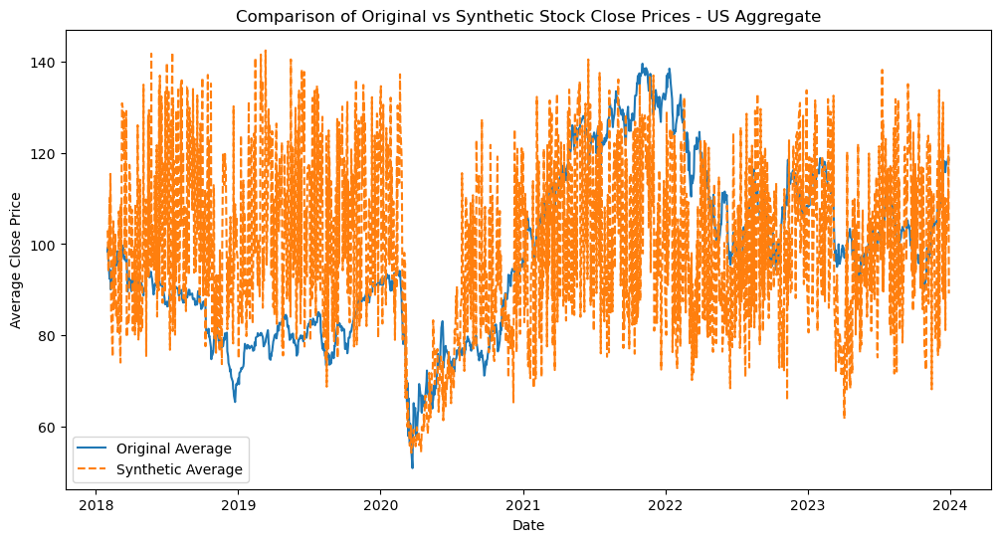

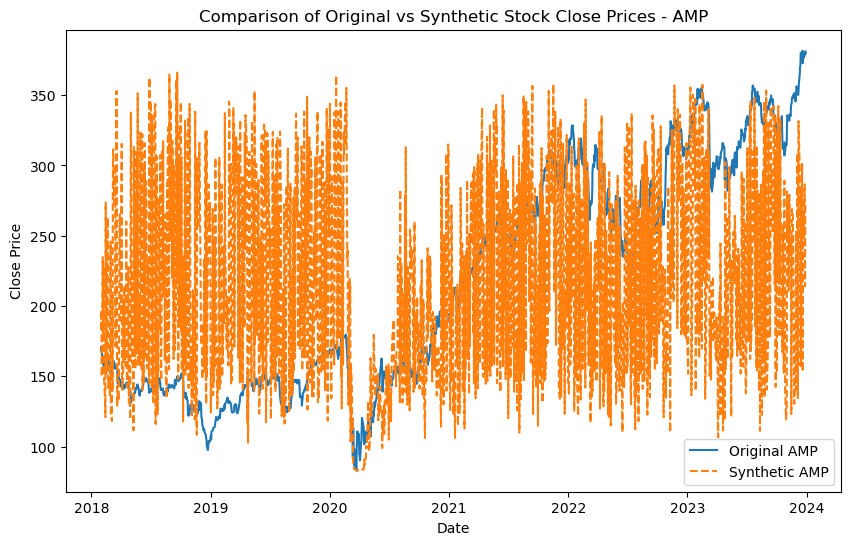

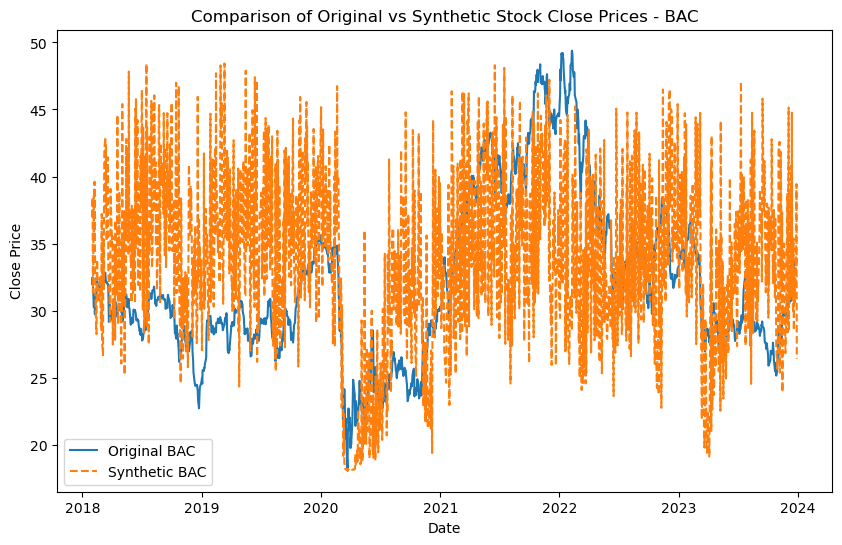

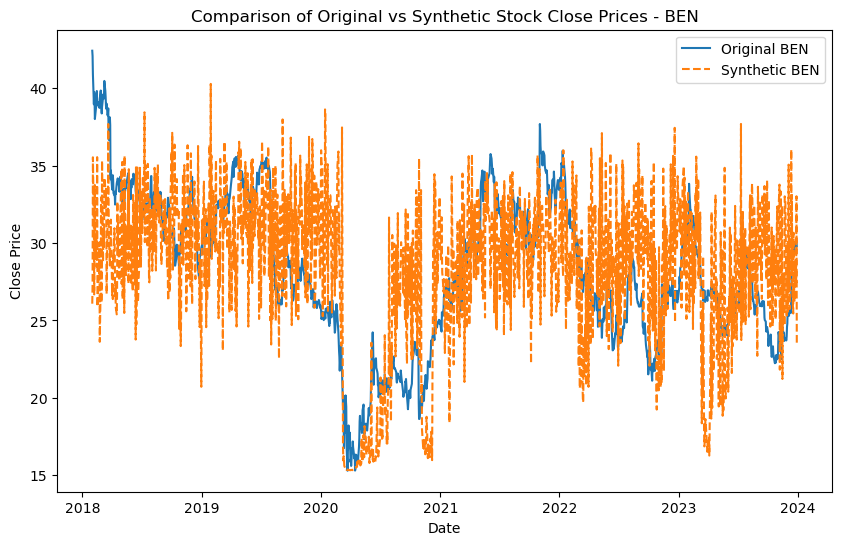

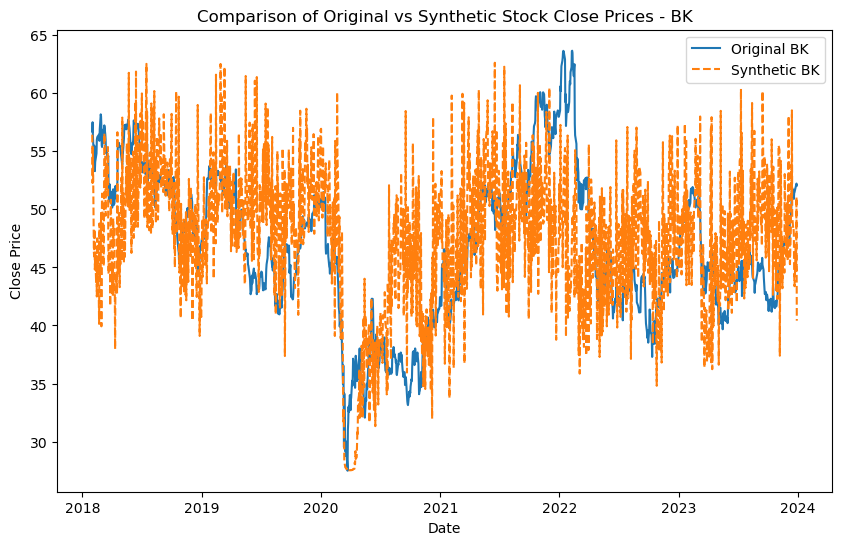

...

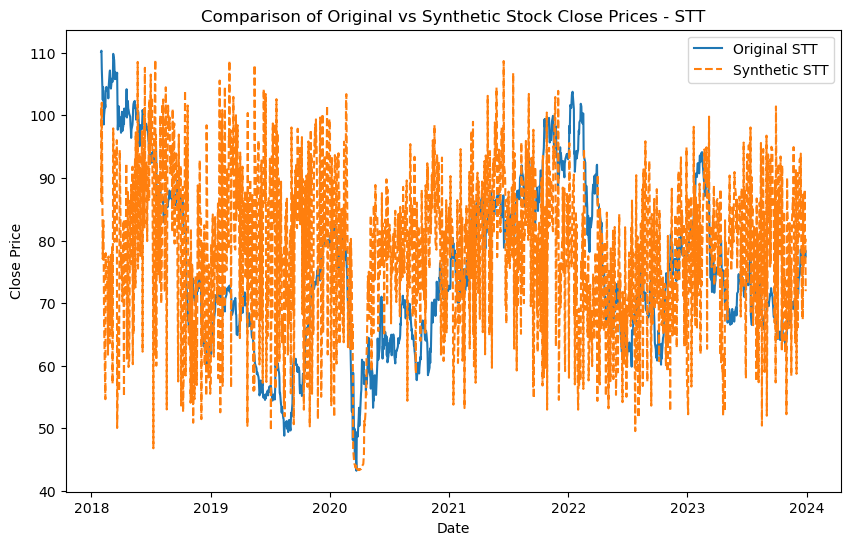

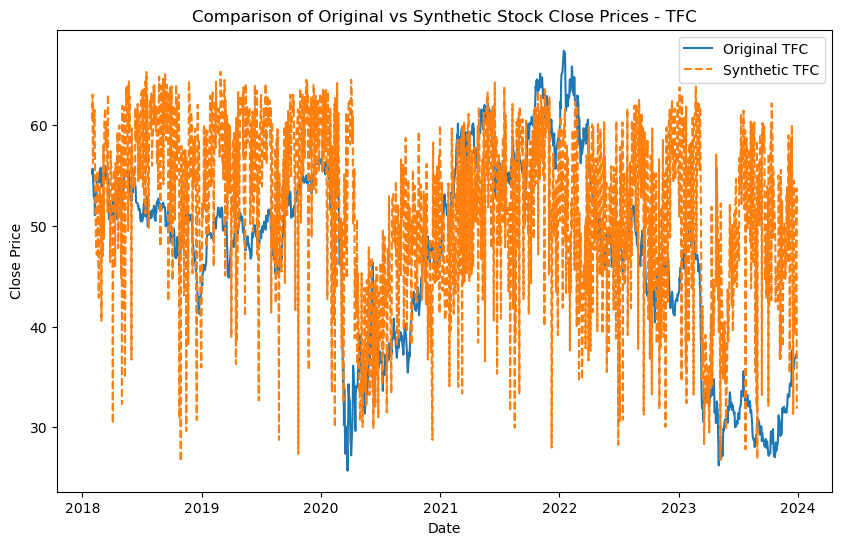

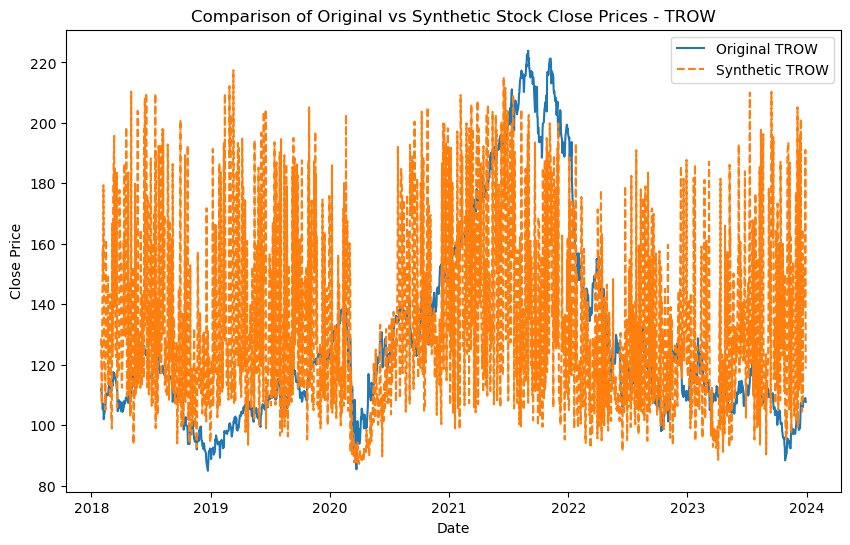

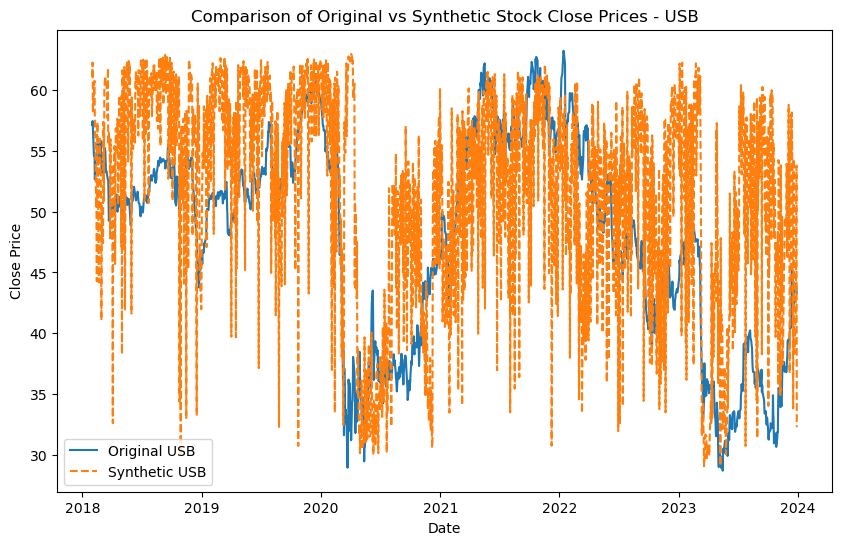

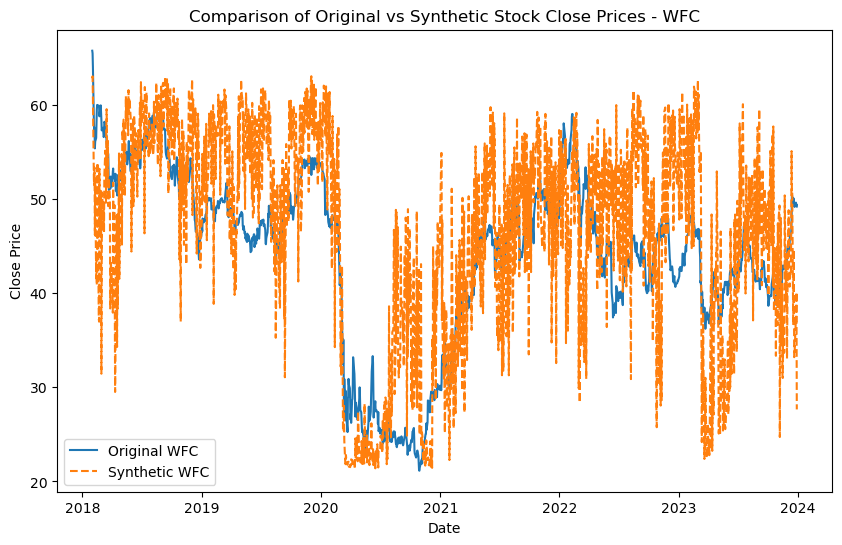


Original Data Statistics:
Ticker          AMP          BAC          BEN           BK          BLK  \
count   1509.000000  1509.000000  1509.000000  1509.000000  1509.000000   
mean     217.838482    32.202253    28.444493    47.010418   621.060278   
std       79.075162     6.110351     5.167557     6.521945   150.405356   
min       82.879997    18.080000    15.300000    27.490000   327.420013   
25%      145.830002    28.309999    25.180000    42.650002   490.209991   
50%      194.330002    30.670000    28.280001    46.560001   612.390015   
75%      293.489990    35.230000    32.240002    51.779999   721.429993   
max      381.619995    49.380001    45.860001    63.660000   971.489990   

Ticker           BX            C          CFG          CMA         FITB  ...  \
count   1509.000000  1509.000000  1509.000000  1509.000000  1509.000000  ...   
mean      72.387515    59.662353    36.922525    68.688913    30.917316  ...   
std       32.205672    11.731600     7.835199    19.28045

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:175: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_avg, label='Original Average', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:176: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_avg, label='Synthetic Average', shade=True)


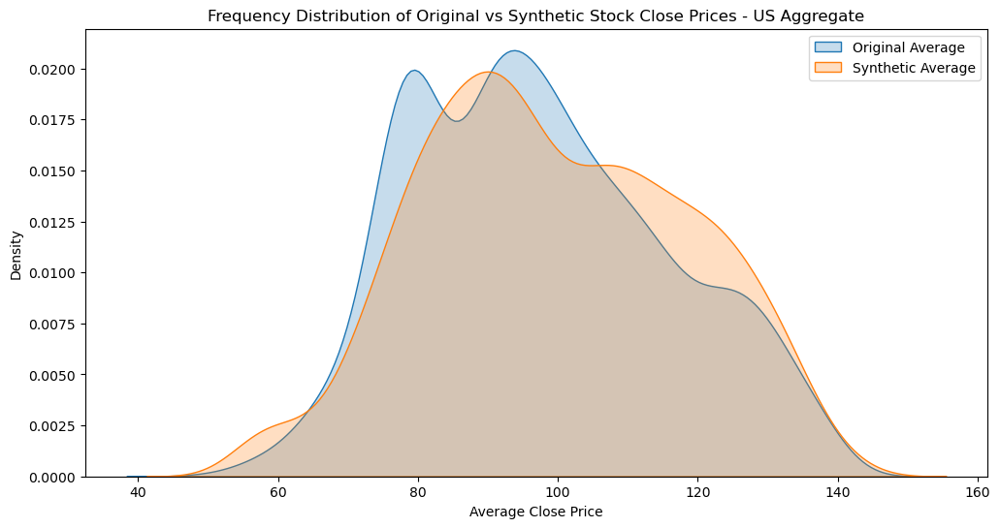

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


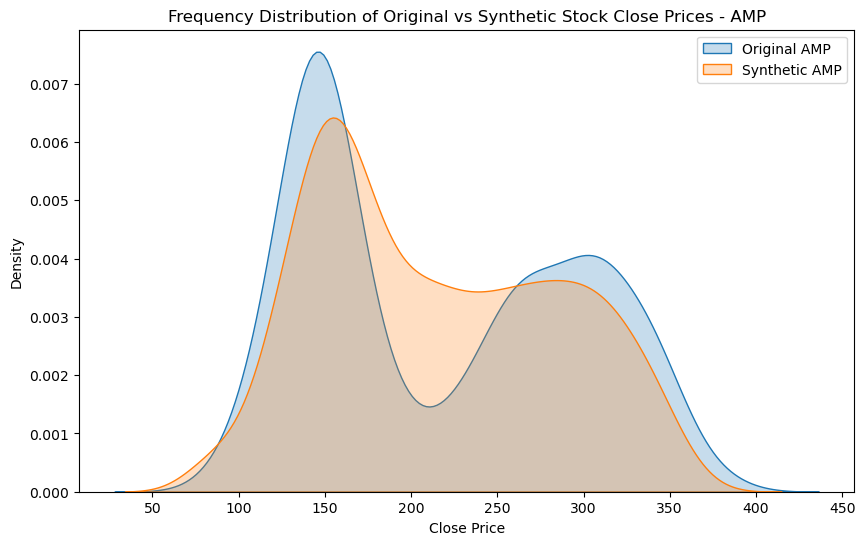

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


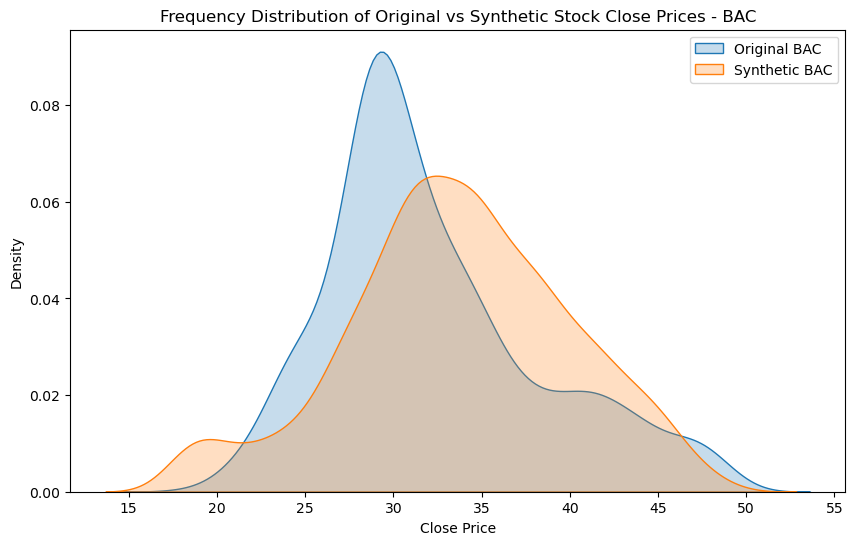

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


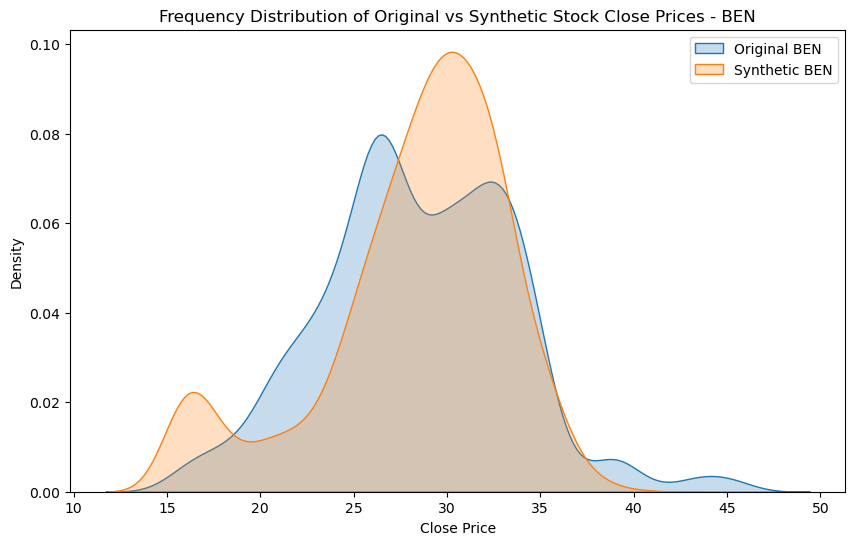

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


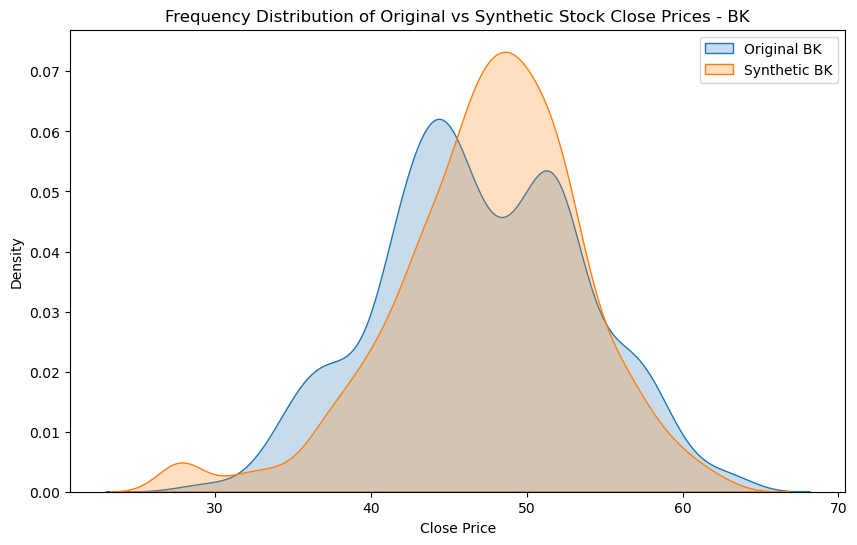

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


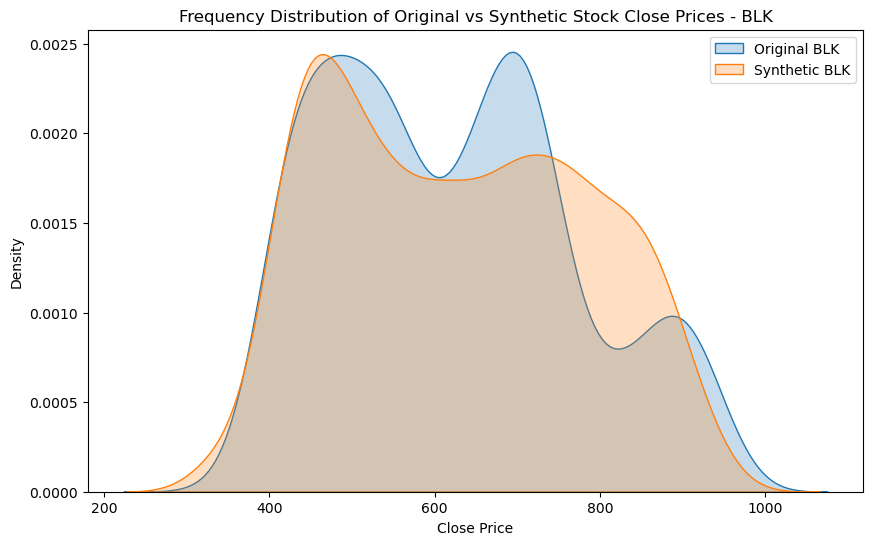

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


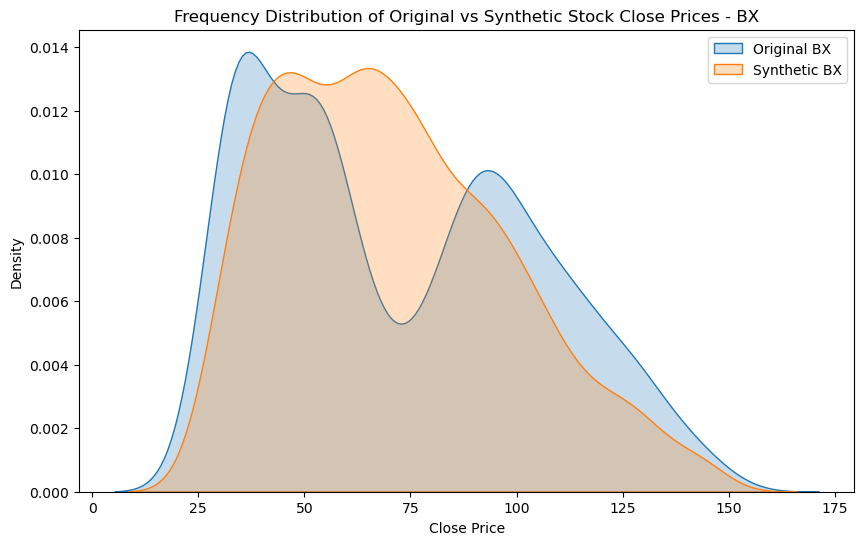

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


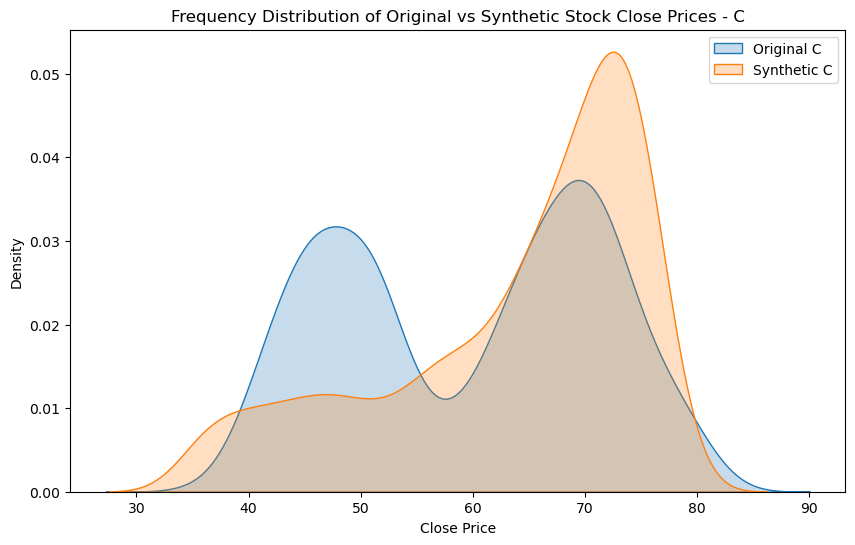

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


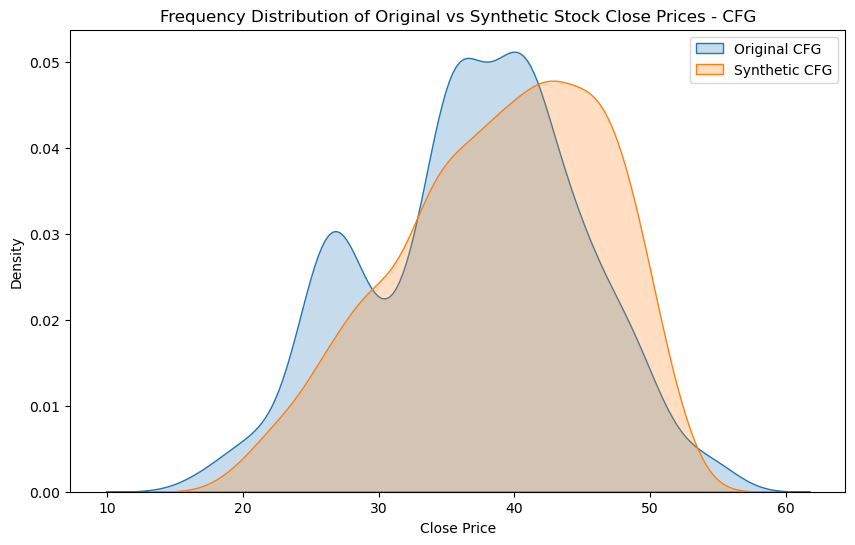

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


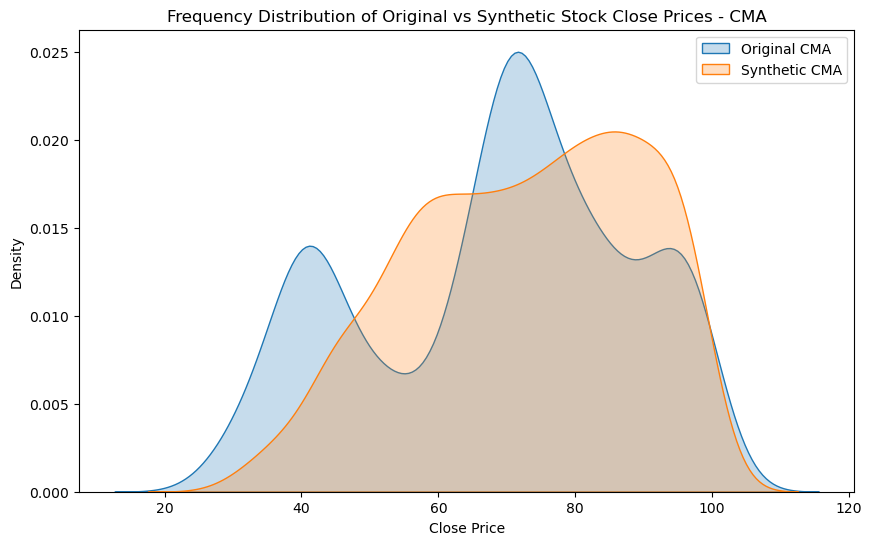

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


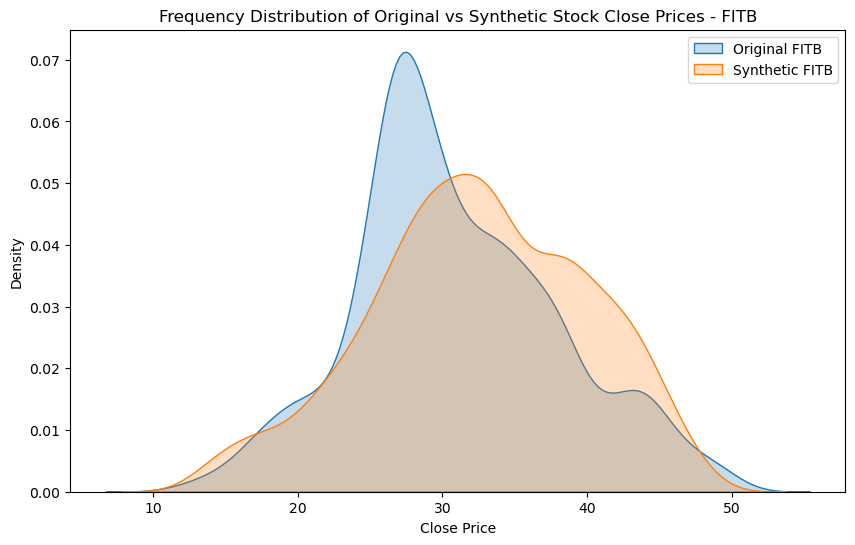

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


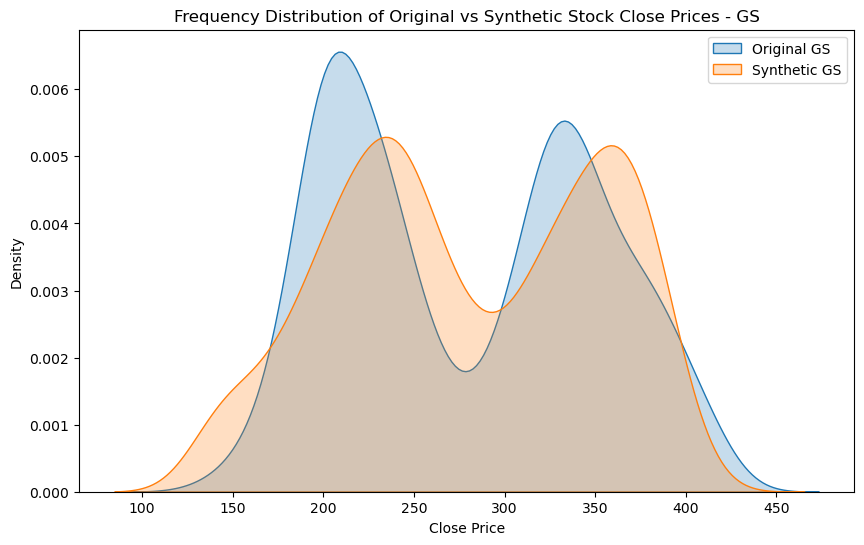

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


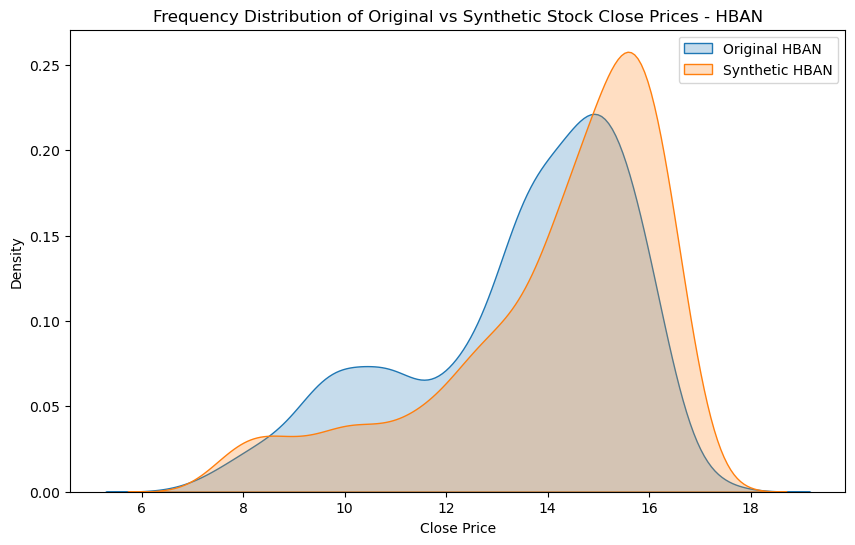

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


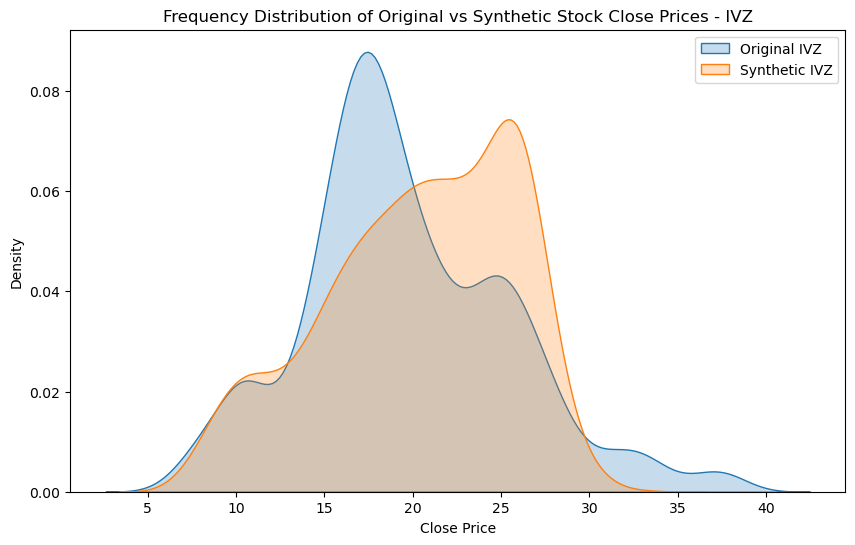

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


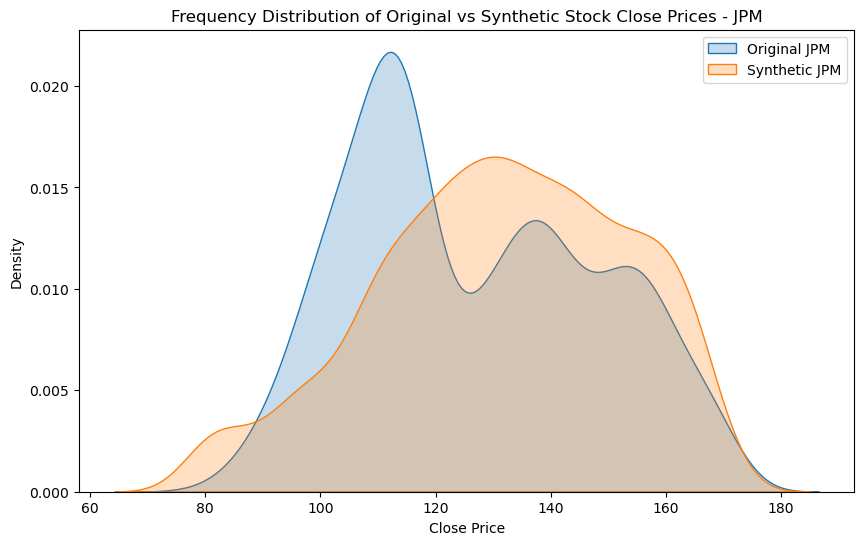

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


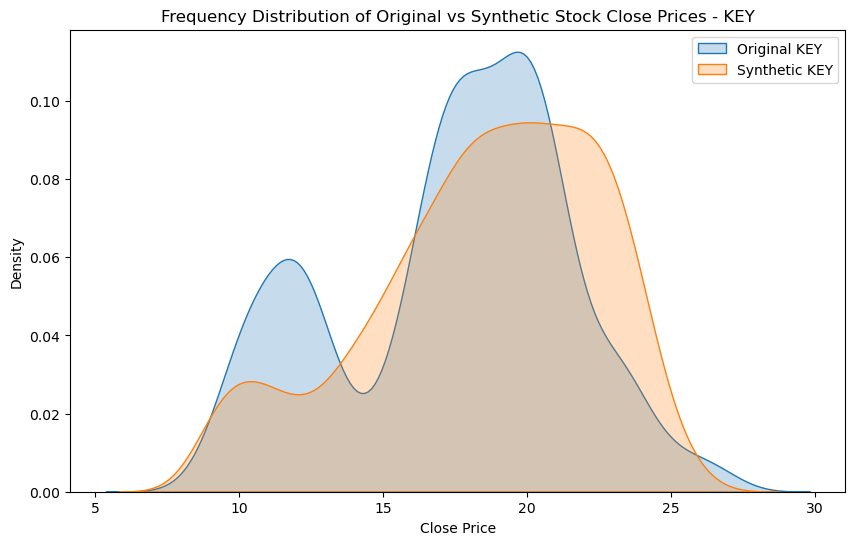

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


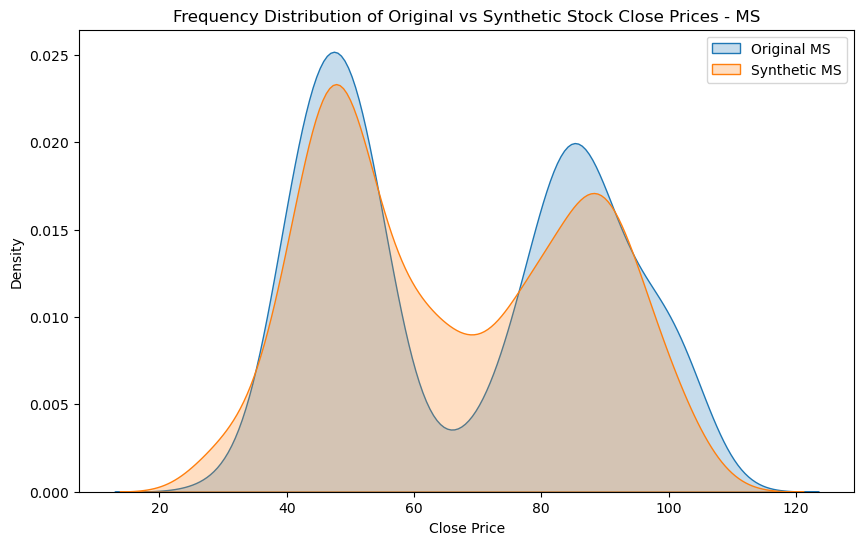

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


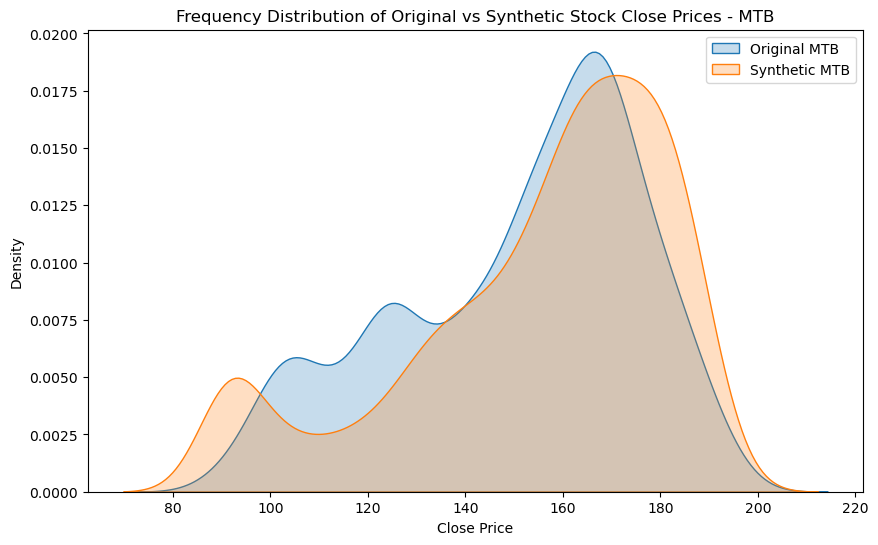

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


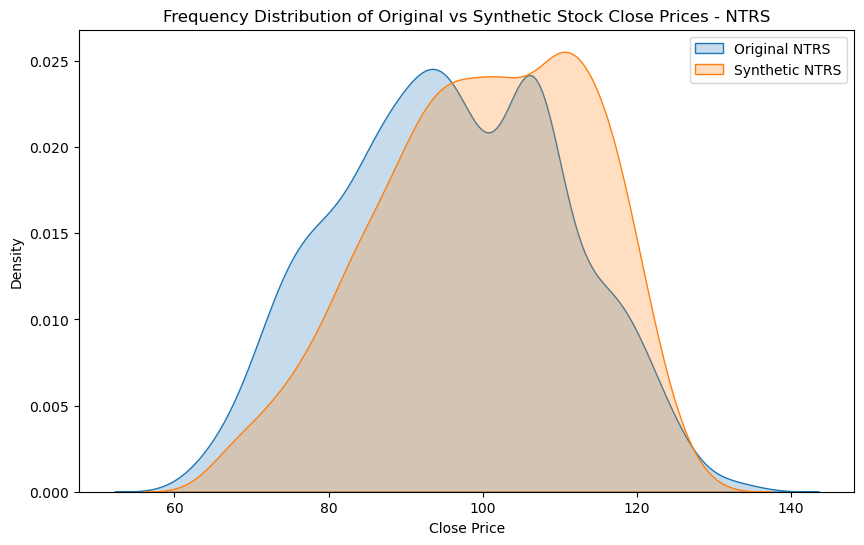

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


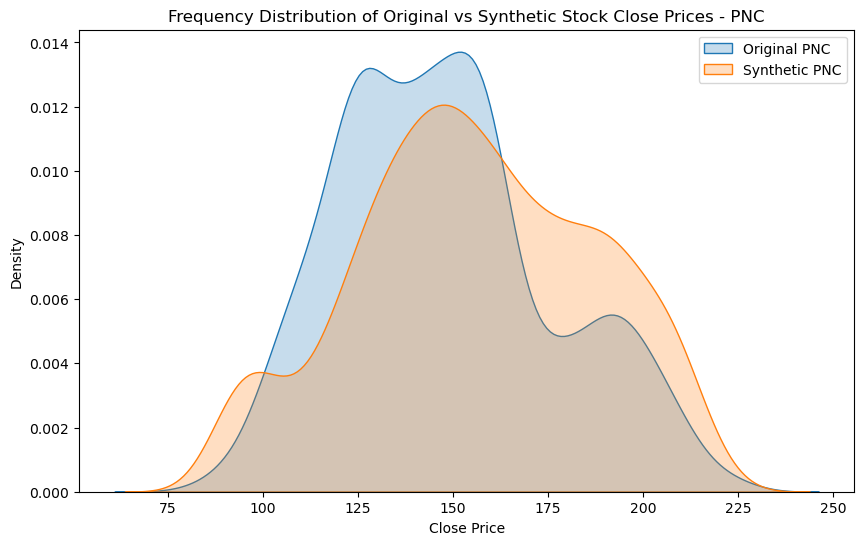

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


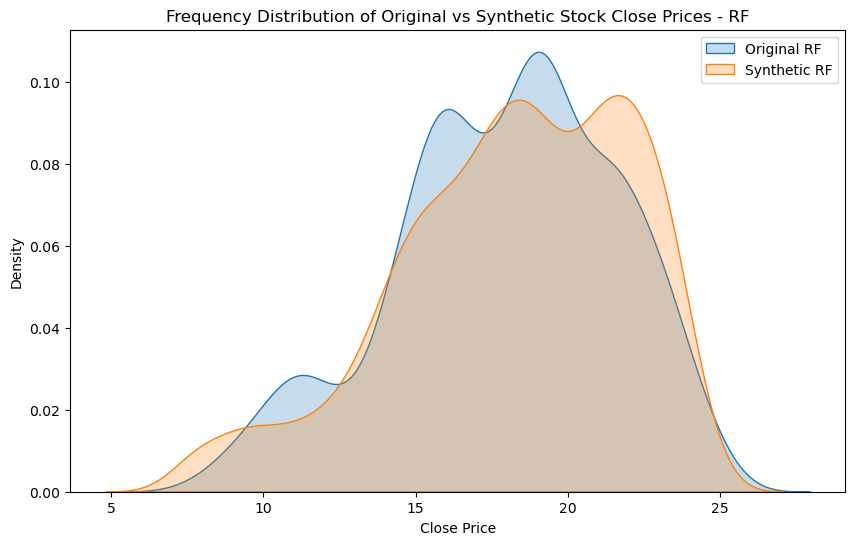

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


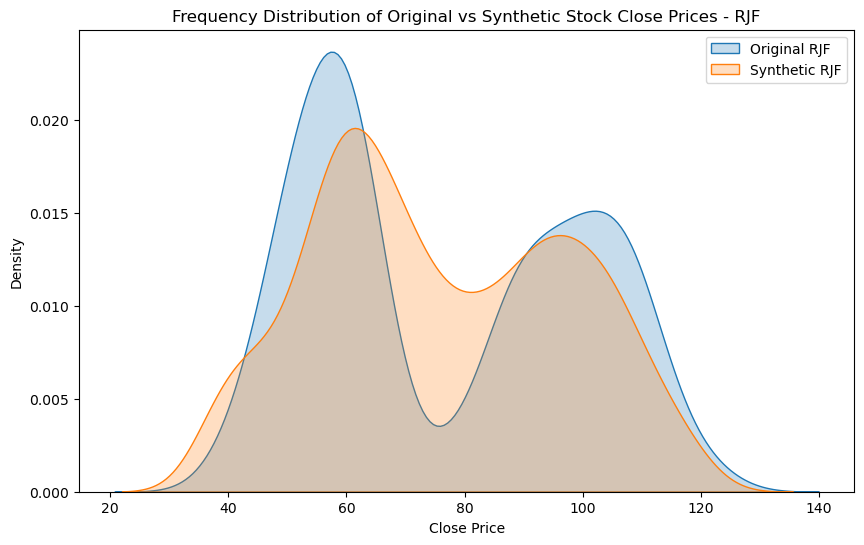

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


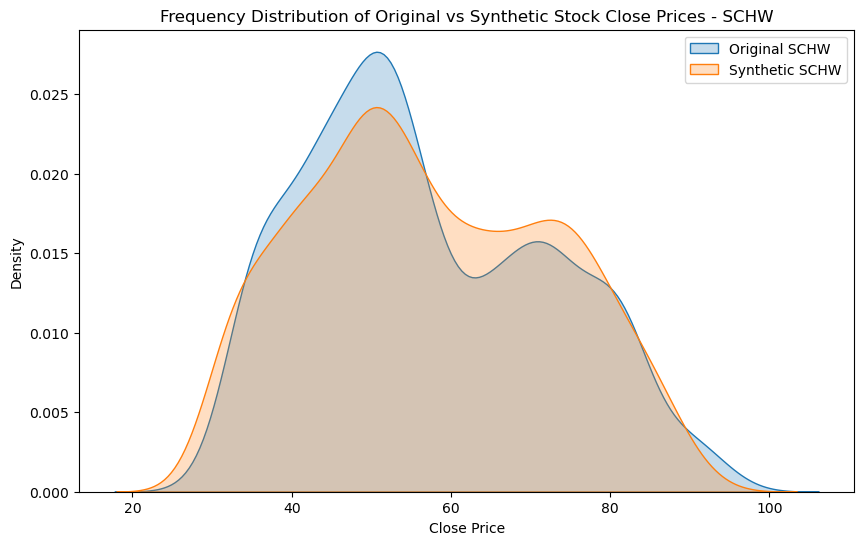

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


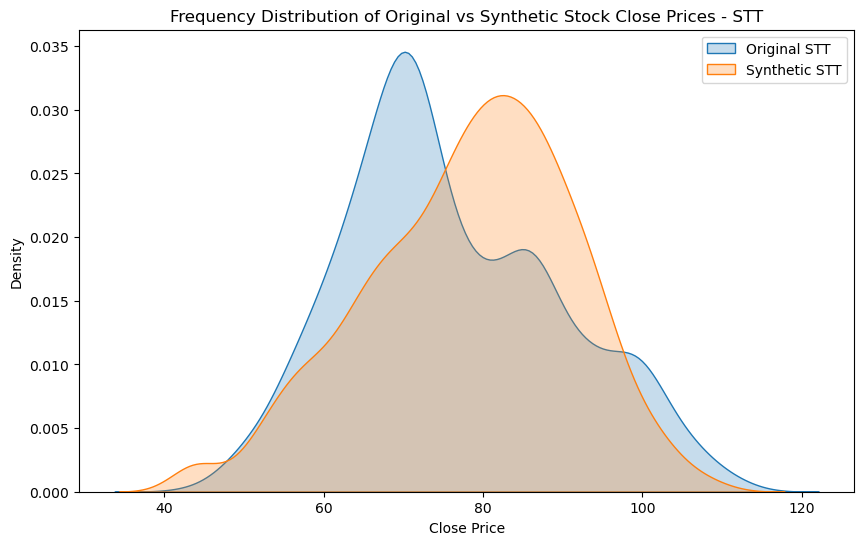

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


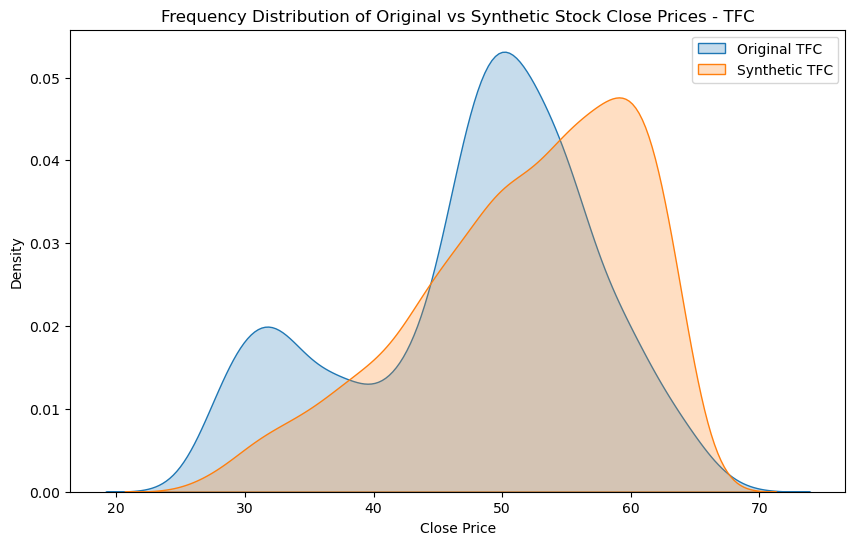

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


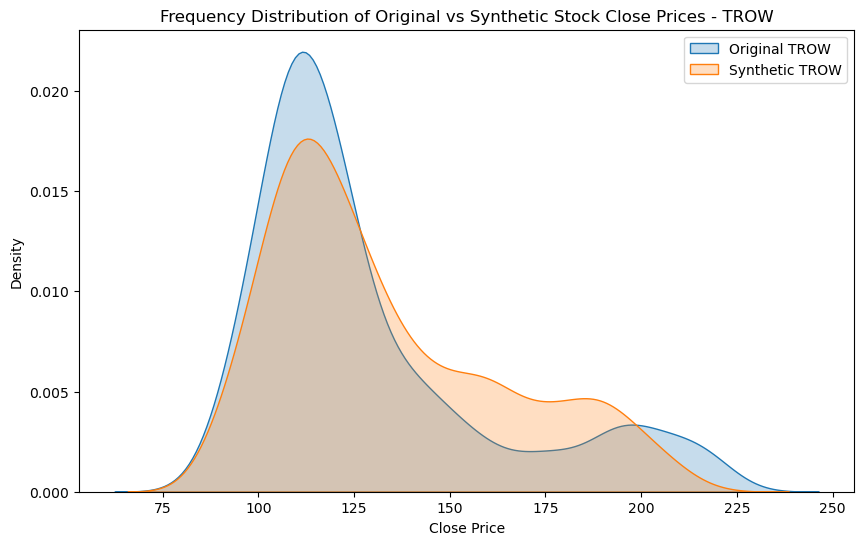

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


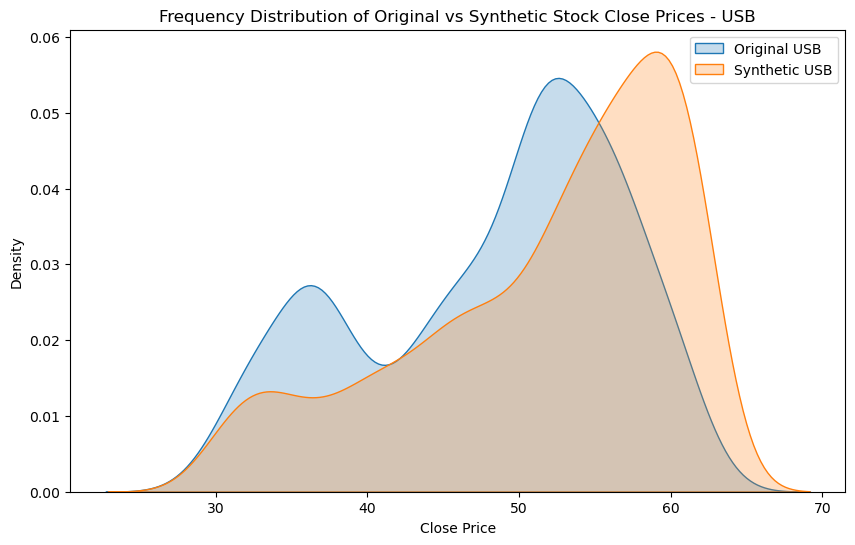

C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
C:\Users\hassa\AppData\Local\Temp\ipykernel_30008\3039884396.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)


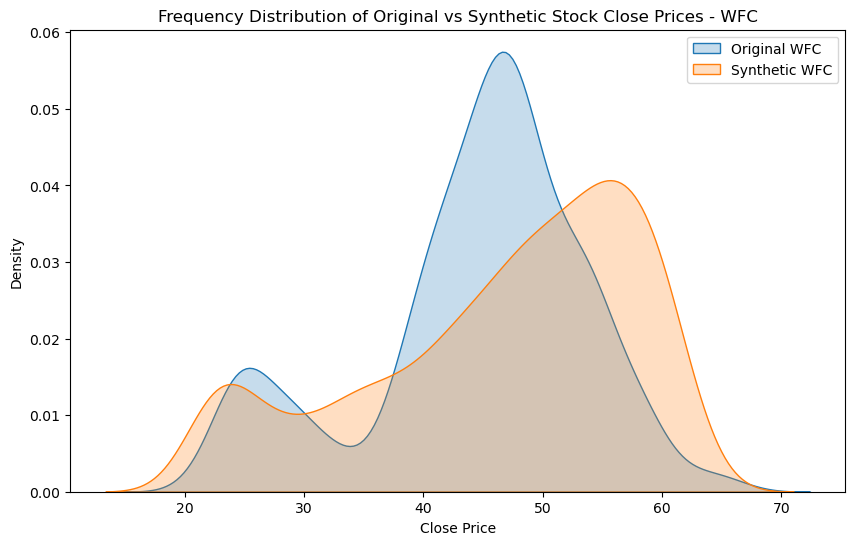

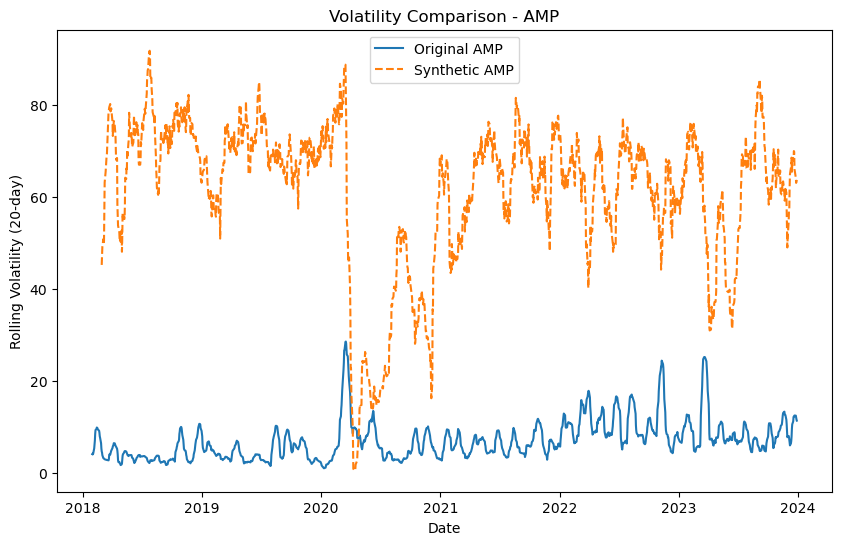


Volatility Statistics for AMP:
Original Volatility:
count    1490.000000
mean        6.997910
std         4.329852
min         0.927529
25%         3.855835
50%         6.244552
75%         8.816041
max        28.504669
Name: AMP, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       61.257458
std        16.132189
min         0.400773
25%        55.702362
50%        66.101114
75%        71.656196
max        91.778299
Name: AMP, dtype: float64


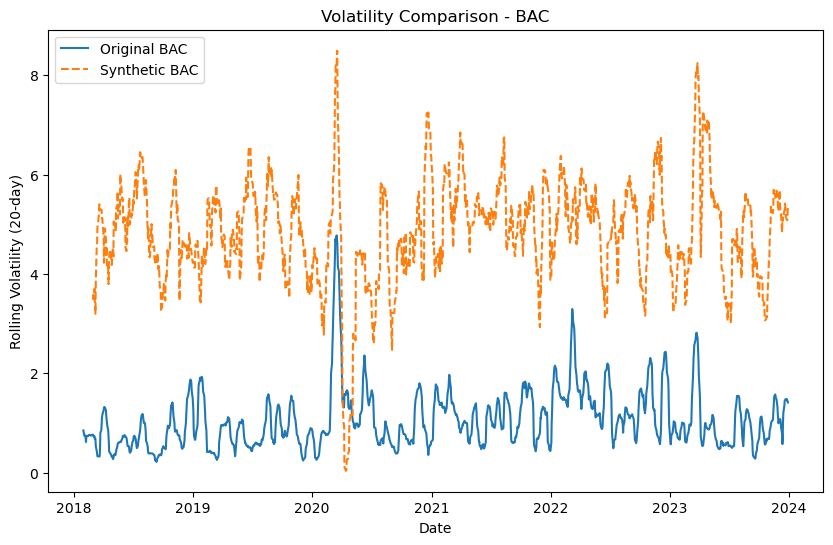


Volatility Statistics for BAC:
Original Volatility:
count    1490.000000
mean        1.068249
std         0.601524
min         0.217092
25%         0.641068
50%         0.946043
75%         1.361907
max         4.775867
Name: BAC, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        4.856849
std         1.053132
min         0.039477
25%         4.276841
50%         4.930210
75%         5.475067
max         8.493190
Name: BAC, dtype: float64


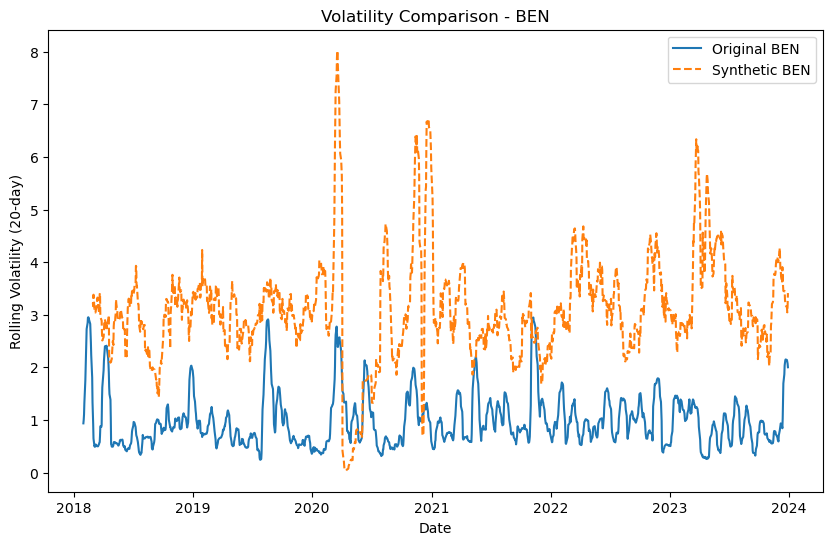


Volatility Statistics for BEN:
Original Volatility:
count    1490.000000
mean        0.988509
std         0.510630
min         0.242137
25%         0.627138
50%         0.861234
75%         1.227190
max         2.947709
Name: BEN, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        3.093948
std         1.016994
min         0.034934
25%         2.630000
50%         3.004255
75%         3.485066
max         8.018666
Name: BEN, dtype: float64


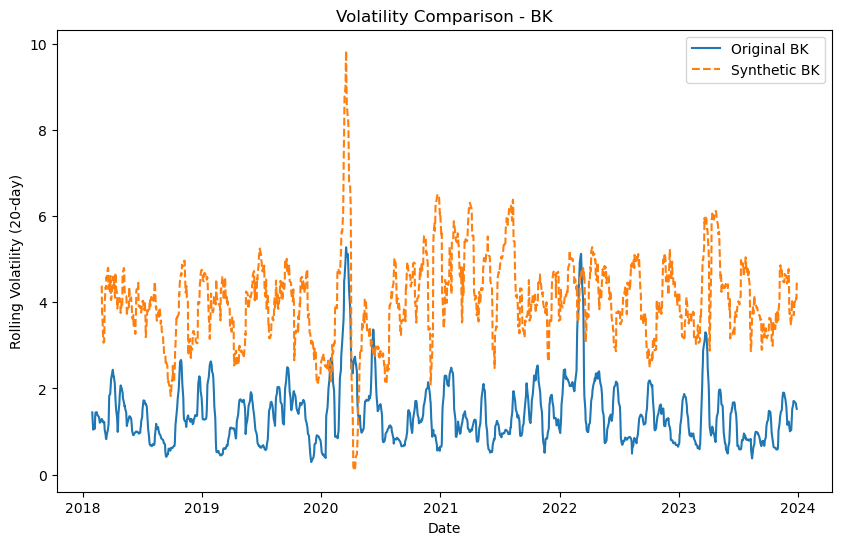


Volatility Statistics for BK:
Original Volatility:
count    1490.000000
mean        1.404105
std         0.727702
min         0.291613
25%         0.891920
50%         1.269651
75%         1.729369
max         5.276299
Name: BK, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        4.075910
std         1.020591
min         0.089329
25%         3.529517
50%         4.046643
75%         4.631100
max         9.839952
Name: BK, dtype: float64


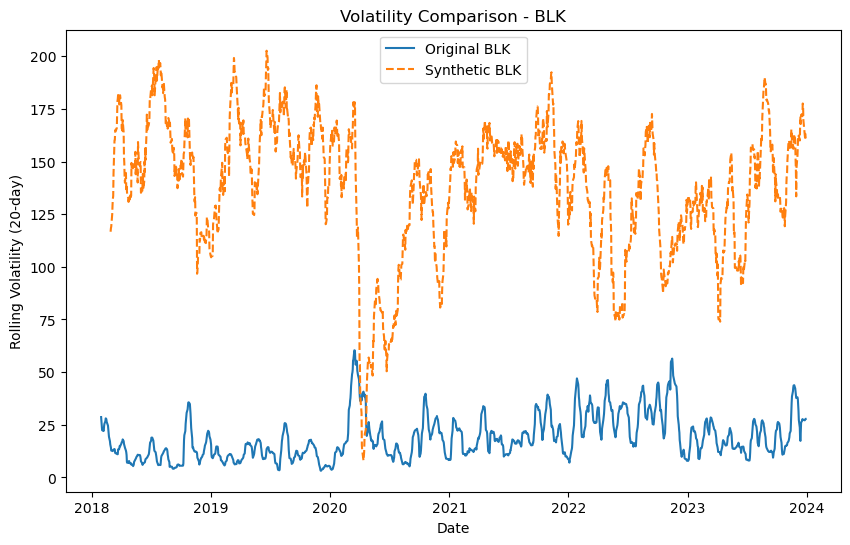


Volatility Statistics for BLK:
Original Volatility:
count    1490.000000
mean       19.009624
std        10.608338
min         3.179070
25%        11.066752
50%        16.444679
75%        24.840471
max        60.388425
Name: BLK, dtype: float64

Synthetic Volatility:
count    1470.000000
mean      138.123396
std        31.688181
min         7.996562
25%       121.404554
50%       144.208043
75%       159.283010
max       202.632616
Name: BLK, dtype: float64


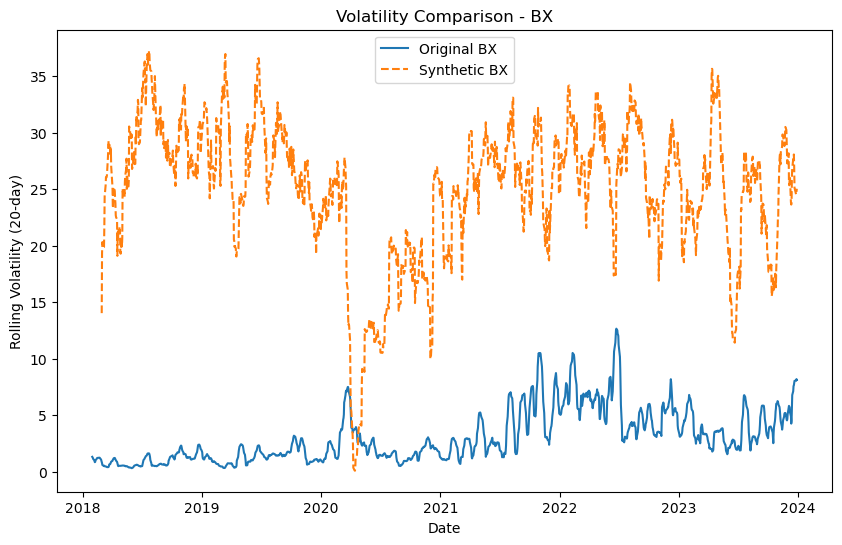


Volatility Statistics for BX:
Original Volatility:
count    1490.000000
mean        3.055759
std         2.338081
min         0.298207
25%         1.246115
50%         2.353171
75%         4.428494
max        12.654747
Name: BX, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       25.004345
std         6.150113
min         0.073916
25%        22.361320
50%        26.082477
75%        29.109010
max        37.272598
Name: BX, dtype: float64


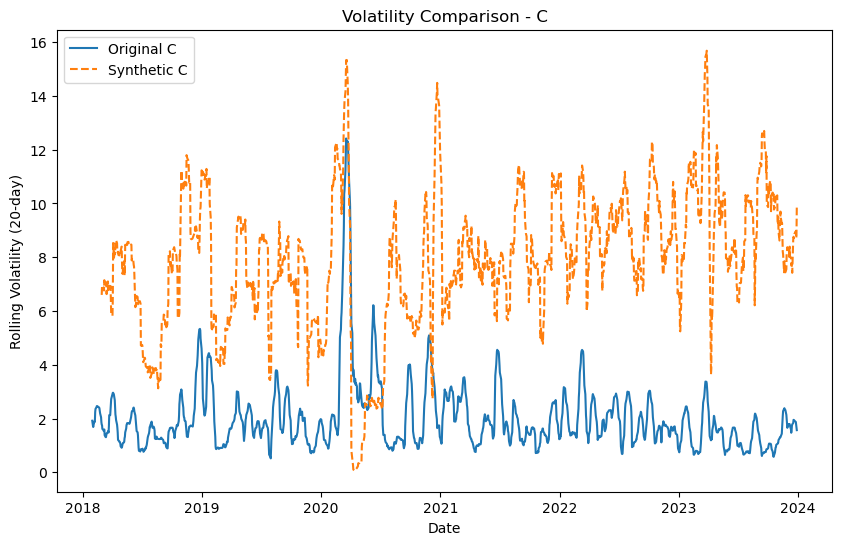


Volatility Statistics for C:
Original Volatility:
count    1490.000000
mean        2.022438
std         1.367570
min         0.517947
25%         1.235440
50%         1.703359
75%         2.408753
max        12.416570
Name: C, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        7.893050
std         2.546231
min         0.058122
25%         6.556283
50%         7.993622
75%         9.499450
max        15.680775
Name: C, dtype: float64


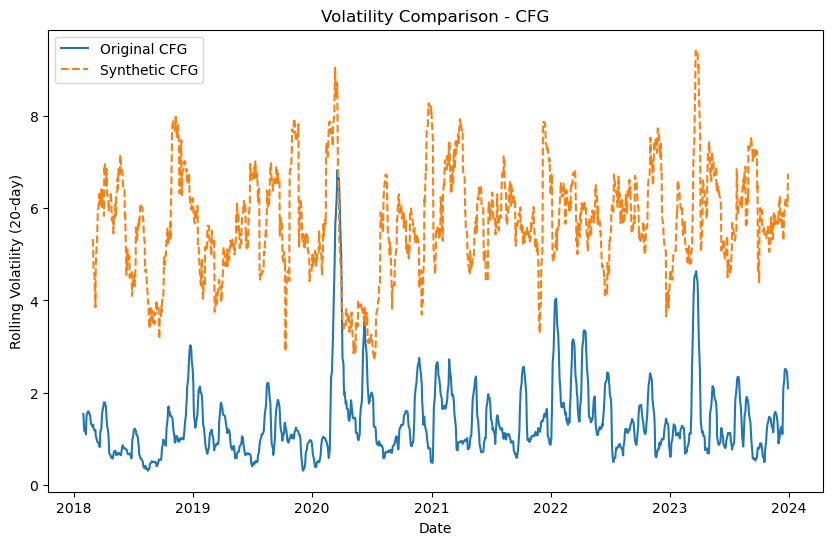


Volatility Statistics for CFG:
Original Volatility:
count    1490.000000
mean        1.382865
std         0.838030
min         0.317067
25%         0.877387
50%         1.165774
75%         1.665094
max         6.816311
Name: CFG, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        5.703893
std         1.131340
min         2.708490
25%         5.051779
50%         5.696963
75%         6.396016
max         9.403080
Name: CFG, dtype: float64


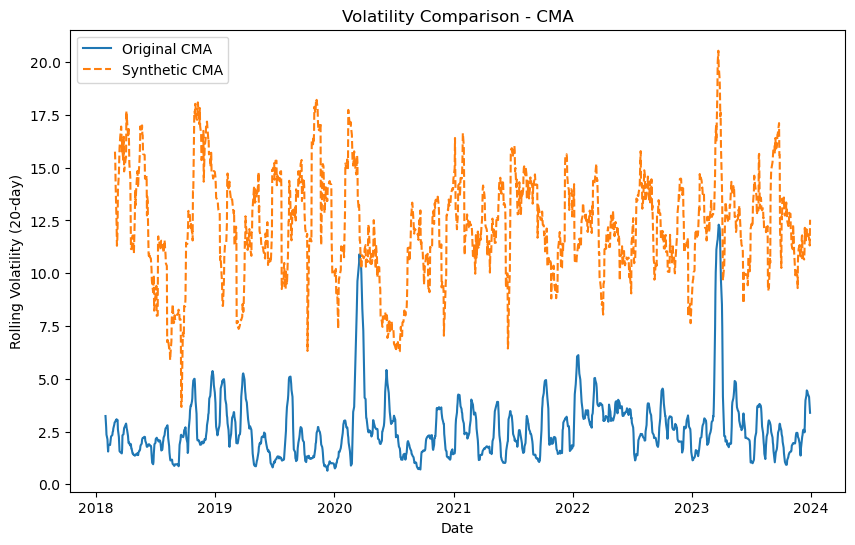


Volatility Statistics for CMA:
Original Volatility:
count    1490.000000
mean        2.635235
std         1.540136
min         0.644891
25%         1.672213
50%         2.310380
75%         3.193809
max        12.301122
Name: CMA, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       12.215933
std         2.484440
min         3.666431
25%        10.746648
50%        12.132424
75%        13.903681
max        20.540756
Name: CMA, dtype: float64


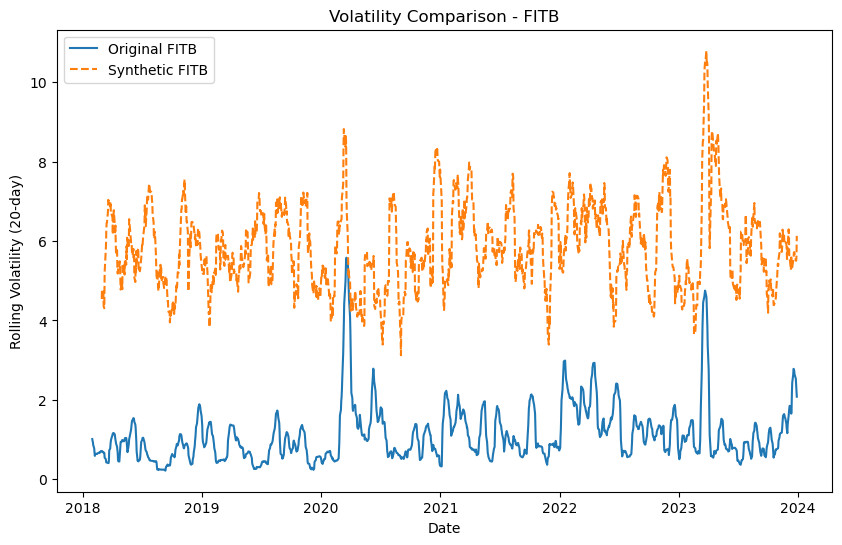


Volatility Statistics for FITB:
Original Volatility:
count    1490.000000
mean        1.124715
std         0.733961
min         0.214746
25%         0.655771
50%         0.942167
75%         1.385287
max         5.581288
Name: FITB, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        5.859189
std         1.076017
min         3.123189
25%         5.085499
50%         5.755590
75%         6.563919
max        10.796055
Name: FITB, dtype: float64


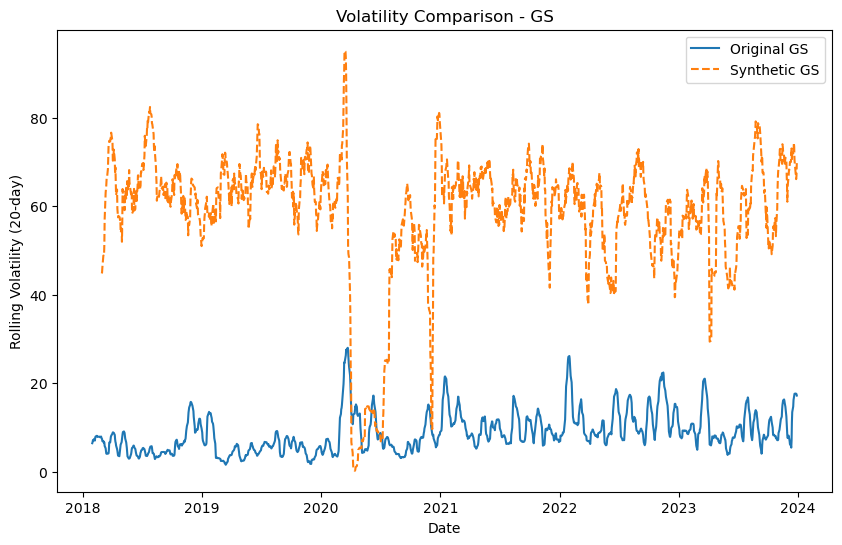


Volatility Statistics for GS:
Original Volatility:
count    1490.000000
mean        8.886718
std         4.567119
min         1.609792
25%         5.711084
50%         7.919178
75%        11.232439
max        28.028268
Name: GS, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       58.527764
std        14.531897
min         0.262974
25%        55.454609
50%        62.037645
75%        66.462058
max        95.124035
Name: GS, dtype: float64


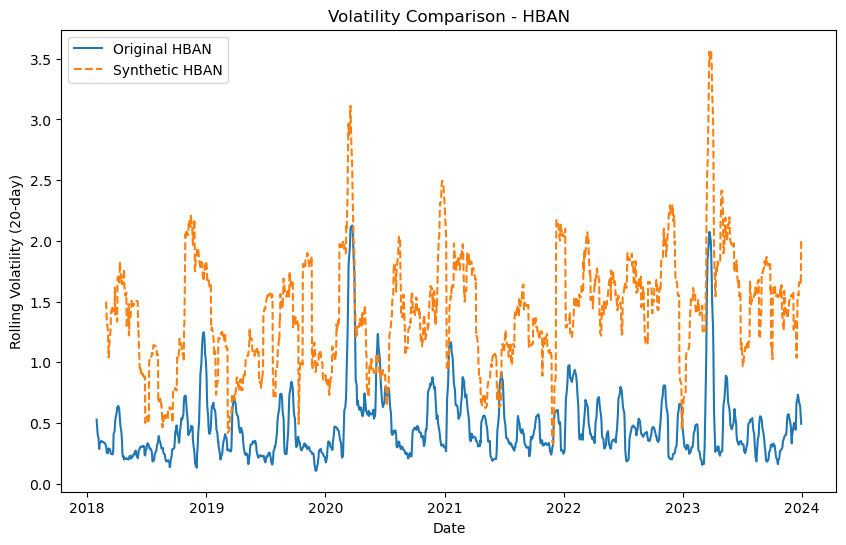


Volatility Statistics for HBAN:
Original Volatility:
count    1490.000000
mean        0.469584
std         0.288149
min         0.106396
25%         0.290076
50%         0.389663
75%         0.566686
max         2.127789
Name: HBAN, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        1.416398
std         0.468388
min         0.328743
25%         1.098258
50%         1.424945
75%         1.679211
max         3.565961
Name: HBAN, dtype: float64


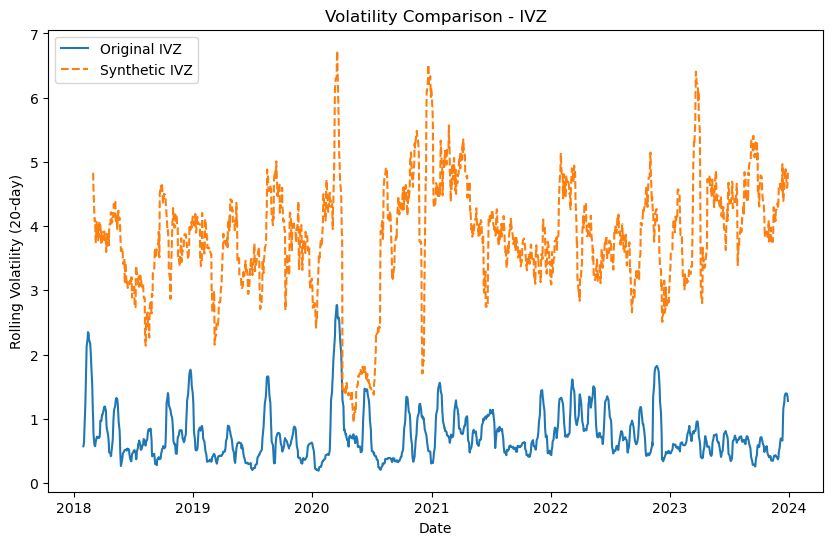


Volatility Statistics for IVZ:
Original Volatility:
count    1490.000000
mean        0.748959
std         0.392714
min         0.191626
25%         0.483629
50%         0.655044
75%         0.885254
max         2.772245
Name: IVZ, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        3.840247
std         0.887529
min         0.942250
25%         3.391674
50%         3.884457
75%         4.375259
max         6.731132
Name: IVZ, dtype: float64


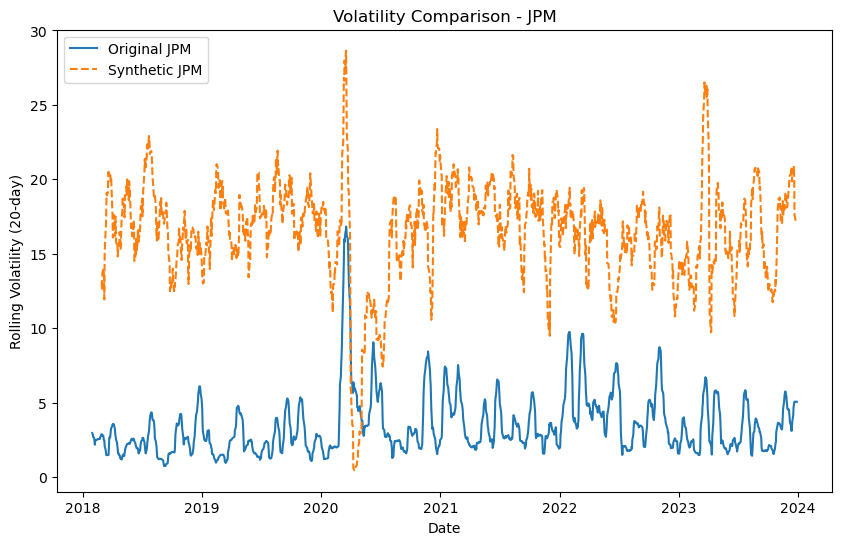


Volatility Statistics for JPM:
Original Volatility:
count    1490.000000
mean        3.472631
std         2.121294
min         0.737118
25%         2.070765
50%         2.791222
75%         4.345857
max        16.826396
Name: JPM, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       16.485687
std         3.403375
min         0.426273
25%        14.992190
50%        16.943186
75%        18.374117
max        28.637057
Name: JPM, dtype: float64


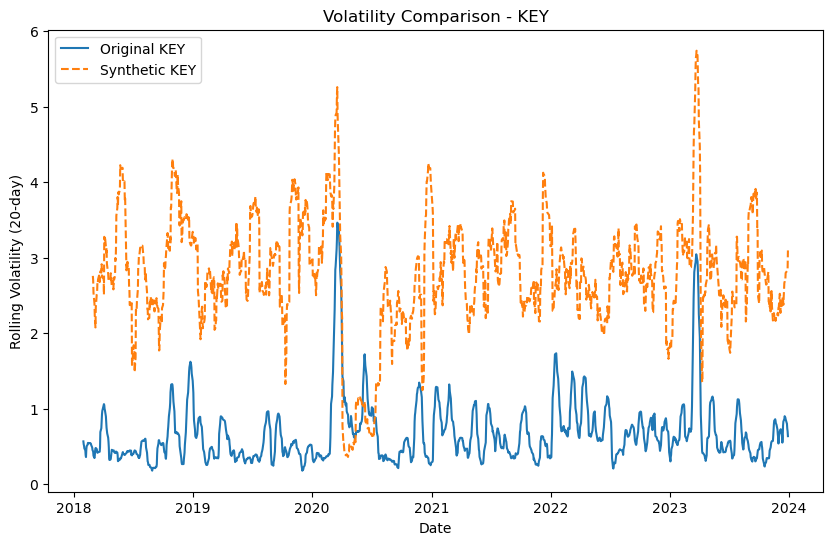


Volatility Statistics for KEY:
Original Volatility:
count    1490.000000
mean        0.674108
std         0.438530
min         0.176709
25%         0.399456
50%         0.568292
75%         0.813902
max         3.463867
Name: KEY, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        2.775363
std         0.763854
min         0.359390
25%         2.398096
50%         2.762791
75%         3.176880
max         5.741749
Name: KEY, dtype: float64


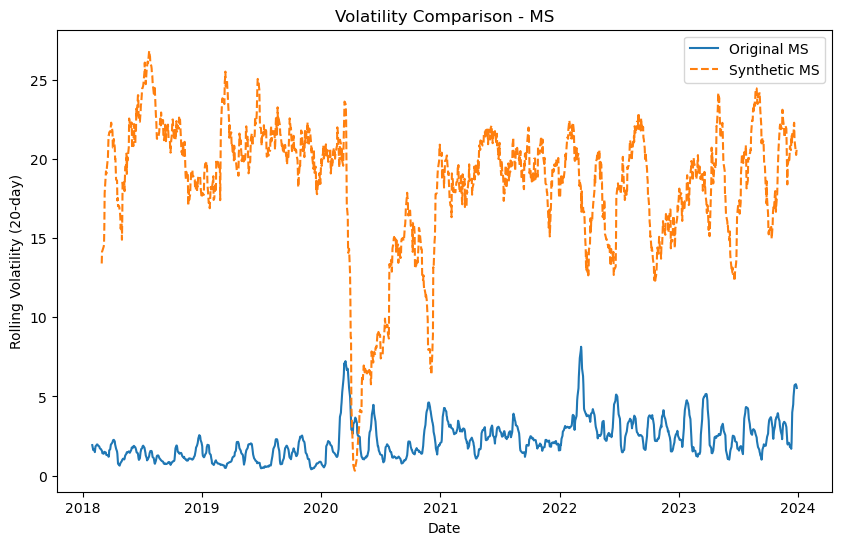


Volatility Statistics for MS:
Original Volatility:
count    1490.000000
mean        2.225059
std         1.211754
min         0.398279
25%         1.357315
50%         1.976241
75%         2.865750
max         8.133371
Name: MS, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       18.413168
std         4.189401
min         0.309674
25%        16.949483
50%        19.443195
75%        21.009417
max        26.820721
Name: MS, dtype: float64


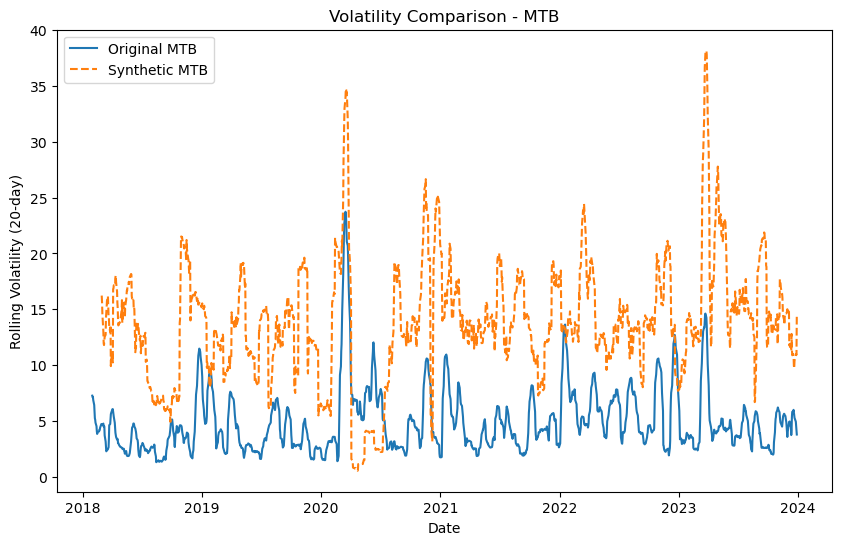


Volatility Statistics for MTB:
Original Volatility:
count    1490.000000
mean        4.902226
std         2.924472
min         1.300340
25%         2.863952
50%         4.181207
75%         5.964637
max        23.729912
Name: MTB, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       13.791065
std         5.394338
min         0.535150
25%        11.265783
50%        13.606081
75%        16.371930
max        38.153288
Name: MTB, dtype: float64


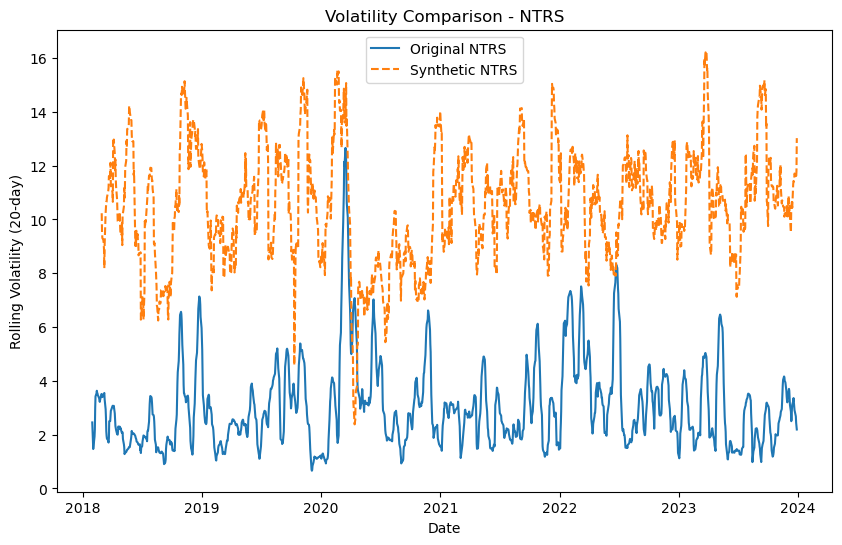


Volatility Statistics for NTRS:
Original Volatility:
count    1490.000000
mean        3.063764
std         1.633745
min         0.658337
25%         1.903455
50%         2.728214
75%         3.695102
max        12.657999
Name: NTRS, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       10.530709
std         2.103596
min         2.381869
25%         9.080050
50%        10.566153
75%        11.890044
max        16.271428
Name: NTRS, dtype: float64


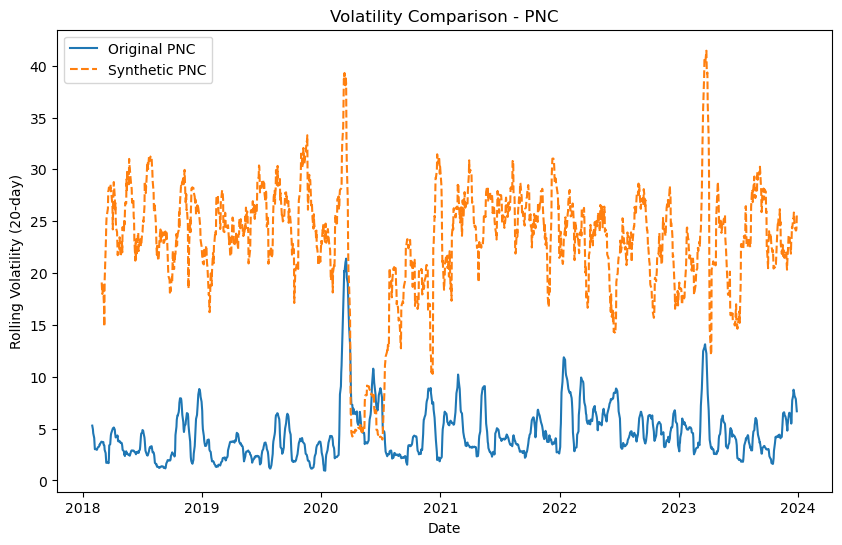


Volatility Statistics for PNC:
Original Volatility:
count    1490.000000
mean        4.540674
std         2.595152
min         0.941960
25%         2.819157
50%         3.937572
75%         5.627297
max        21.391123
Name: PNC, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       23.087549
std         5.689802
min         3.948357
25%        20.922302
50%        23.911414
75%        26.477163
max        41.440120
Name: PNC, dtype: float64


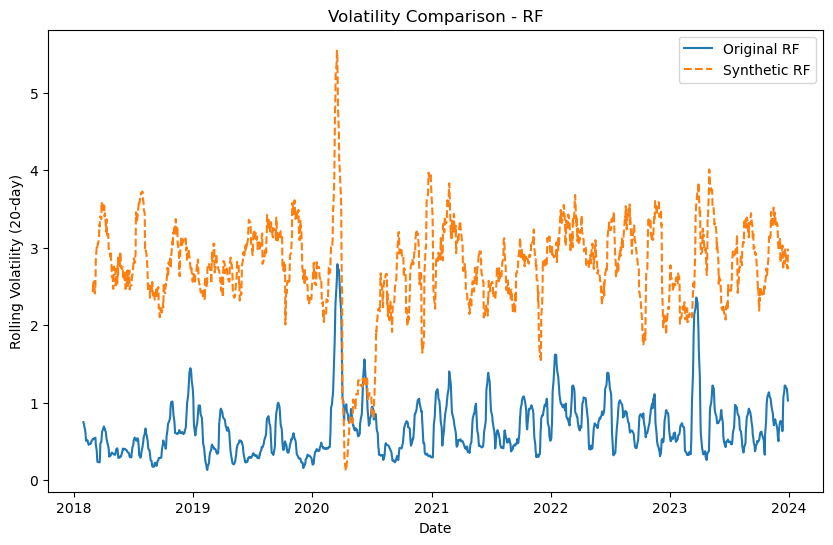


Volatility Statistics for RF:
Original Volatility:
count    1490.000000
mean        0.666219
std         0.365272
min         0.130146
25%         0.411951
50%         0.593554
75%         0.842993
max         2.786466
Name: RF, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        2.757430
std         0.611968
min         0.119289
25%         2.487480
50%         2.799971
75%         3.126733
max         5.543260
Name: RF, dtype: float64


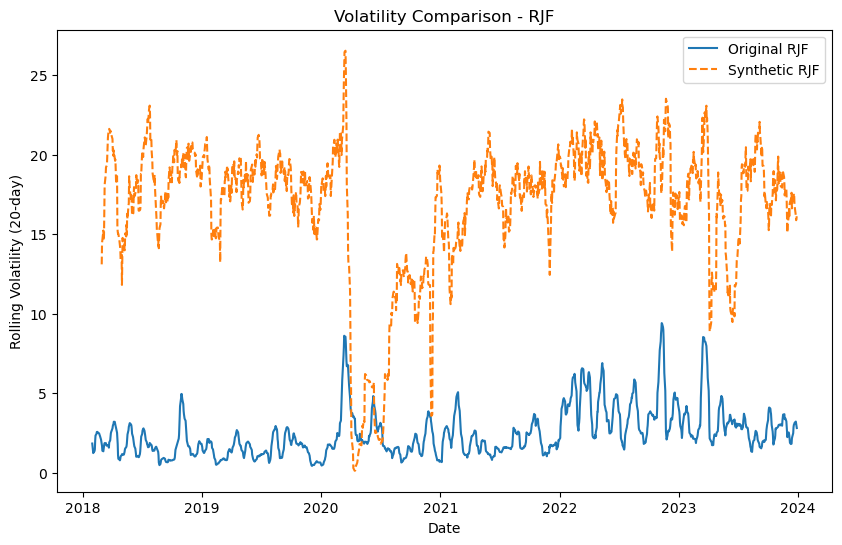


Volatility Statistics for RJF:
Original Volatility:
count    1490.000000
mean        2.489246
std         1.529482
min         0.429107
25%         1.471267
50%         2.078157
75%         3.074005
max         9.404824
Name: RJF, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       16.828626
std         4.348374
min         0.120750
25%        15.773552
50%        17.973371
75%        19.340448
max        26.536786
Name: RJF, dtype: float64


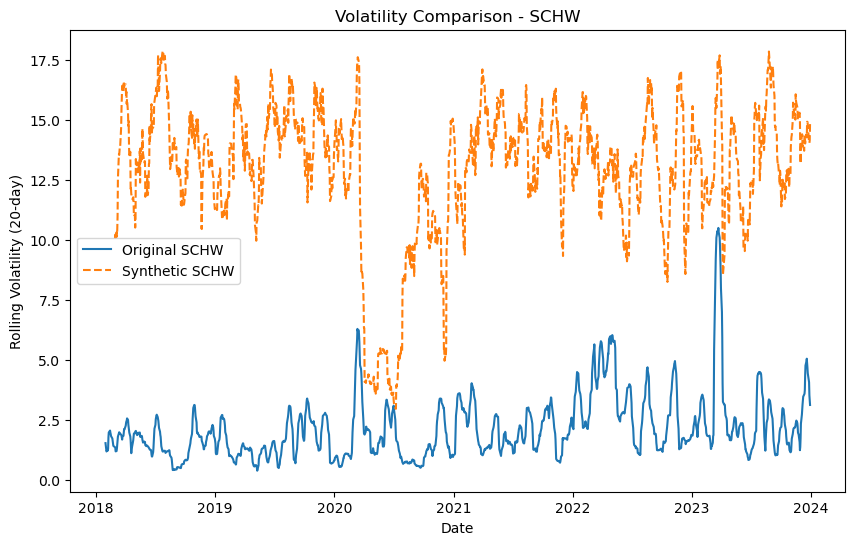


Volatility Statistics for SCHW:
Original Volatility:
count    1490.000000
mean        2.148789
std         1.369245
min         0.375139
25%         1.258678
50%         1.827569
75%         2.672236
max        10.507982
Name: SCHW, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       12.927457
std         2.884901
min         2.959109
25%        11.868569
50%        13.463790
75%        14.773238
max        17.903336
Name: SCHW, dtype: float64


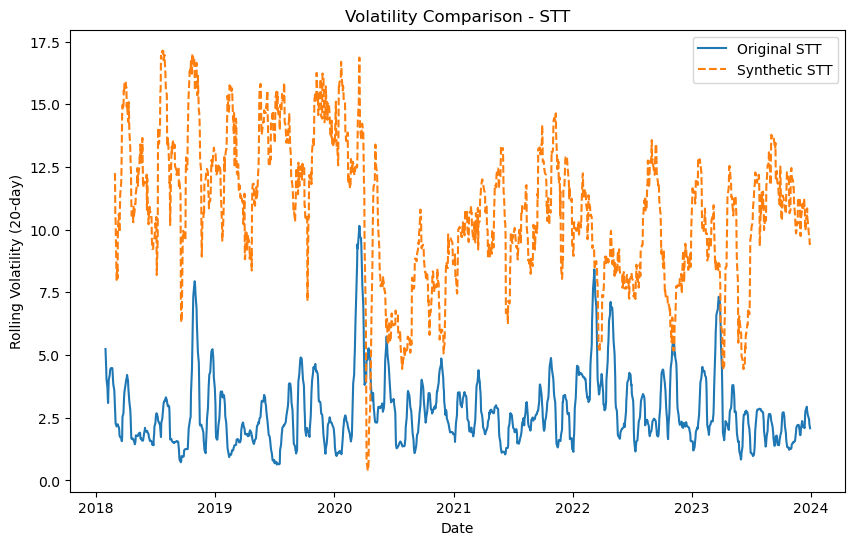


Volatility Statistics for STT:
Original Volatility:
count    1490.000000
mean        2.782836
std         1.442855
min         0.630089
25%         1.810426
50%         2.444136
75%         3.386389
max        10.153294
Name: STT, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       10.715103
std         2.825742
min         0.386233
25%         8.794228
50%        10.807750
75%        12.532287
max        17.137986
Name: STT, dtype: float64


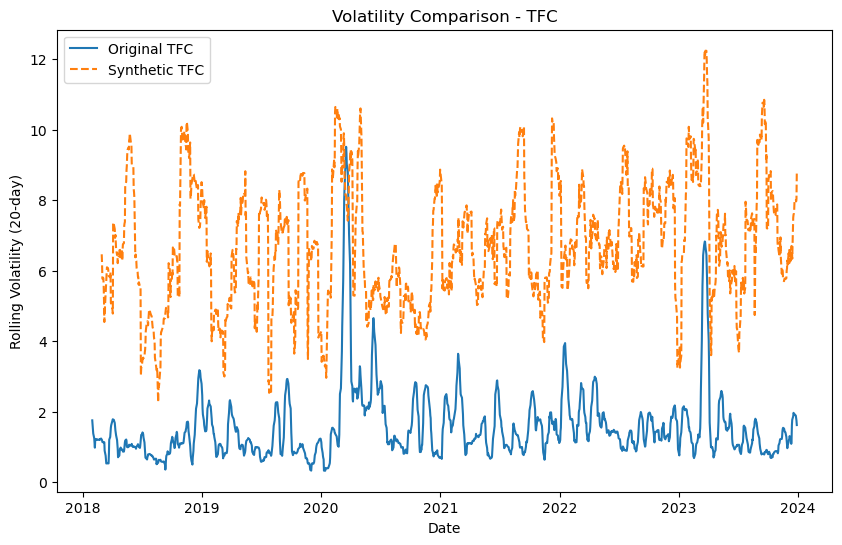


Volatility Statistics for TFC:
Original Volatility:
count    1490.000000
mean        1.569688
std         1.066577
min         0.327161
25%         0.978030
50%         1.288527
75%         1.833365
max         9.517688
Name: TFC, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        6.716944
std         1.740613
min         2.269721
25%         5.497094
50%         6.610526
75%         7.902270
max        12.243771
Name: TFC, dtype: float64


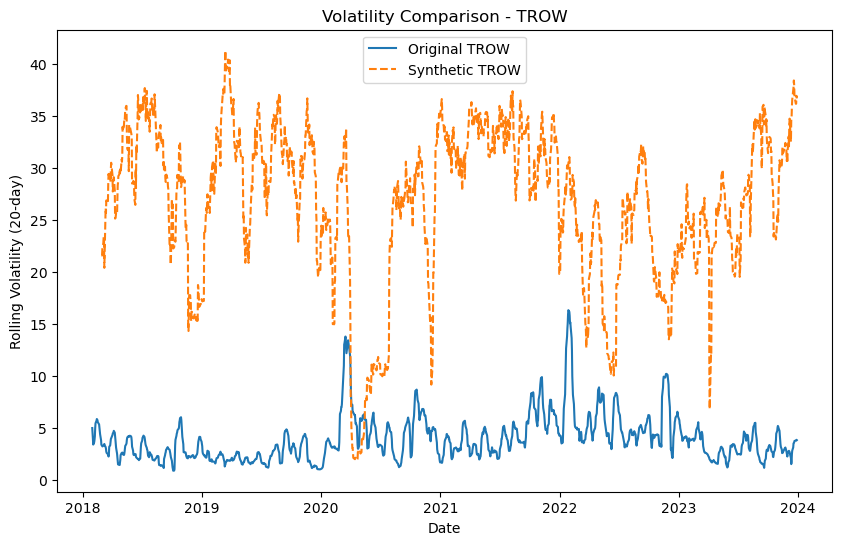


Volatility Statistics for TROW:
Original Volatility:
count    1490.000000
mean        3.974130
std         2.252034
min         0.897944
25%         2.451410
50%         3.459187
75%         4.862382
max        16.320216
Name: TROW, dtype: float64

Synthetic Volatility:
count    1470.000000
mean       26.727773
std         7.549861
min         1.934967
25%        23.086547
50%        28.167973
75%        32.271405
max        41.235091
Name: TROW, dtype: float64


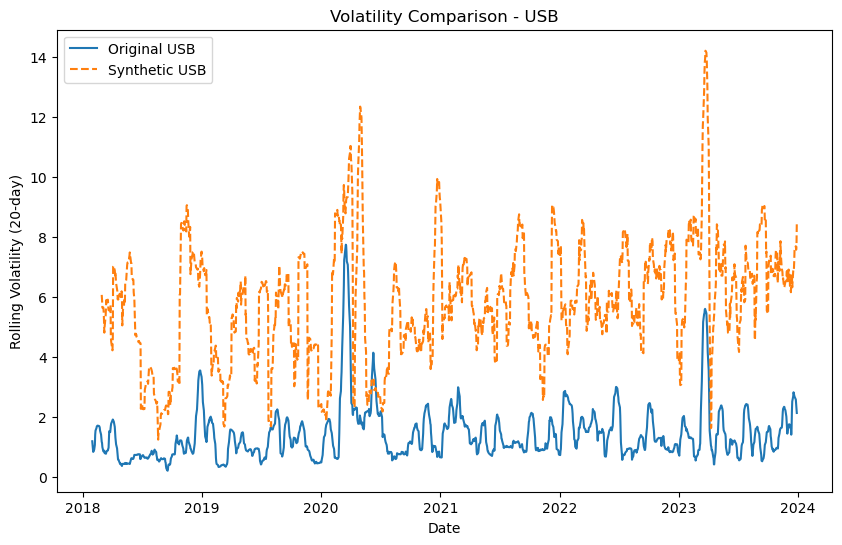


Volatility Statistics for USB:
Original Volatility:
count    1490.000000
mean        1.420818
std         0.924809
min         0.201873
25%         0.849693
50%         1.208202
75%         1.749771
max         7.737134
Name: USB, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        5.828284
std         1.985260
min         1.238600
25%         4.518570
50%         5.885478
75%         7.026714
max        14.203599
Name: USB, dtype: float64


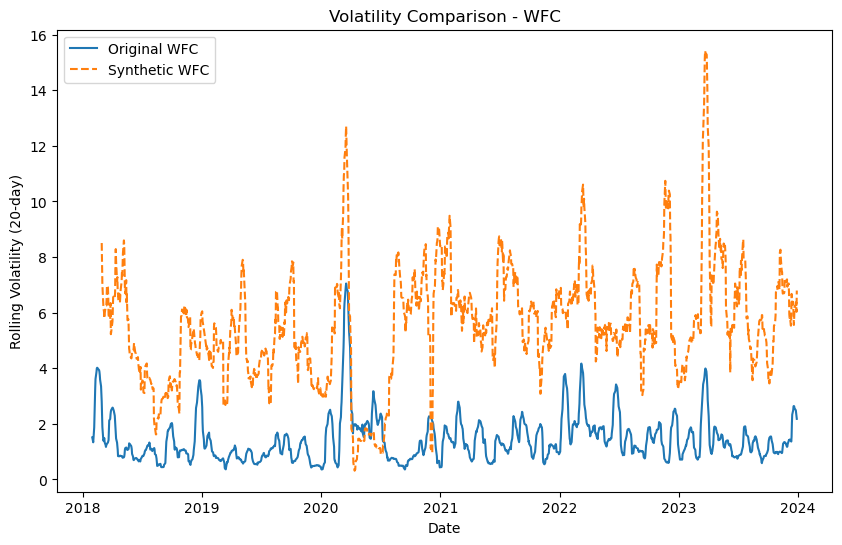


Volatility Statistics for WFC:
Original Volatility:
count    1490.000000
mean        1.441663
std         0.866011
min         0.358792
25%         0.854090
50%         1.239809
75%         1.789714
max         7.047134
Name: WFC, dtype: float64

Synthetic Volatility:
count    1470.000000
mean        5.567138
std         2.096858
min         0.314474
25%         4.364492
50%         5.481029
75%         6.734681
max        15.420005
Name: WFC, dtype: float64

Risk Metrics for AMP:
Original Data:
VaR: -0.0344
CVaR: -0.0550

Synthetic Data:
VaR: -0.5046
CVaR: -0.5525

Risk Metrics for BAC:
Original Data:
VaR: -0.0313
CVaR: -0.0478

Synthetic Data:
VaR: -0.2708
CVaR: -0.3250

Risk Metrics for BEN:
Original Data:
VaR: -0.0347
CVaR: -0.0512

Synthetic Data:
VaR: -0.2185
CVaR: -0.2761

Risk Metrics for BK:
Original Data:
VaR: -0.0296
CVaR: -0.0456

Synthetic Data:
VaR: -0.1703
CVaR: -0.2208

Risk Metrics for BLK:
Original Data:
VaR: -0.0280
CVaR: -0.0444

Synthetic Data:
VaR: -0.4122
CVaR: 

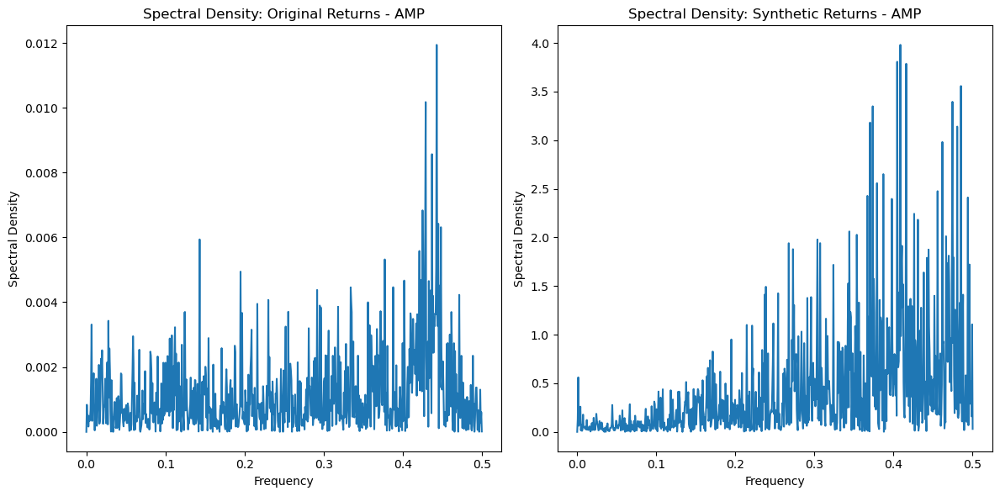


Spectral Analysis for AMP:
Original Returns - Spectral Density Statistics:
Max: 0.01194
Min: 0.00000
Mean: 0.00118
Standard Deviation: 0.00128

Synthetic Returns - Spectral Density Statistics:
Max: 3.98075
Min: 0.00000
Mean: 0.42081
Standard Deviation: 0.58159


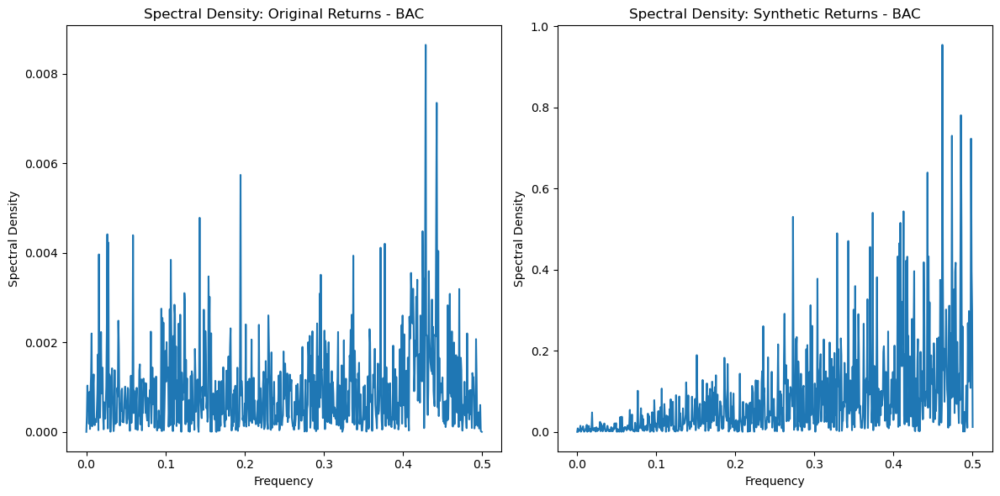


Spectral Analysis for BAC:
Original Returns - Spectral Density Statistics:
Max: 0.00864
Min: 0.00000
Mean: 0.00093
Standard Deviation: 0.00096

Synthetic Returns - Spectral Density Statistics:
Max: 0.95406
Min: 0.00000
Mean: 0.08007
Standard Deviation: 0.11232


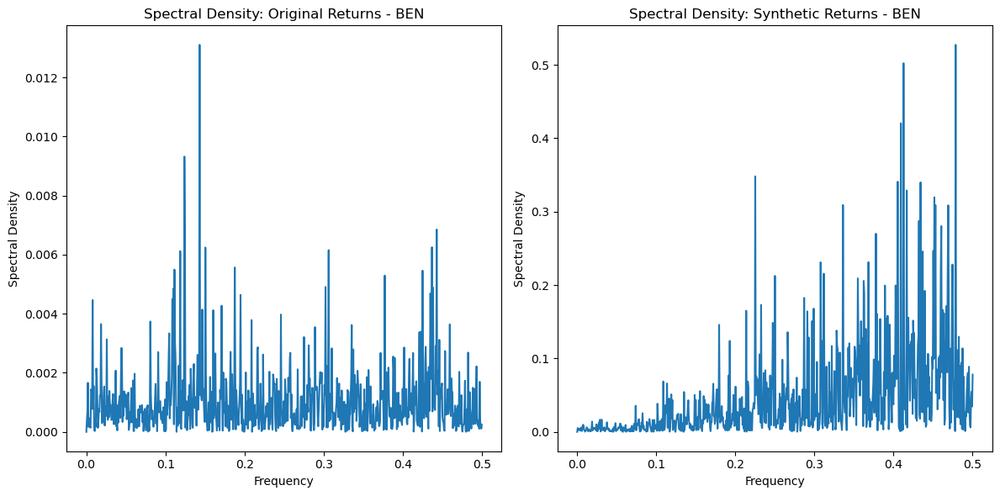


Spectral Analysis for BEN:
Original Returns - Spectral Density Statistics:
Max: 0.01310
Min: 0.00000
Mean: 0.00104
Standard Deviation: 0.00117

Synthetic Returns - Spectral Density Statistics:
Max: 0.52713
Min: 0.00000
Mean: 0.04482
Standard Deviation: 0.06411


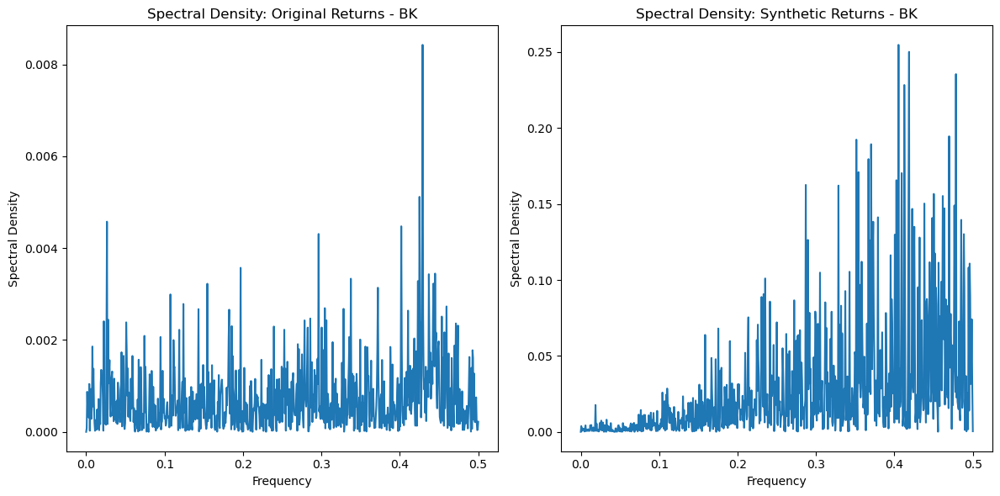


Spectral Analysis for BK:
Original Returns - Spectral Density Statistics:
Max: 0.00843
Min: 0.00000
Mean: 0.00075
Standard Deviation: 0.00078

Synthetic Returns - Spectral Density Statistics:
Max: 0.25477
Min: 0.00000
Mean: 0.02755
Standard Deviation: 0.03844


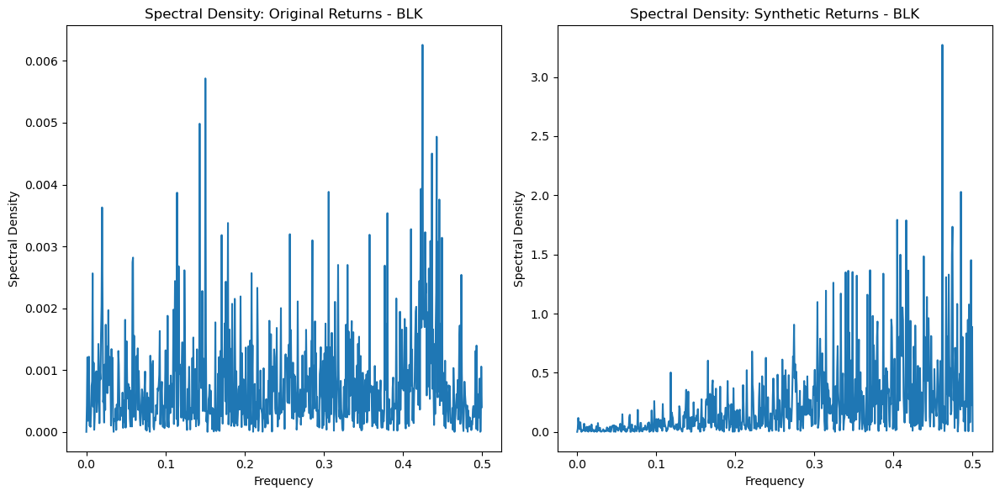


Spectral Analysis for BLK:
Original Returns - Spectral Density Statistics:
Max: 0.00626
Min: 0.00000
Mean: 0.00076
Standard Deviation: 0.00080

Synthetic Returns - Spectral Density Statistics:
Max: 3.27212
Min: 0.00000
Mean: 0.22949
Standard Deviation: 0.32505


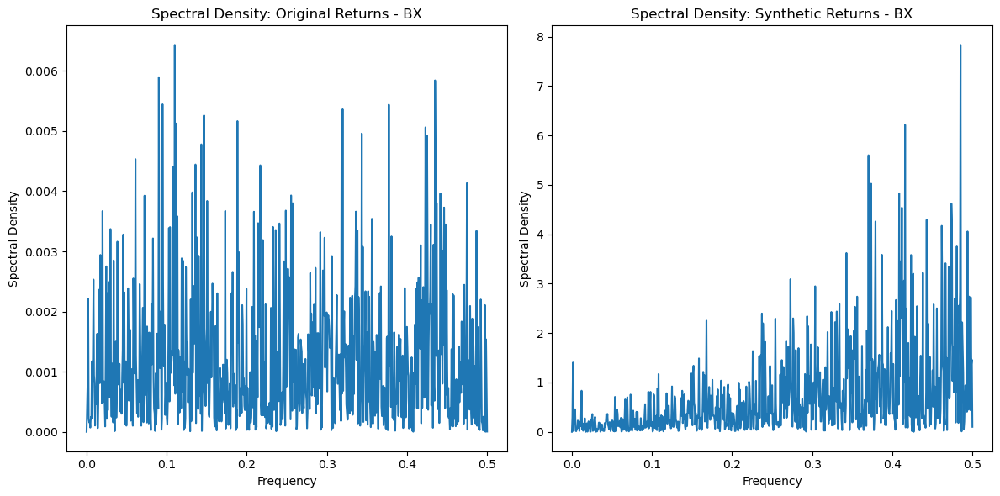


Spectral Analysis for BX:
Original Returns - Spectral Density Statistics:
Max: 0.00643
Min: 0.00000
Mean: 0.00119
Standard Deviation: 0.00113

Synthetic Returns - Spectral Density Statistics:
Max: 7.83648
Min: 0.00000
Mean: 0.71167
Standard Deviation: 0.91597


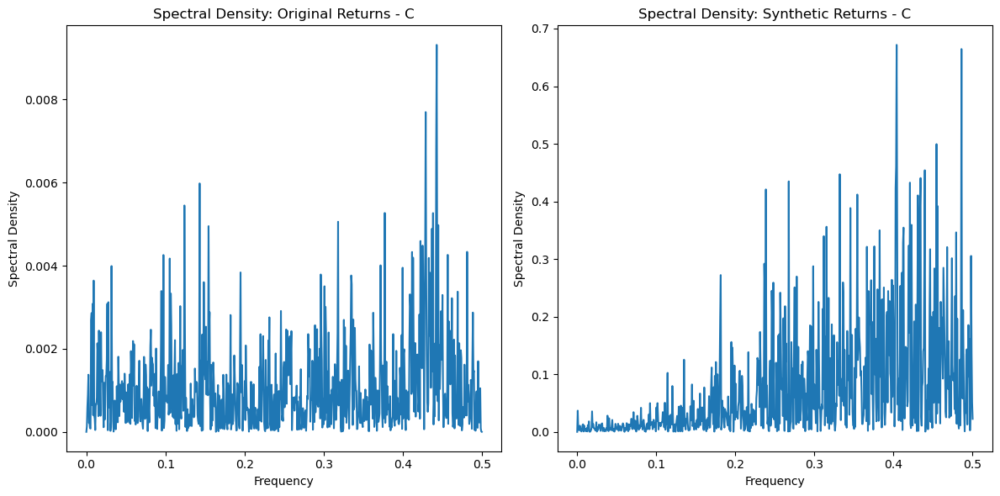


Spectral Analysis for C:
Original Returns - Spectral Density Statistics:
Max: 0.00931
Min: 0.00000
Mean: 0.00108
Standard Deviation: 0.00112

Synthetic Returns - Spectral Density Statistics:
Max: 0.67174
Min: 0.00000
Mean: 0.07311
Standard Deviation: 0.09712


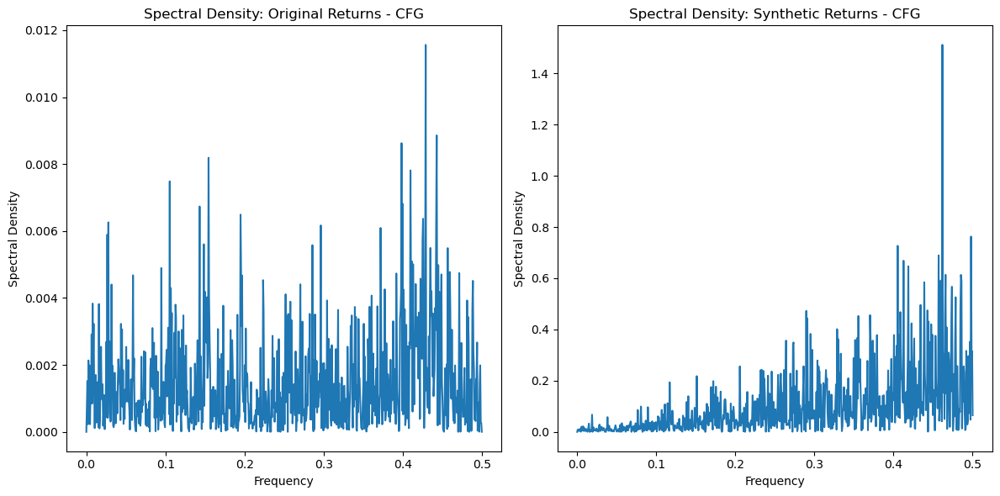


Spectral Analysis for CFG:
Original Returns - Spectral Density Statistics:
Max: 0.01156
Min: 0.00000
Mean: 0.00148
Standard Deviation: 0.00150

Synthetic Returns - Spectral Density Statistics:
Max: 1.51143
Min: 0.00000
Mean: 0.09869
Standard Deviation: 0.13296


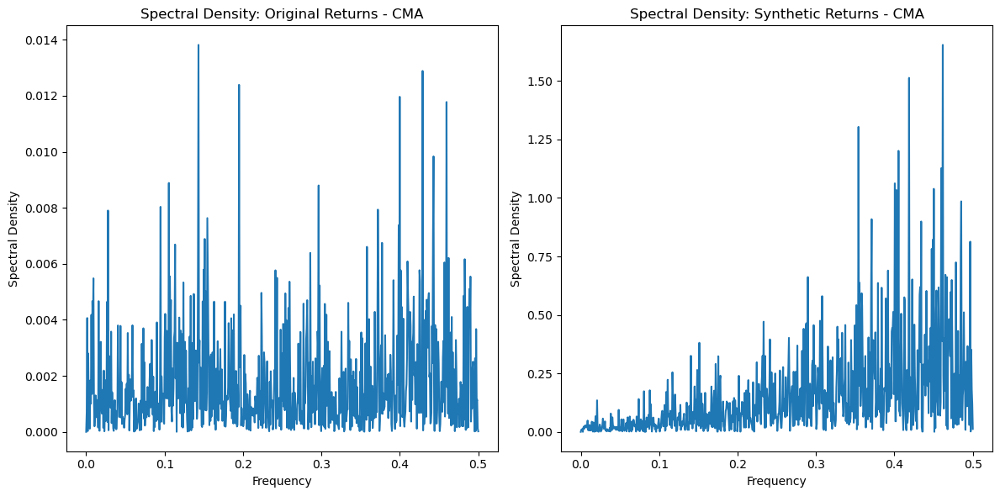


Spectral Analysis for CMA:
Original Returns - Spectral Density Statistics:
Max: 0.01382
Min: 0.00000
Mean: 0.00176
Standard Deviation: 0.00187

Synthetic Returns - Spectral Density Statistics:
Max: 1.65445
Min: 0.00000
Mean: 0.15087
Standard Deviation: 0.20033


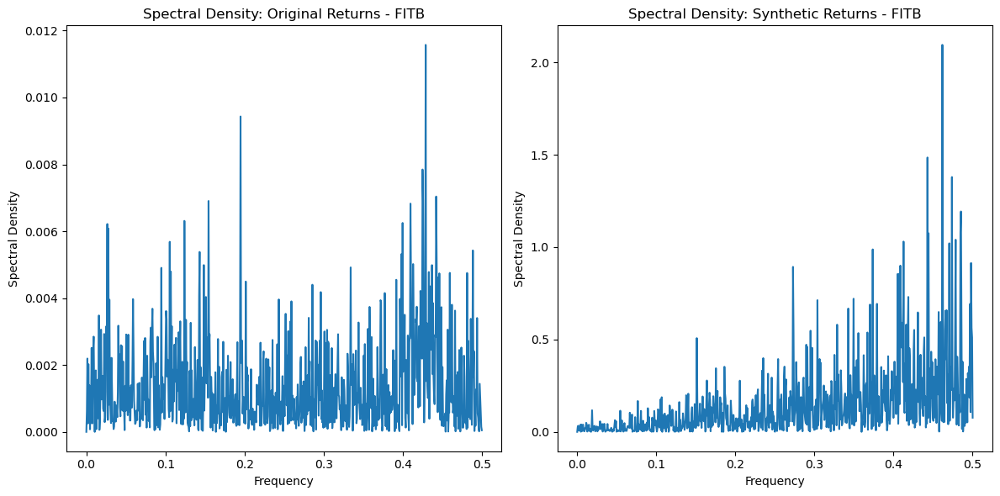


Spectral Analysis for FITB:
Original Returns - Spectral Density Statistics:
Max: 0.01158
Min: 0.00000
Mean: 0.00139
Standard Deviation: 0.00140

Synthetic Returns - Spectral Density Statistics:
Max: 2.09484
Min: 0.00000
Mean: 0.14637
Standard Deviation: 0.20705


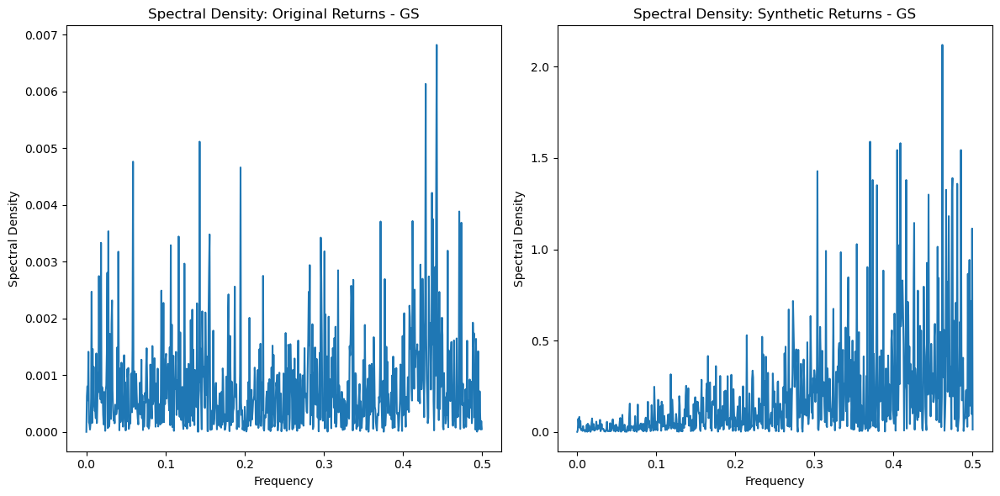


Spectral Analysis for GS:
Original Returns - Spectral Density Statistics:
Max: 0.00682
Min: 0.00000
Mean: 0.00080
Standard Deviation: 0.00086

Synthetic Returns - Spectral Density Statistics:
Max: 2.11994
Min: 0.00000
Mean: 0.19287
Standard Deviation: 0.27457


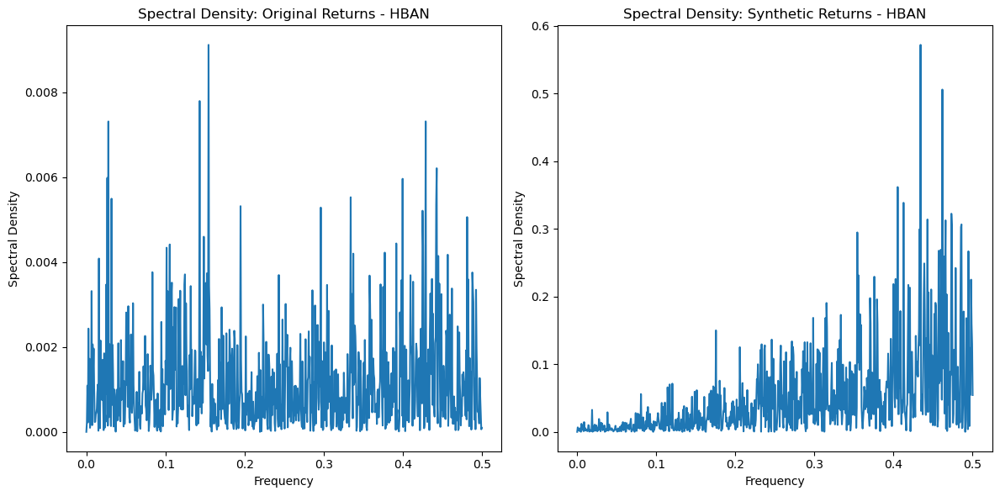


Spectral Analysis for HBAN:
Original Returns - Spectral Density Statistics:
Max: 0.00911
Min: 0.00000
Mean: 0.00117
Standard Deviation: 0.00120

Synthetic Returns - Spectral Density Statistics:
Max: 0.57191
Min: 0.00000
Mean: 0.04932
Standard Deviation: 0.06574


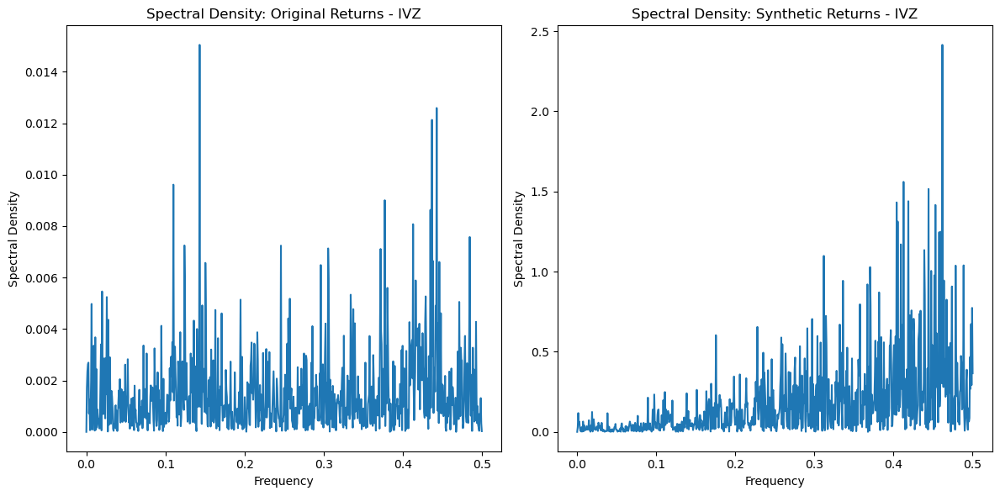


Spectral Analysis for IVZ:
Original Returns - Spectral Density Statistics:
Max: 0.01505
Min: 0.00000
Mean: 0.00152
Standard Deviation: 0.00164

Synthetic Returns - Spectral Density Statistics:
Max: 2.41451
Min: 0.00000
Mean: 0.17702
Standard Deviation: 0.25333


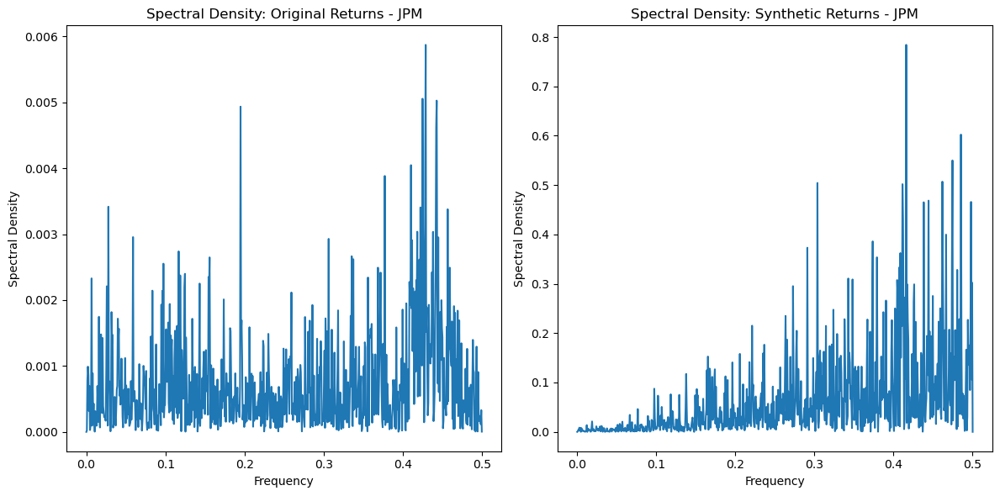


Spectral Analysis for JPM:
Original Returns - Spectral Density Statistics:
Max: 0.00587
Min: 0.00000
Mean: 0.00074
Standard Deviation: 0.00077

Synthetic Returns - Spectral Density Statistics:
Max: 0.78408
Min: 0.00000
Mean: 0.06283
Standard Deviation: 0.09103


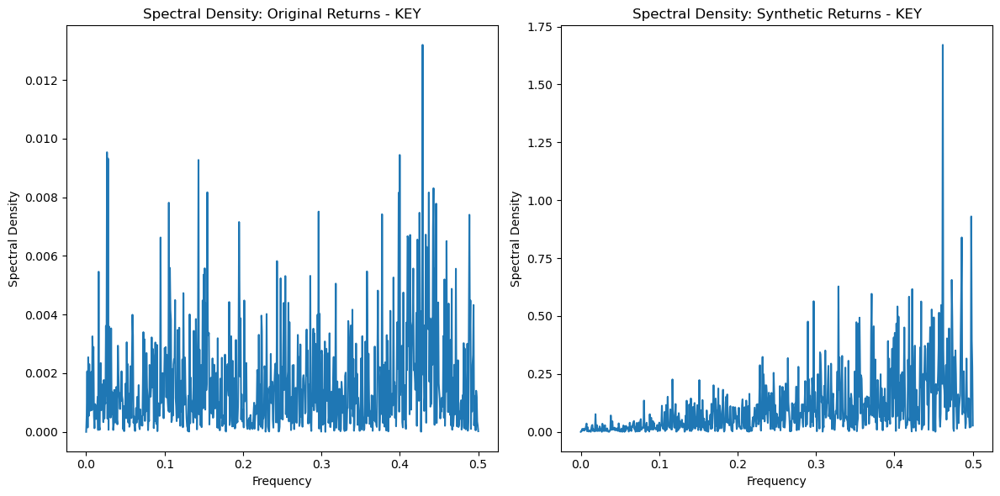


Spectral Analysis for KEY:
Original Returns - Spectral Density Statistics:
Max: 0.01320
Min: 0.00000
Mean: 0.00166
Standard Deviation: 0.00175

Synthetic Returns - Spectral Density Statistics:
Max: 1.67103
Min: 0.00000
Mean: 0.10409
Standard Deviation: 0.13884


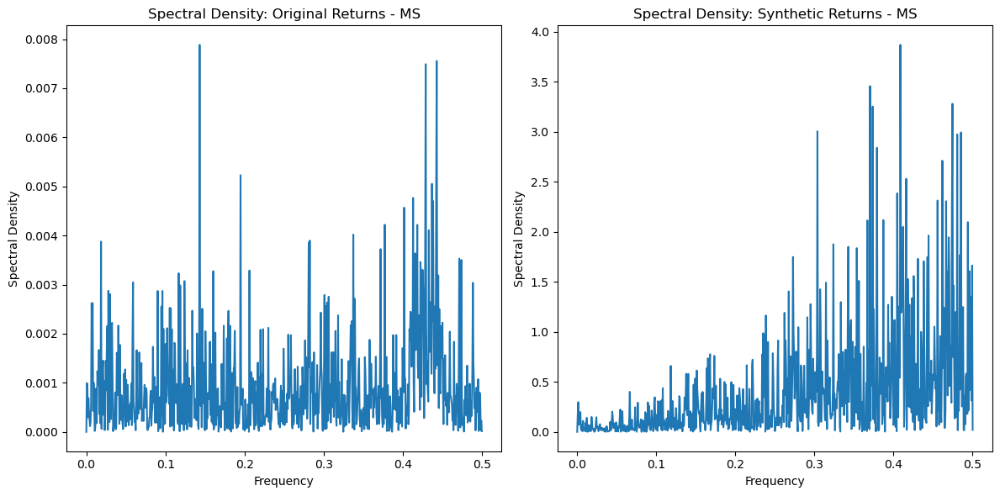


Spectral Analysis for MS:
Original Returns - Spectral Density Statistics:
Max: 0.00788
Min: 0.00000
Mean: 0.00092
Standard Deviation: 0.00099

Synthetic Returns - Spectral Density Statistics:
Max: 3.87016
Min: 0.00000
Mean: 0.39203
Standard Deviation: 0.54292


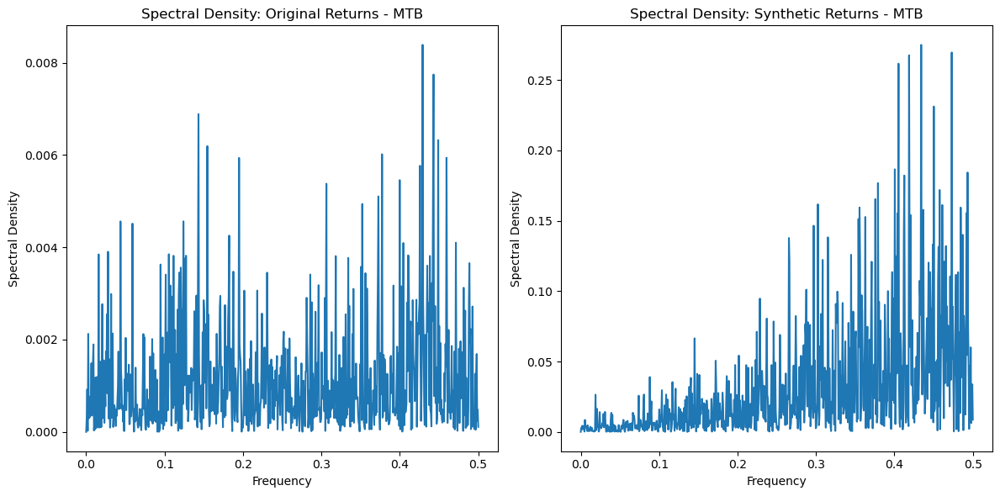


Spectral Analysis for MTB:
Original Returns - Spectral Density Statistics:
Max: 0.00839
Min: 0.00000
Mean: 0.00113
Standard Deviation: 0.00118

Synthetic Returns - Spectral Density Statistics:
Max: 0.27508
Min: 0.00000
Mean: 0.03043
Standard Deviation: 0.04077


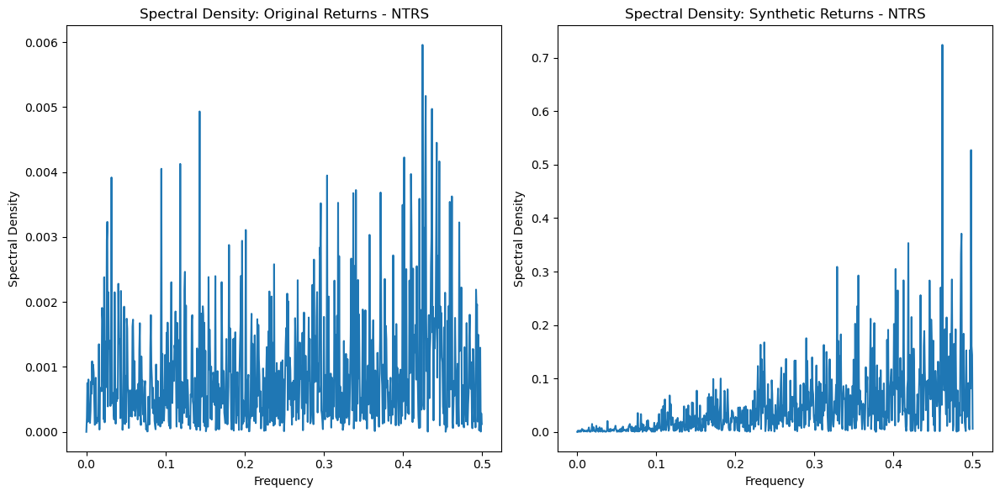


Spectral Analysis for NTRS:
Original Returns - Spectral Density Statistics:
Max: 0.00596
Min: 0.00000
Mean: 0.00091
Standard Deviation: 0.00090

Synthetic Returns - Spectral Density Statistics:
Max: 0.72436
Min: 0.00000
Mean: 0.04686
Standard Deviation: 0.06508


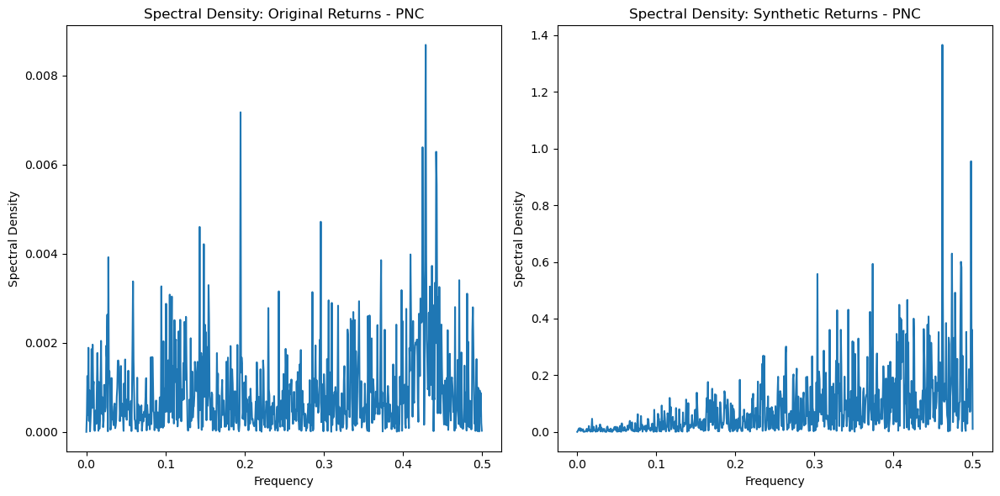


Spectral Analysis for PNC:
Original Returns - Spectral Density Statistics:
Max: 0.00868
Min: 0.00000
Mean: 0.00090
Standard Deviation: 0.00099

Synthetic Returns - Spectral Density Statistics:
Max: 1.36612
Min: 0.00000
Mean: 0.08159
Standard Deviation: 0.11695


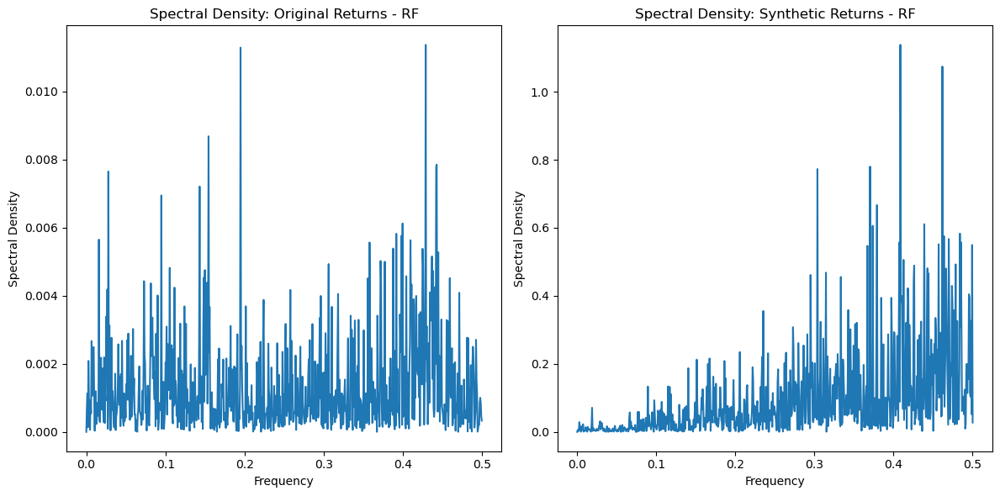


Spectral Analysis for RF:
Original Returns - Spectral Density Statistics:
Max: 0.01137
Min: 0.00000
Mean: 0.00132
Standard Deviation: 0.00142

Synthetic Returns - Spectral Density Statistics:
Max: 1.13791
Min: 0.00000
Mean: 0.09568
Standard Deviation: 0.13348


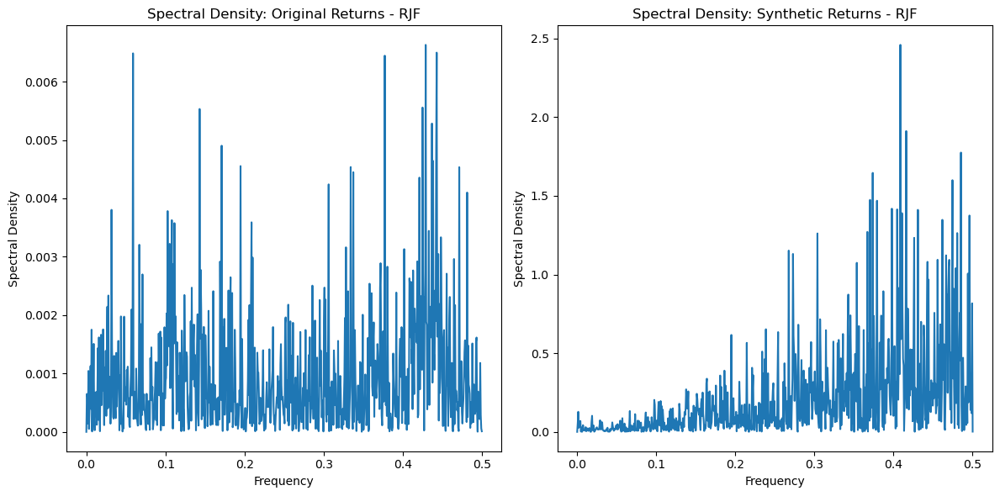


Spectral Analysis for RJF:
Original Returns - Spectral Density Statistics:
Max: 0.00663
Min: 0.00000
Mean: 0.00094
Standard Deviation: 0.00100

Synthetic Returns - Spectral Density Statistics:
Max: 2.45950
Min: 0.00000
Mean: 0.20968
Standard Deviation: 0.29977


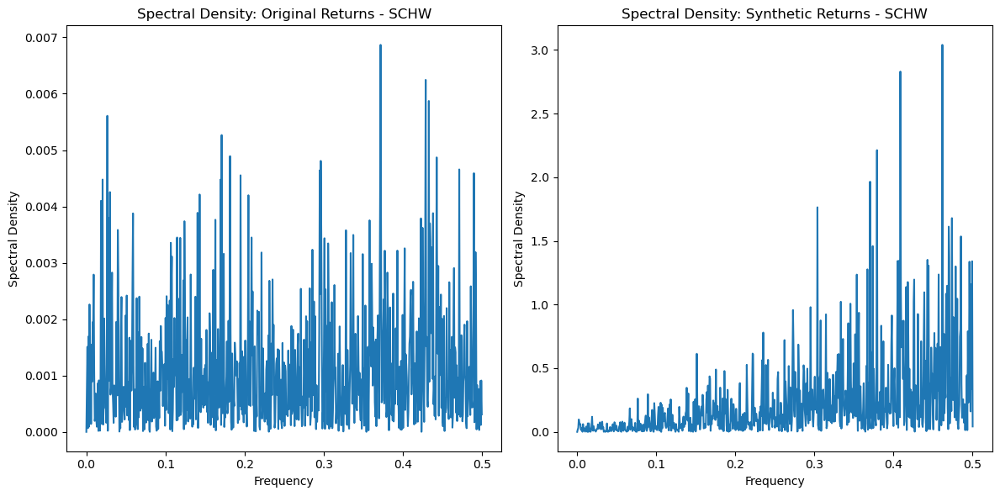


Spectral Analysis for SCHW:
Original Returns - Spectral Density Statistics:
Max: 0.00687
Min: 0.00000
Mean: 0.00112
Standard Deviation: 0.00107

Synthetic Returns - Spectral Density Statistics:
Max: 3.03967
Min: 0.00000
Mean: 0.23136
Standard Deviation: 0.33936


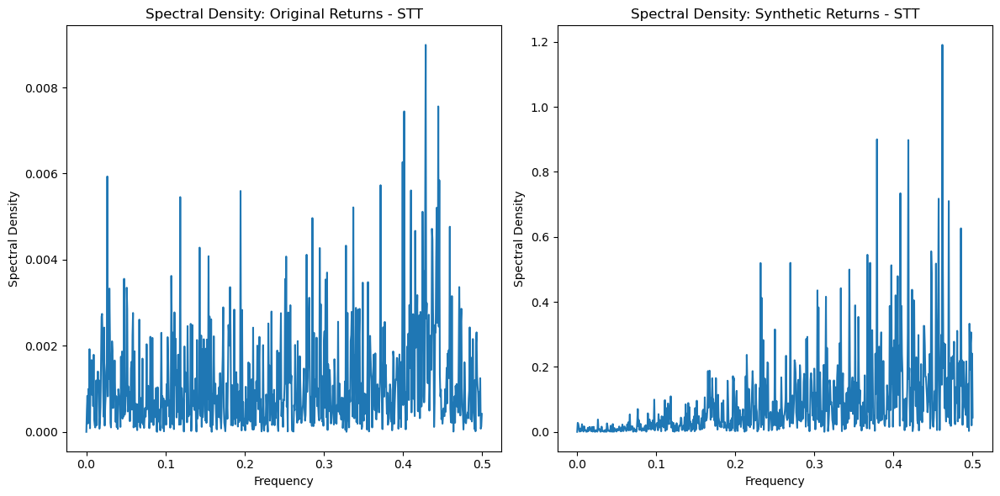


Spectral Analysis for STT:
Original Returns - Spectral Density Statistics:
Max: 0.00899
Min: 0.00000
Mean: 0.00113
Standard Deviation: 0.00117

Synthetic Returns - Spectral Density Statistics:
Max: 1.19050
Min: 0.00000
Mean: 0.08820
Standard Deviation: 0.12498


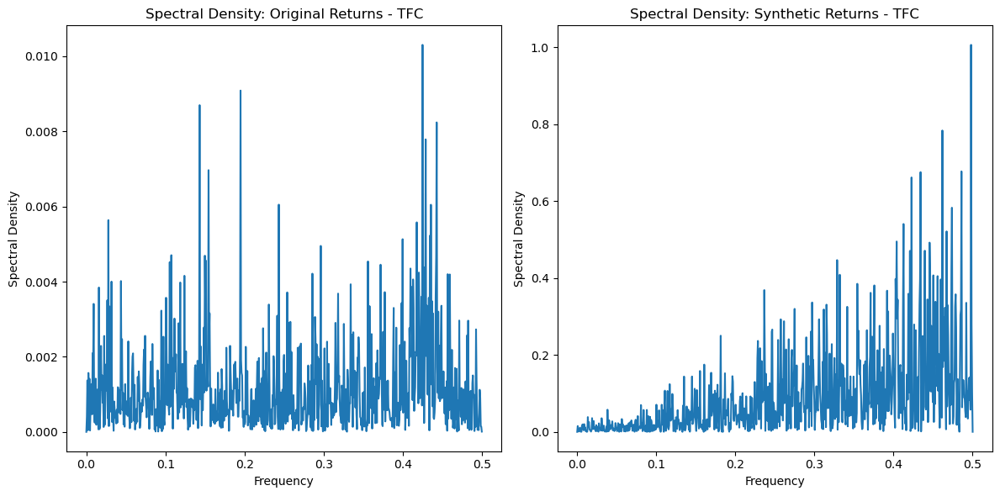


Spectral Analysis for TFC:
Original Returns - Spectral Density Statistics:
Max: 0.01030
Min: 0.00000
Mean: 0.00119
Standard Deviation: 0.00127

Synthetic Returns - Spectral Density Statistics:
Max: 1.00646
Min: 0.00000
Mean: 0.08832
Standard Deviation: 0.11510


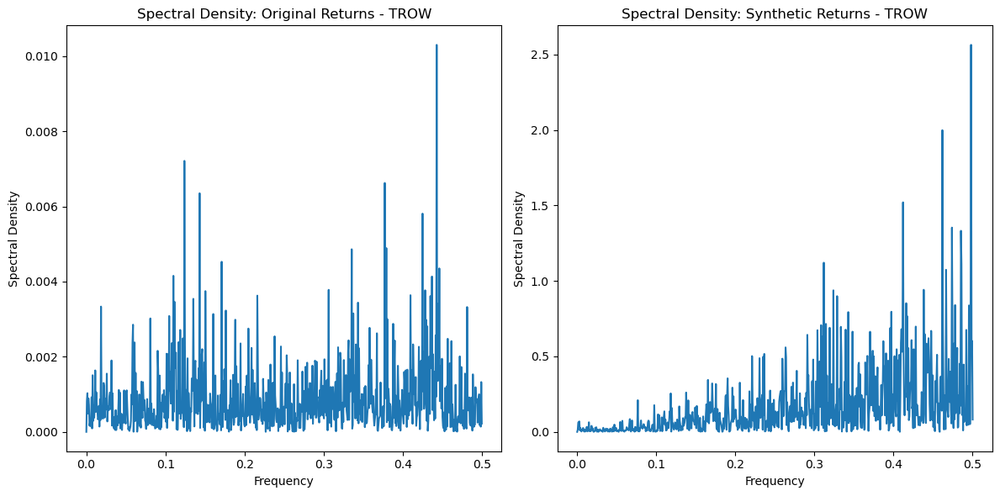


Spectral Analysis for TROW:
Original Returns - Spectral Density Statistics:
Max: 0.01030
Min: 0.00000
Mean: 0.00089
Standard Deviation: 0.00098

Synthetic Returns - Spectral Density Statistics:
Max: 2.56426
Min: 0.00000
Mean: 0.16386
Standard Deviation: 0.23496


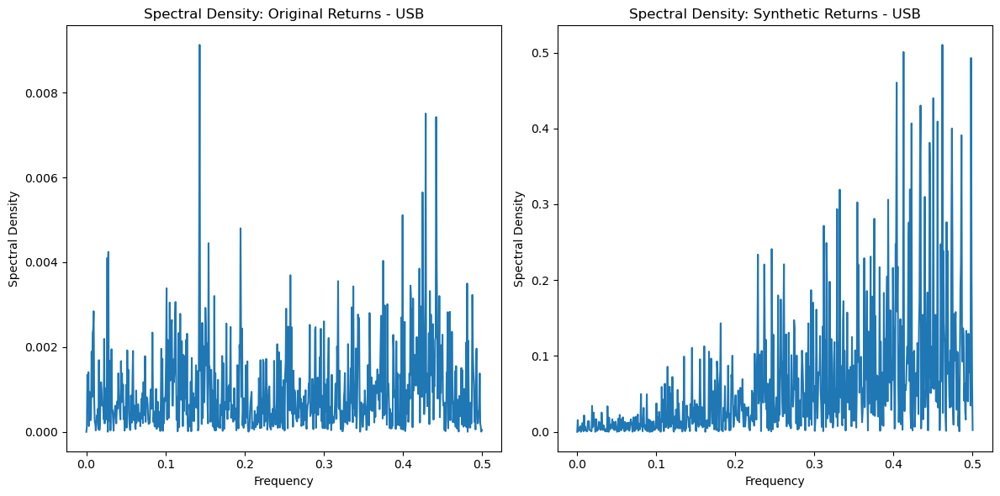


Spectral Analysis for USB:
Original Returns - Spectral Density Statistics:
Max: 0.00912
Min: 0.00000
Mean: 0.00095
Standard Deviation: 0.00100

Synthetic Returns - Spectral Density Statistics:
Max: 0.51014
Min: 0.00000
Mean: 0.05946
Standard Deviation: 0.07878


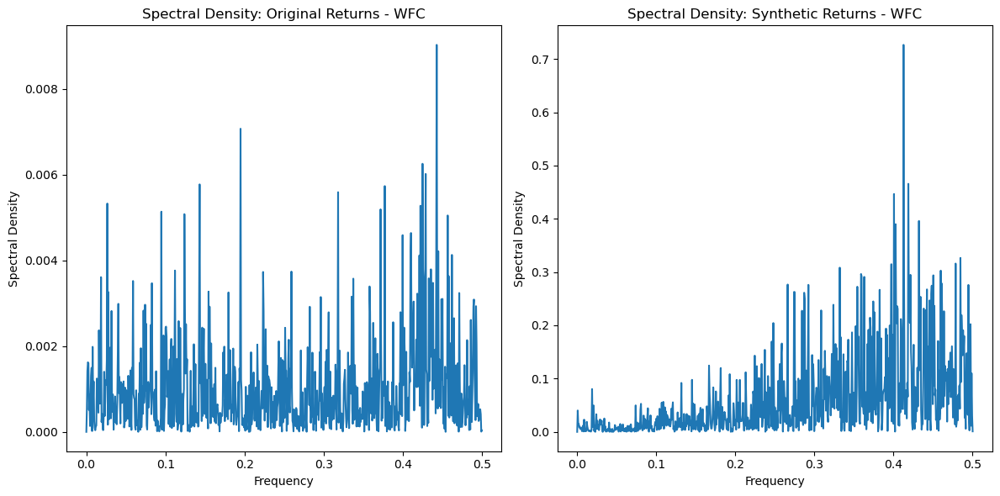


Spectral Analysis for WFC:
Original Returns - Spectral Density Statistics:
Max: 0.00902
Min: 0.00000
Mean: 0.00103
Standard Deviation: 0.00111

Synthetic Returns - Spectral Density Statistics:
Max: 0.72659
Min: 0.00000
Mean: 0.05981
Standard Deviation: 0.07889

Additional Metrics for AMP:
Correlation: 0.1827
Mean Squared Error: 9216.7145
Mean Absolute Error: 75.4920

Additional Metrics for BAC:
Correlation: 0.2805
Mean Squared Error: 58.2767
Mean Absolute Error: 6.2039

Additional Metrics for BEN:
Correlation: 0.5284
Mean Squared Error: 22.9079
Mean Absolute Error: 3.8296

Additional Metrics for BK:
Correlation: 0.4707
Mean Squared Error: 42.4141
Mean Absolute Error: 5.1368

Additional Metrics for BLK:
Correlation: 0.1650
Mean Squared Error: 39064.3351
Mean Absolute Error: 154.0791

Additional Metrics for BX:
Correlation: 0.0674
Mean Squared Error: 1661.1852
Mean Absolute Error: 32.6126

Additional Metrics for C:
Correlation: 0.4129
Mean Squared Error: 175.0392
Mean Absolute Error: 10

In [9]:
# Cell 8: Analyze results
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import ks_2samp, skew, kurtosis
from scipy.signal import periodogram

def plot_comparison(original_data, synthetic_data, title):
    common_index = original_data.index.intersection(synthetic_data.index)
    aligned_original = original_data.loc[common_index]
    aligned_synthetic = synthetic_data.loc[common_index]

    for column in aligned_original.columns:
        plt.figure(figsize=(10, 6))
        plt.plot(aligned_original.index, aligned_original[column], label=f'Original {column}')
        plt.plot(aligned_synthetic.index, aligned_synthetic[column], label=f'Synthetic {column}', linestyle='dashed')
        plt.title(f"{title} - {column}")
        plt.xlabel('Date')
        plt.ylabel('Close Price')
        plt.legend()
        plt.show()

def compute_statistics(data):
    return data.describe()

def plot_distribution(original_data, synthetic_data, title):
    for column in original_data.columns:
        plt.figure(figsize=(10, 6))
        sns.kdeplot(original_data[column], label=f'Original {column}', shade=True)
        sns.kdeplot(synthetic_data[column], label=f'Synthetic {column}', shade=True)
        plt.title(f"{title} - {column}")
        plt.xlabel('Close Price')
        plt.ylabel('Density')
        plt.legend()
        plt.show()

def analyze_volatility(original_data, synthetic_data, window=20):
    for column in original_data.columns:
        original_volatility = original_data[column].rolling(window=window).std()
        synthetic_volatility = synthetic_data[column].rolling(window=window).std()
        
        plt.figure(figsize=(10, 6))
        plt.plot(original_volatility.index, original_volatility, label=f'Original {column}')
        plt.plot(synthetic_volatility.index, synthetic_volatility, label=f'Synthetic {column}', linestyle='dashed')
        plt.title(f'Volatility Comparison - {column}')
        plt.xlabel('Date')
        plt.ylabel(f'Rolling Volatility ({window}-day)')
        plt.legend()
        plt.show()
        
        print(f"\nVolatility Statistics for {column}:")
        print("Original Volatility:")
        print(original_volatility.describe())
        print("\nSynthetic Volatility:")
        print(synthetic_volatility.describe())

def compute_var_cvar(returns, alpha=0.05):
    sorted_returns = returns.sort_values()
    var = sorted_returns.quantile(alpha)
    cvar = sorted_returns[sorted_returns <= var].mean()
    return var, cvar

def analyze_risk_metrics(original_data, synthetic_data):
    for column in original_data.columns:
        original_returns = original_data[column].pct_change().dropna()
        synthetic_returns = synthetic_data[column].pct_change().dropna()
        
        original_var, original_cvar = compute_var_cvar(original_returns)
        synthetic_var, synthetic_cvar = compute_var_cvar(synthetic_returns)
        
        print(f"\nRisk Metrics for {column}:")
        print("Original Data:")
        print(f"VaR: {original_var:.4f}")
        print(f"CVaR: {original_cvar:.4f}")
        print("\nSynthetic Data:")
        print(f"VaR: {synthetic_var:.4f}")
        print(f"CVaR: {synthetic_cvar:.4f}")

def analyze_distribution(original_data, synthetic_data):
    for column in original_data.columns:
        original_returns = original_data[column].pct_change().dropna()
        synthetic_returns = synthetic_data[column].pct_change().dropna()
        
        ks_statistic, ks_pvalue = ks_2samp(original_returns, synthetic_returns)
        original_skewness = skew(original_returns)
        synthetic_skewness = skew(synthetic_returns)
        original_kurtosis = kurtosis(original_returns)
        synthetic_kurtosis = kurtosis(synthetic_returns)
        
        print(f"\nDistribution Analysis for {column}:")
        print(f"K-S Statistic: {ks_statistic:.4f}")
        print(f"K-S P-value: {ks_pvalue:.4f}")
        print(f"Original Skewness: {original_skewness:.4f}")
        print(f"Synthetic Skewness: {synthetic_skewness:.4f}")
        print(f"Original Kurtosis: {original_kurtosis:.4f}")
        print(f"Synthetic Kurtosis: {synthetic_kurtosis:.4f}")

def analyze_spectrum(original_data, synthetic_data):
    for column in original_data.columns:
        original_returns = original_data[column].pct_change().dropna()
        synthetic_returns = synthetic_data[column].pct_change().dropna()
        
        f_original, Pxx_original = periodogram(original_returns)
        f_synthetic, Pxx_synthetic = periodogram(synthetic_returns)
        
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.plot(f_original, Pxx_original)
        plt.title(f'Spectral Density: Original Returns - {column}')
        plt.xlabel('Frequency')
        plt.ylabel('Spectral Density')
        
        plt.subplot(1, 2, 2)
        plt.plot(f_synthetic, Pxx_synthetic)
        plt.title(f'Spectral Density: Synthetic Returns - {column}')
        plt.xlabel('Frequency')
        plt.ylabel('Spectral Density')
        
        plt.tight_layout()
        plt.show()
        
        print(f"\nSpectral Analysis for {column}:")
        print("Original Returns - Spectral Density Statistics:")
        print(f"Max: {np.max(Pxx_original):.5f}")
        print(f"Min: {np.min(Pxx_original):.5f}")
        print(f"Mean: {np.mean(Pxx_original):.5f}")
        print(f"Standard Deviation: {np.std(Pxx_original):.5f}")
        
        print("\nSynthetic Returns - Spectral Density Statistics:")
        print(f"Max: {np.max(Pxx_synthetic):.5f}")
        print(f"Min: {np.min(Pxx_synthetic):.5f}")
        print(f"Mean: {np.mean(Pxx_synthetic):.5f}")
        print(f"Standard Deviation: {np.std(Pxx_synthetic):.5f}")

def calculate_additional_metrics(original_data, synthetic_data):
    # Ensure both datasets have the same index
    common_index = original_data.index.intersection(synthetic_data.index)
    aligned_original = original_data.loc[common_index]
    aligned_synthetic = synthetic_data.loc[common_index]

    for column in aligned_original.columns:
        correlation = np.corrcoef(aligned_original[column], aligned_synthetic[column])[0, 1]
        mse = np.mean((aligned_original[column] - aligned_synthetic[column]) ** 2)
        mae = np.mean(np.abs(aligned_original[column] - aligned_synthetic[column]))
        
        print(f"\nAdditional Metrics for {column}:")
        print(f"Correlation: {correlation:.4f}")
        print(f"Mean Squared Error: {mse:.4f}")
        print(f"Mean Absolute Error: {mae:.4f}")
def plot_aggregate_comparison(original_data, synthetic_data, title):
    common_index = original_data.index.intersection(synthetic_data.index)
    aligned_original = original_data.loc[common_index]
    aligned_synthetic = synthetic_data.loc[common_index]

    # Calculate average across all stocks
    original_avg = aligned_original.mean(axis=1)
    synthetic_avg = aligned_synthetic.mean(axis=1)

    plt.figure(figsize=(12, 6))
    plt.plot(common_index, original_avg, label='Original Average')
    plt.plot(common_index, synthetic_avg, label='Synthetic Average', linestyle='dashed')
    plt.title(f"{title} - US Aggregate")
    plt.xlabel('Date')
    plt.ylabel('Average Close Price')
    plt.legend()
    plt.show()

def plot_aggregate_distribution(original_data, synthetic_data, title):
    # Calculate average across all stocks
    original_avg = original_data.mean(axis=1)
    synthetic_avg = synthetic_data.mean(axis=1)

    plt.figure(figsize=(12, 6))
    sns.kdeplot(original_avg, label='Original Average', shade=True)
    sns.kdeplot(synthetic_avg, label='Synthetic Average', shade=True)
    plt.title(f"{title} - US Aggregate")
    plt.xlabel('Average Close Price')
    plt.ylabel('Density')
    plt.legend()
    plt.show()


# Main execution
plot_aggregate_comparison(stock_data, rescaled_synthetic_data, "Comparison of Original vs Synthetic Stock Close Prices")
plot_comparison(stock_data, rescaled_synthetic_data, "Comparison of Original vs Synthetic Stock Close Prices")

print("\nOriginal Data Statistics:")
print(compute_statistics(stock_data))
print("\nSynthetic Data Statistics:")
print(compute_statistics(rescaled_synthetic_data))

print(compute_statistics(rescaled_synthetic_data))
plot_aggregate_distribution(stock_data, rescaled_synthetic_data, "Frequency Distribution of Original vs Synthetic Stock Close Prices")
plot_distribution(stock_data, rescaled_synthetic_data, "Frequency Distribution of Original vs Synthetic Stock Close Prices")

analyze_volatility(stock_data, rescaled_synthetic_data)
analyze_risk_metrics(stock_data, rescaled_synthetic_data)
analyze_distribution(stock_data, rescaled_synthetic_data)
analyze_spectrum(stock_data, rescaled_synthetic_data)
calculate_additional_metrics(stock_data, rescaled_synthetic_data)

# Risk Metric Analysis

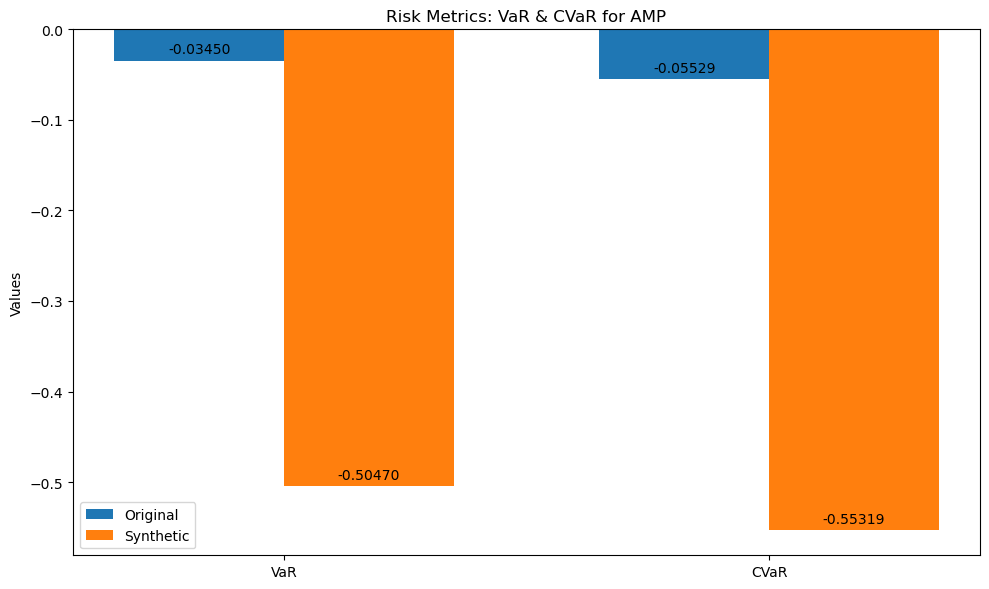


Risk Metrics for AMP:
Original Data Metrics:
VaR: -0.03450
CVaR: -0.05529

Synthetic Data Metrics:
VaR: -0.50470
CVaR: -0.55319


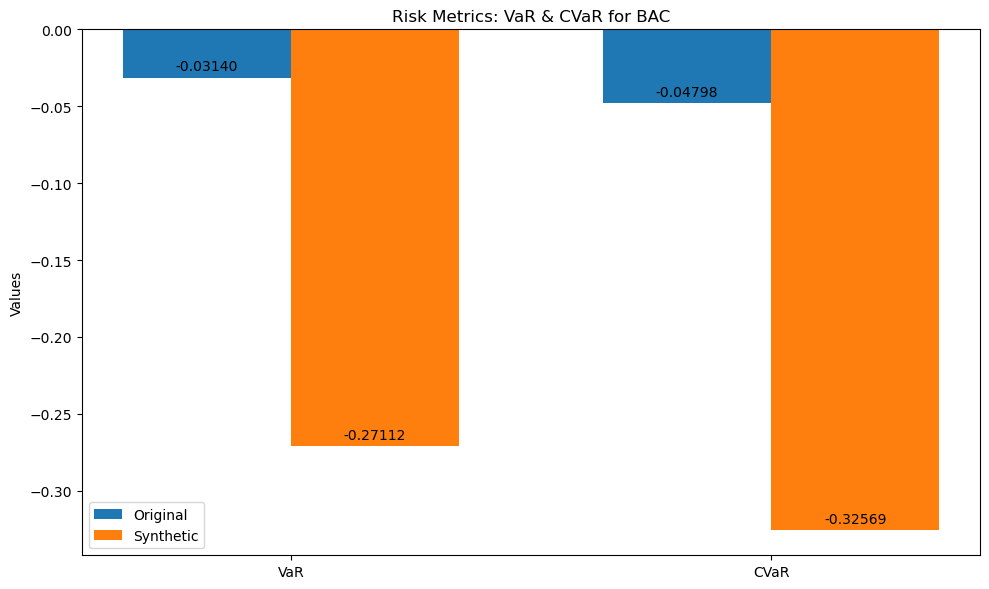


Risk Metrics for BAC:
Original Data Metrics:
VaR: -0.03140
CVaR: -0.04798

Synthetic Data Metrics:
VaR: -0.27112
CVaR: -0.32569


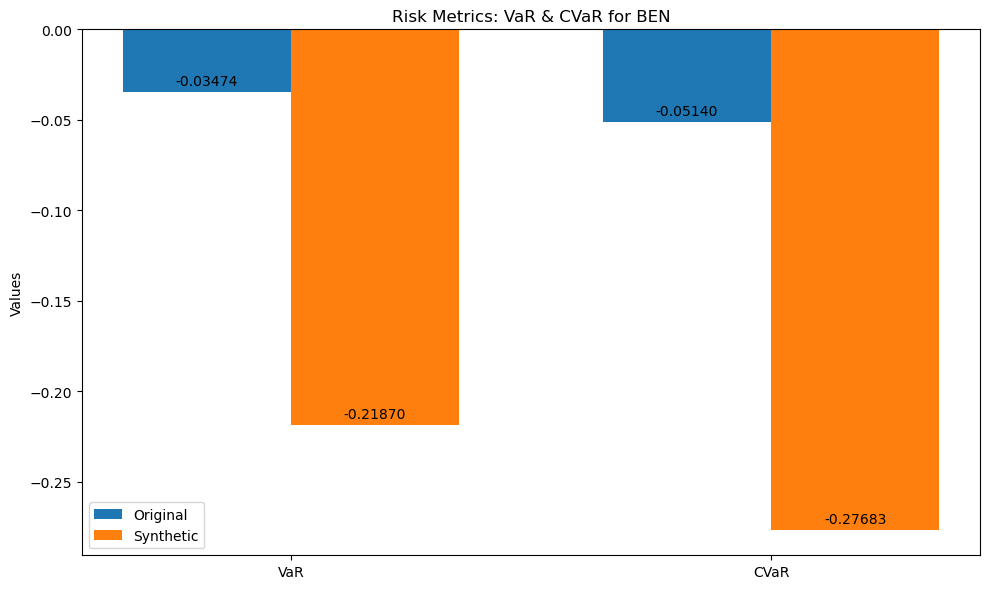


Risk Metrics for BEN:
Original Data Metrics:
VaR: -0.03474
CVaR: -0.05140

Synthetic Data Metrics:
VaR: -0.21870
CVaR: -0.27683


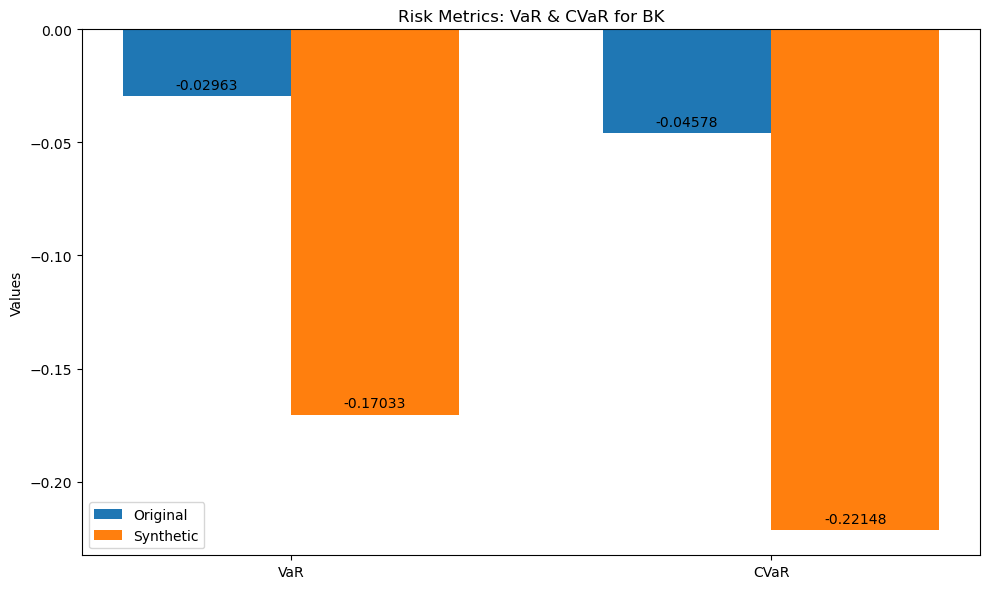


Risk Metrics for BK:
Original Data Metrics:
VaR: -0.02963
CVaR: -0.04578

Synthetic Data Metrics:
VaR: -0.17033
CVaR: -0.22148


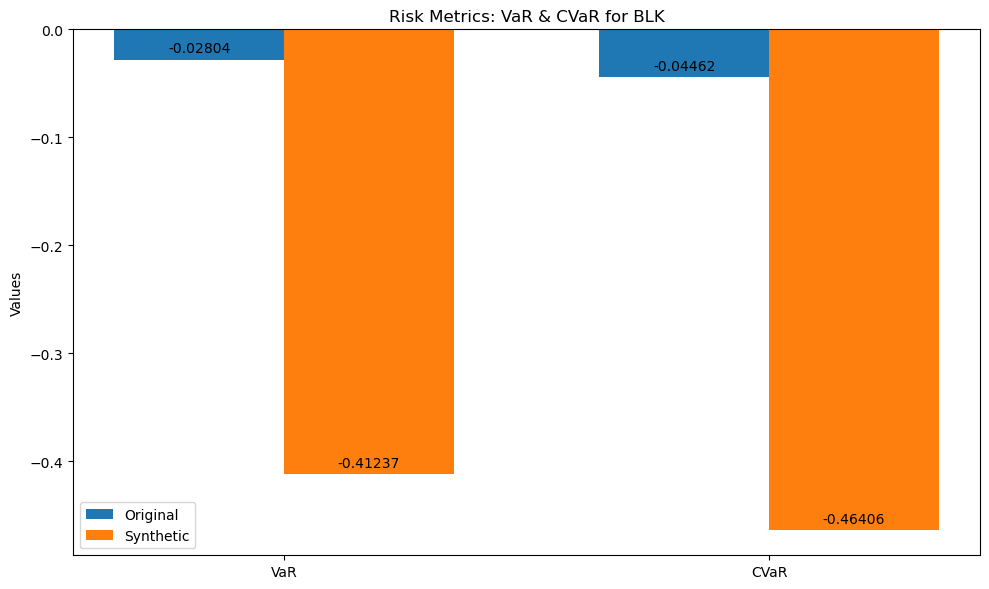


Risk Metrics for BLK:
Original Data Metrics:
VaR: -0.02804
CVaR: -0.04462

Synthetic Data Metrics:
VaR: -0.41237
CVaR: -0.46406


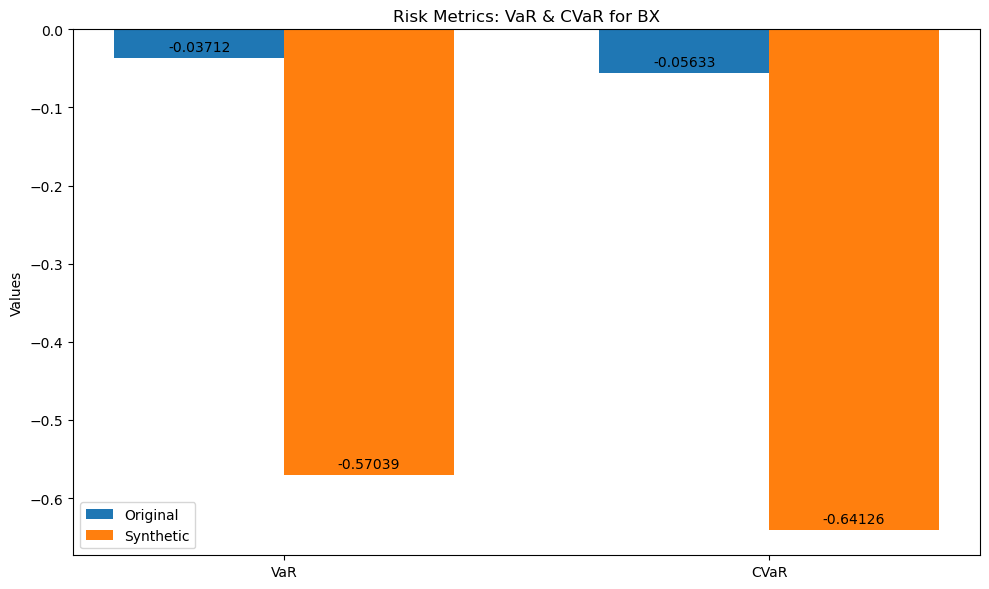


Risk Metrics for BX:
Original Data Metrics:
VaR: -0.03712
CVaR: -0.05633

Synthetic Data Metrics:
VaR: -0.57039
CVaR: -0.64126


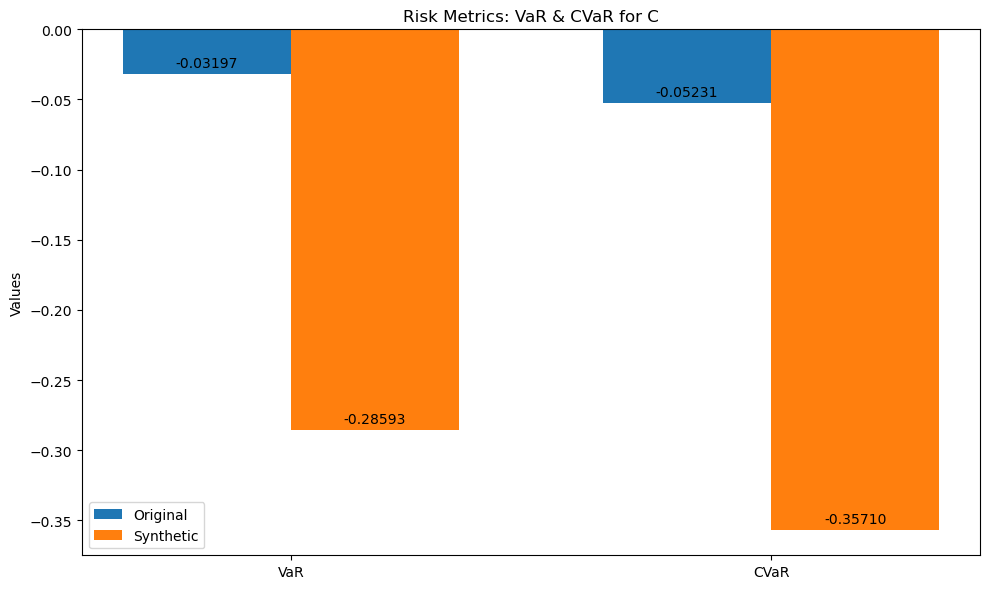


Risk Metrics for C:
Original Data Metrics:
VaR: -0.03197
CVaR: -0.05231

Synthetic Data Metrics:
VaR: -0.28593
CVaR: -0.35710


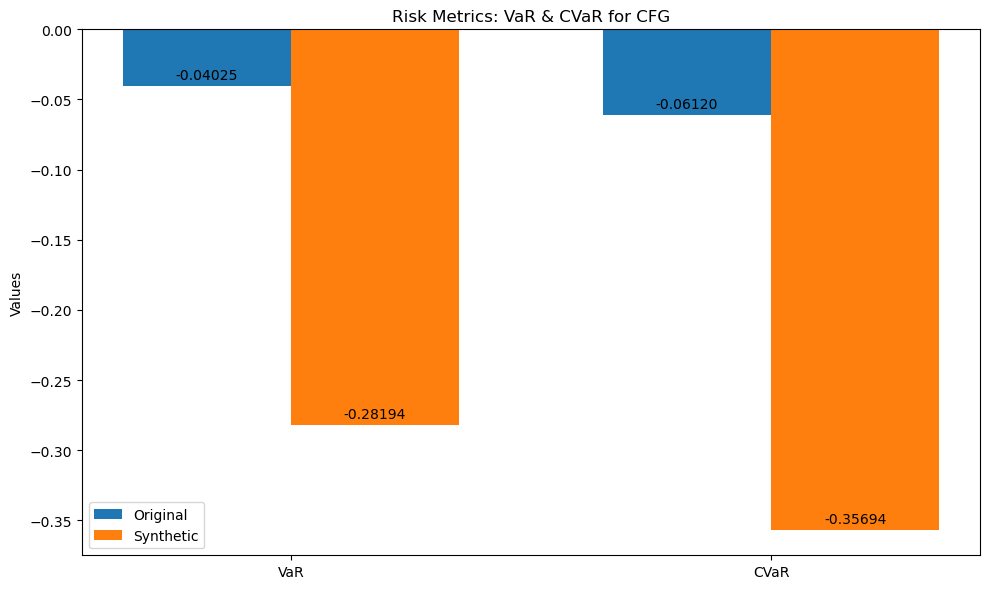


Risk Metrics for CFG:
Original Data Metrics:
VaR: -0.04025
CVaR: -0.06120

Synthetic Data Metrics:
VaR: -0.28194
CVaR: -0.35694


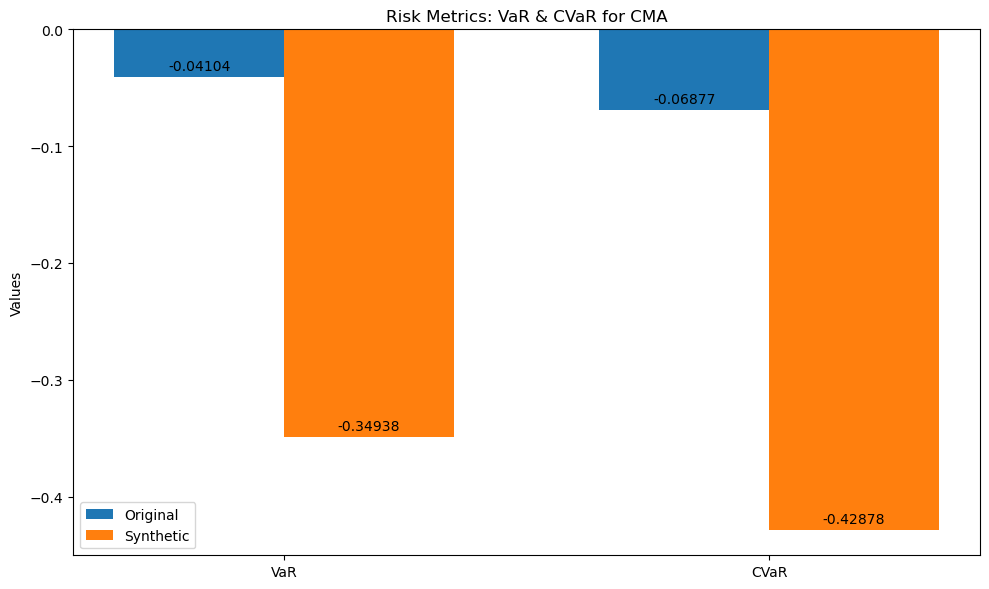


Risk Metrics for CMA:
Original Data Metrics:
VaR: -0.04104
CVaR: -0.06877

Synthetic Data Metrics:
VaR: -0.34938
CVaR: -0.42878


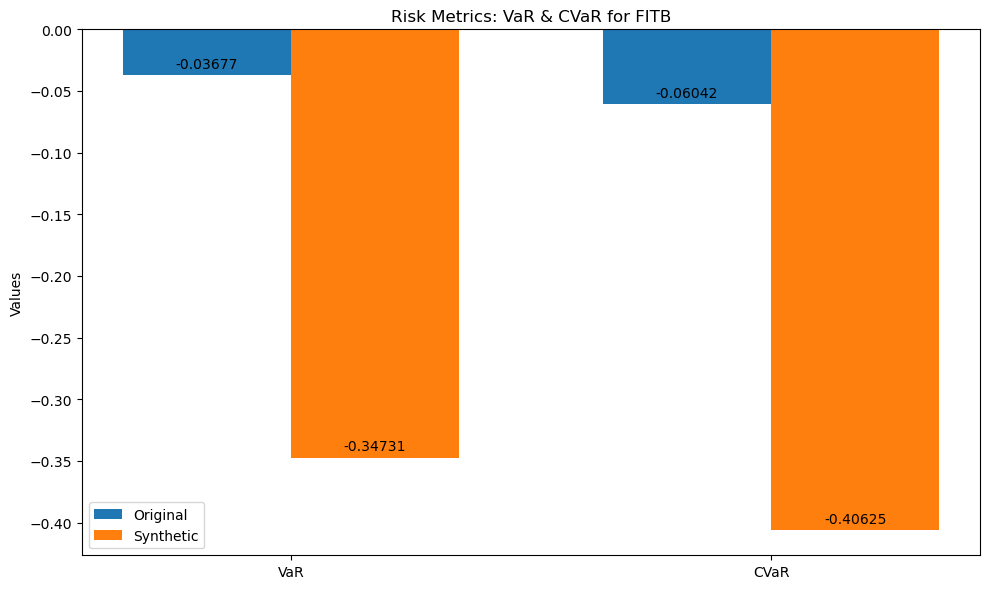


Risk Metrics for FITB:
Original Data Metrics:
VaR: -0.03677
CVaR: -0.06042

Synthetic Data Metrics:
VaR: -0.34731
CVaR: -0.40625


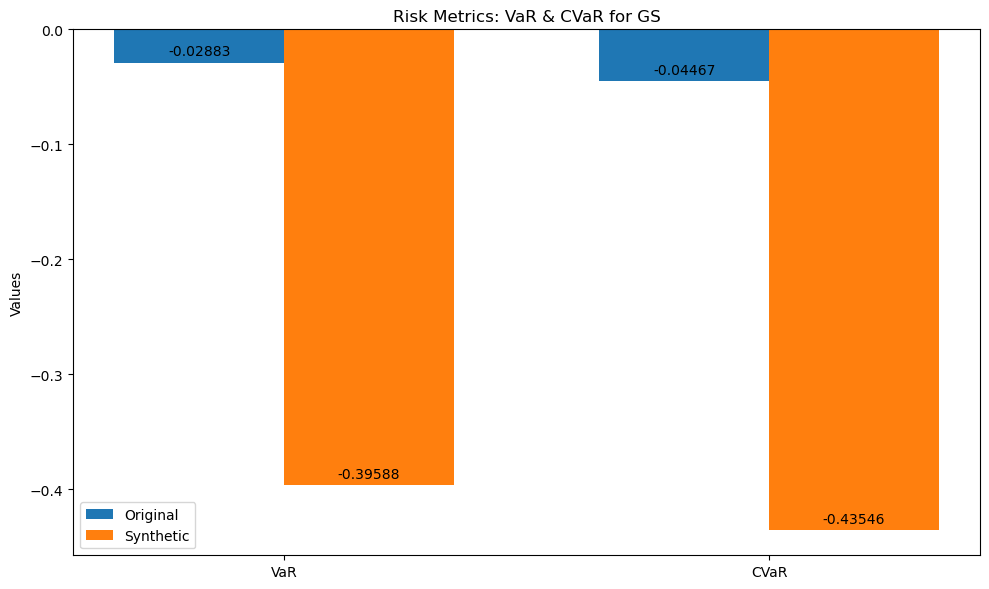


Risk Metrics for GS:
Original Data Metrics:
VaR: -0.02883
CVaR: -0.04467

Synthetic Data Metrics:
VaR: -0.39588
CVaR: -0.43546


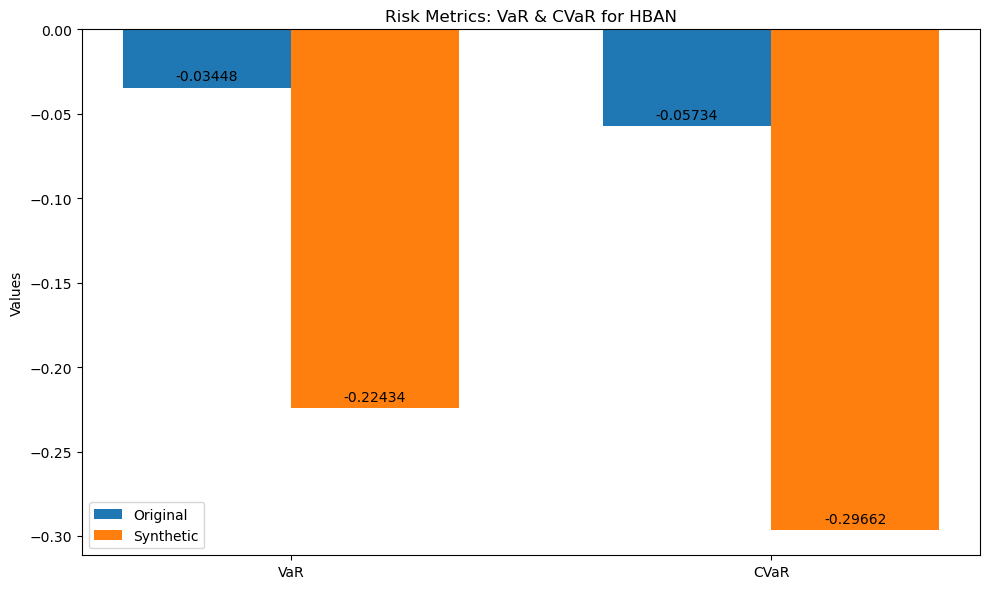


Risk Metrics for HBAN:
Original Data Metrics:
VaR: -0.03448
CVaR: -0.05734

Synthetic Data Metrics:
VaR: -0.22434
CVaR: -0.29662


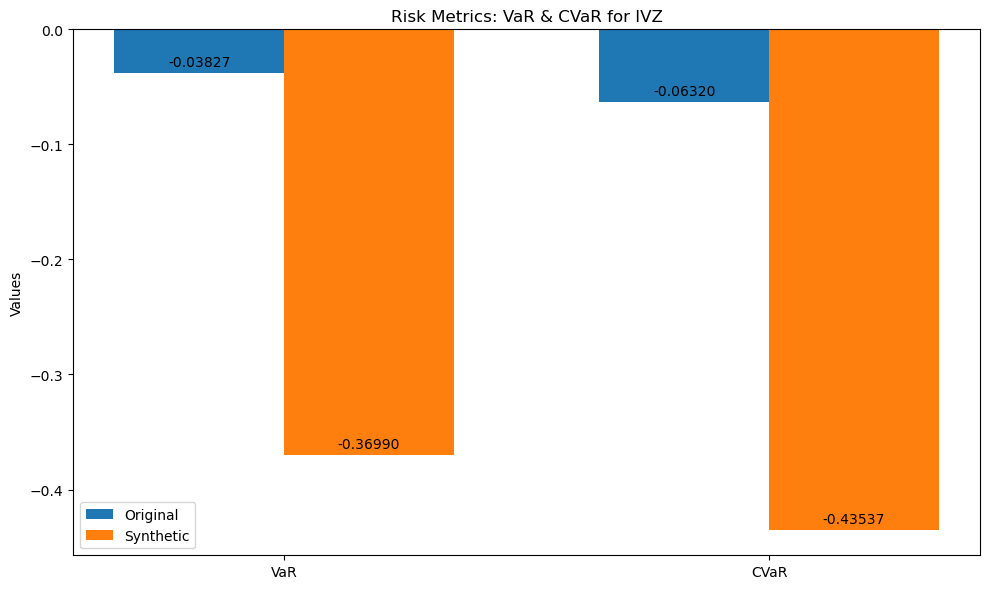


Risk Metrics for IVZ:
Original Data Metrics:
VaR: -0.03827
CVaR: -0.06320

Synthetic Data Metrics:
VaR: -0.36990
CVaR: -0.43537


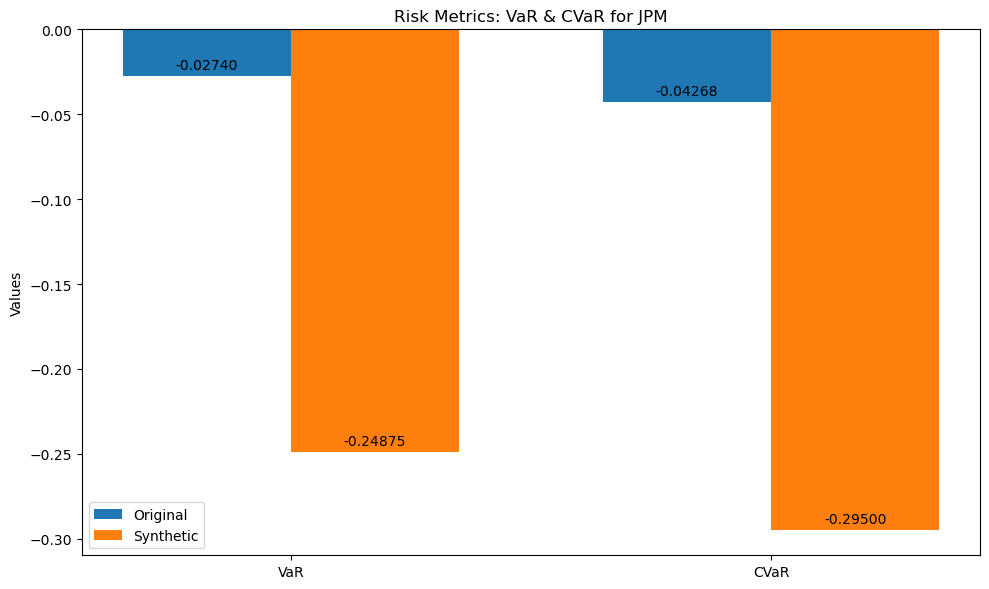


Risk Metrics for JPM:
Original Data Metrics:
VaR: -0.02740
CVaR: -0.04268

Synthetic Data Metrics:
VaR: -0.24875
CVaR: -0.29500


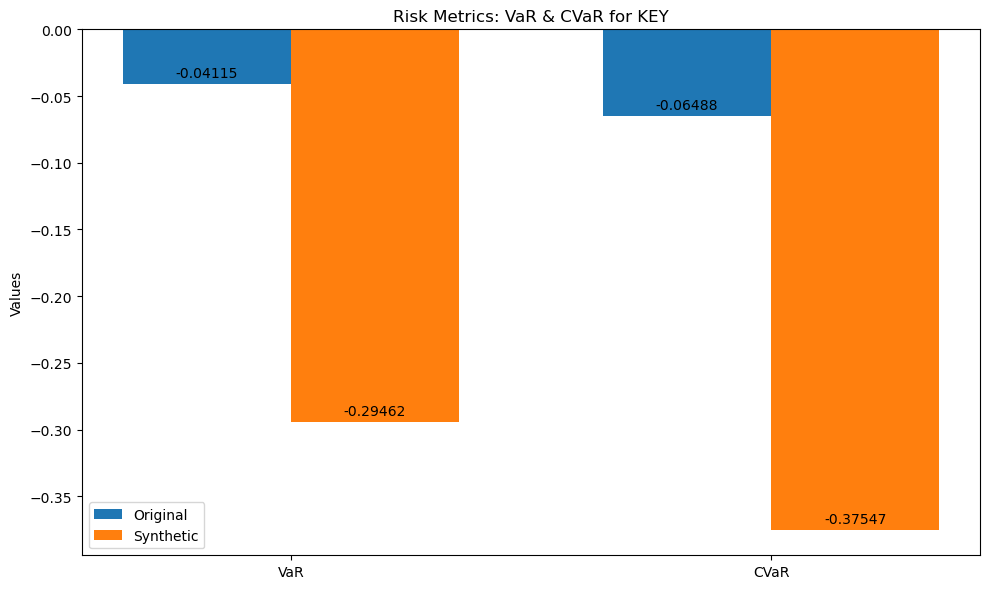


Risk Metrics for KEY:
Original Data Metrics:
VaR: -0.04115
CVaR: -0.06488

Synthetic Data Metrics:
VaR: -0.29462
CVaR: -0.37547


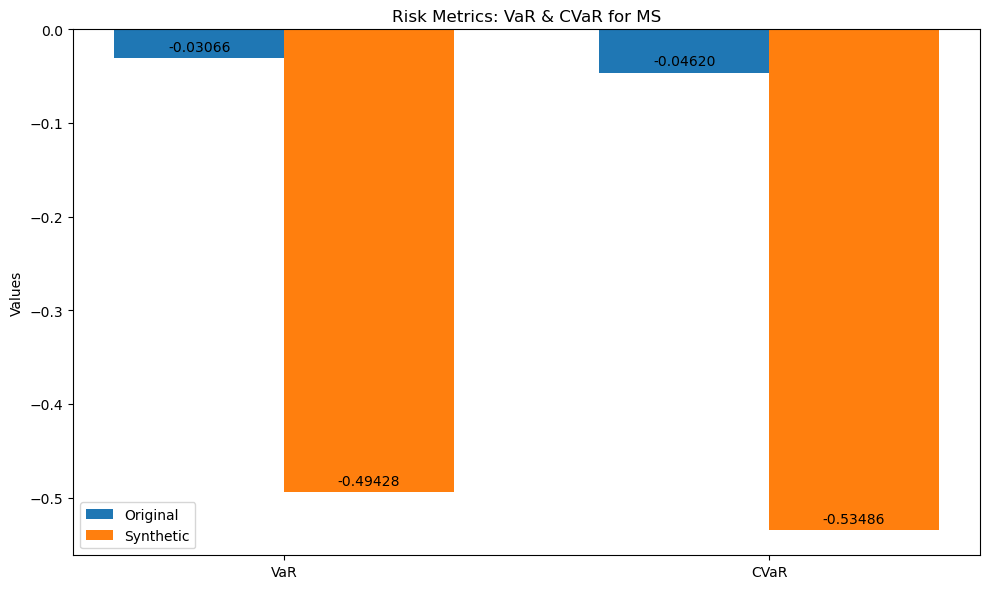


Risk Metrics for MS:
Original Data Metrics:
VaR: -0.03066
CVaR: -0.04620

Synthetic Data Metrics:
VaR: -0.49428
CVaR: -0.53486


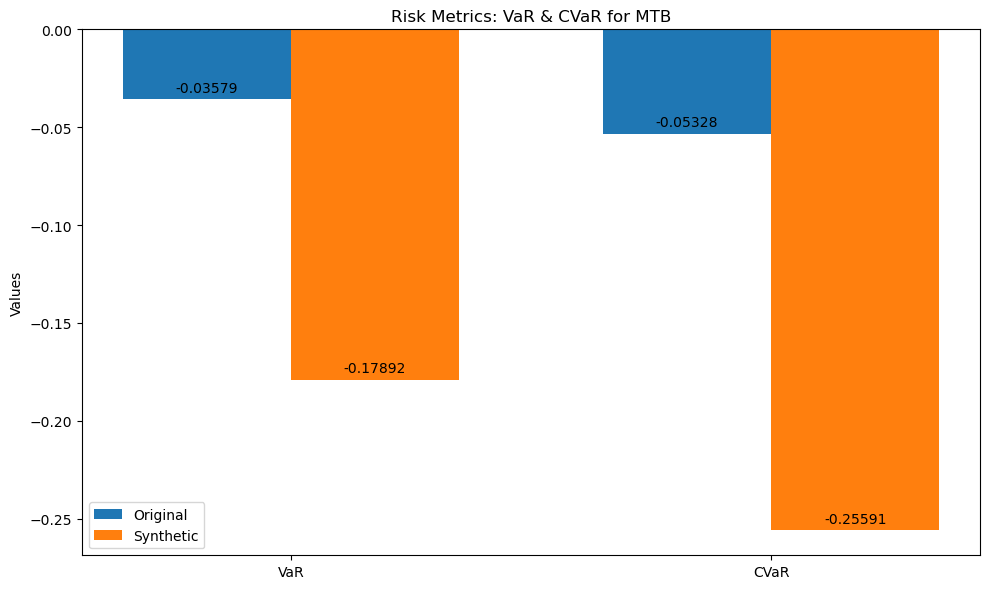


Risk Metrics for MTB:
Original Data Metrics:
VaR: -0.03579
CVaR: -0.05328

Synthetic Data Metrics:
VaR: -0.17892
CVaR: -0.25591


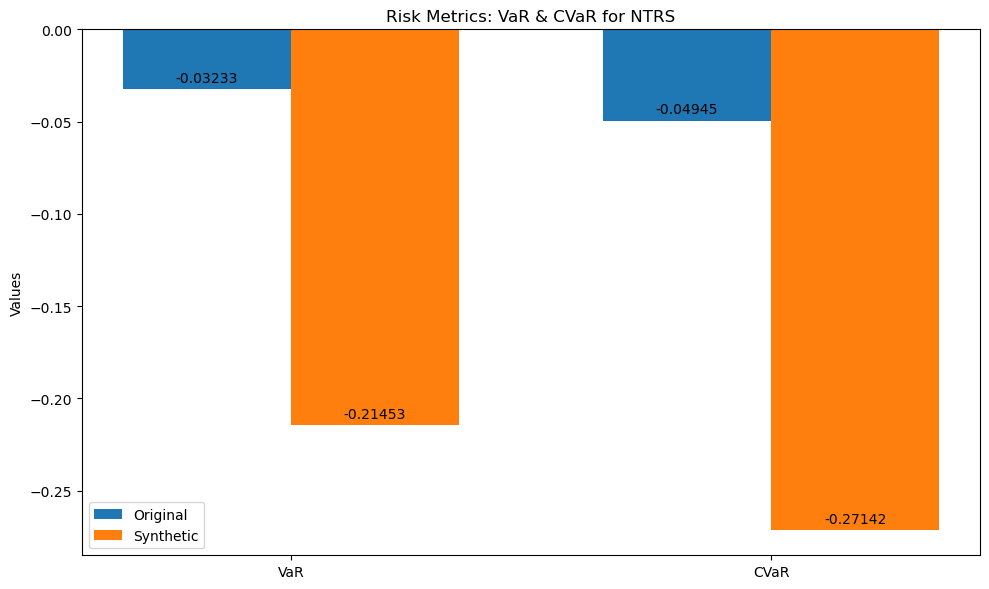


Risk Metrics for NTRS:
Original Data Metrics:
VaR: -0.03233
CVaR: -0.04945

Synthetic Data Metrics:
VaR: -0.21453
CVaR: -0.27142


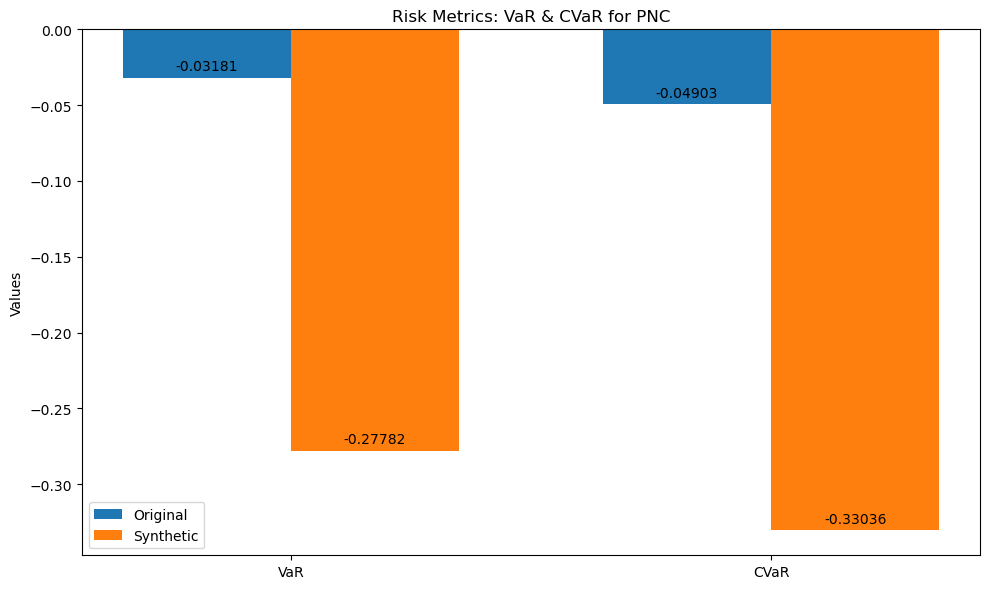


Risk Metrics for PNC:
Original Data Metrics:
VaR: -0.03181
CVaR: -0.04903

Synthetic Data Metrics:
VaR: -0.27782
CVaR: -0.33036


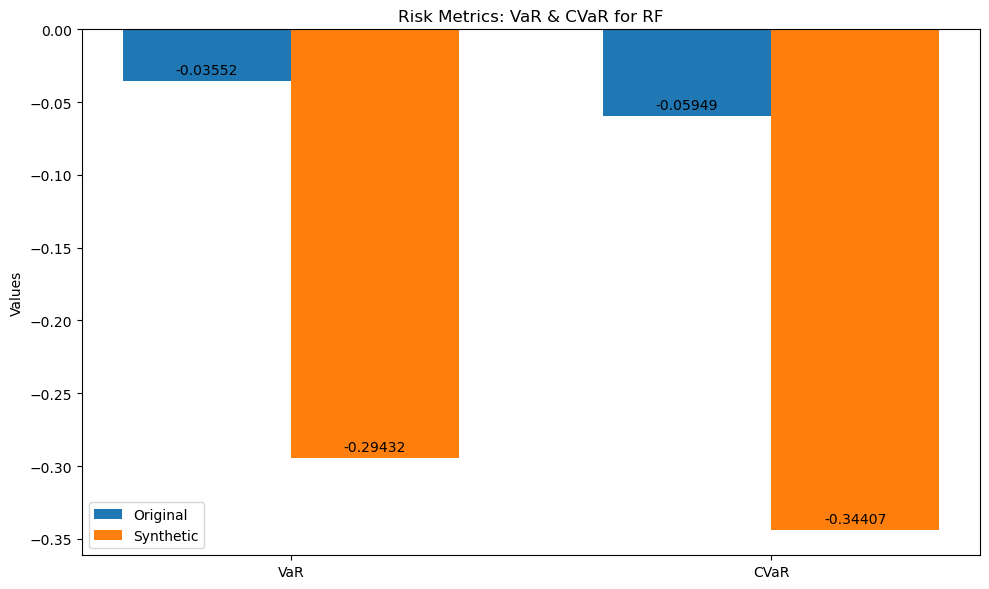


Risk Metrics for RF:
Original Data Metrics:
VaR: -0.03552
CVaR: -0.05949

Synthetic Data Metrics:
VaR: -0.29432
CVaR: -0.34407


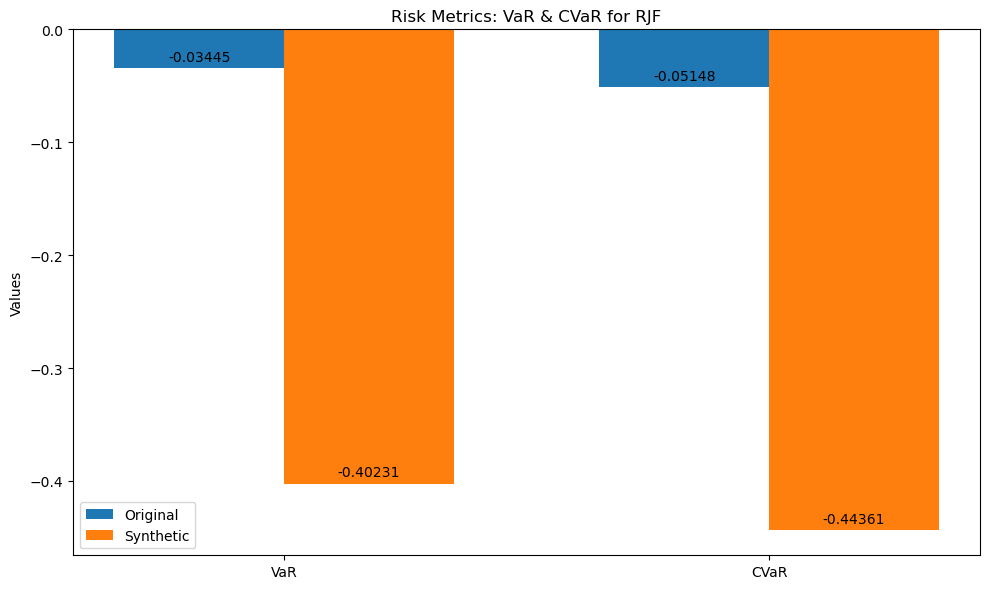


Risk Metrics for RJF:
Original Data Metrics:
VaR: -0.03445
CVaR: -0.05148

Synthetic Data Metrics:
VaR: -0.40231
CVaR: -0.44361


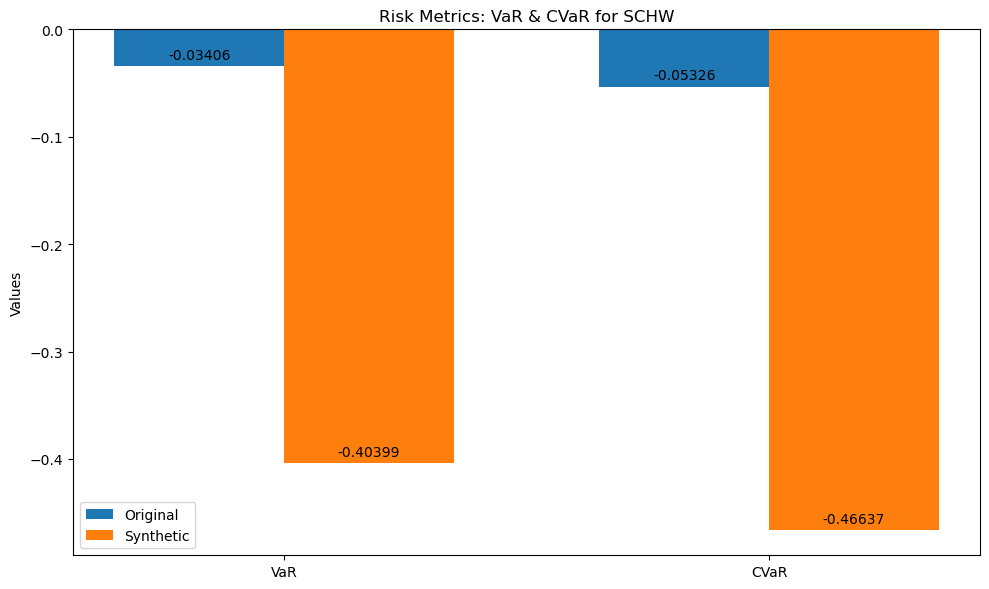


Risk Metrics for SCHW:
Original Data Metrics:
VaR: -0.03406
CVaR: -0.05326

Synthetic Data Metrics:
VaR: -0.40399
CVaR: -0.46637


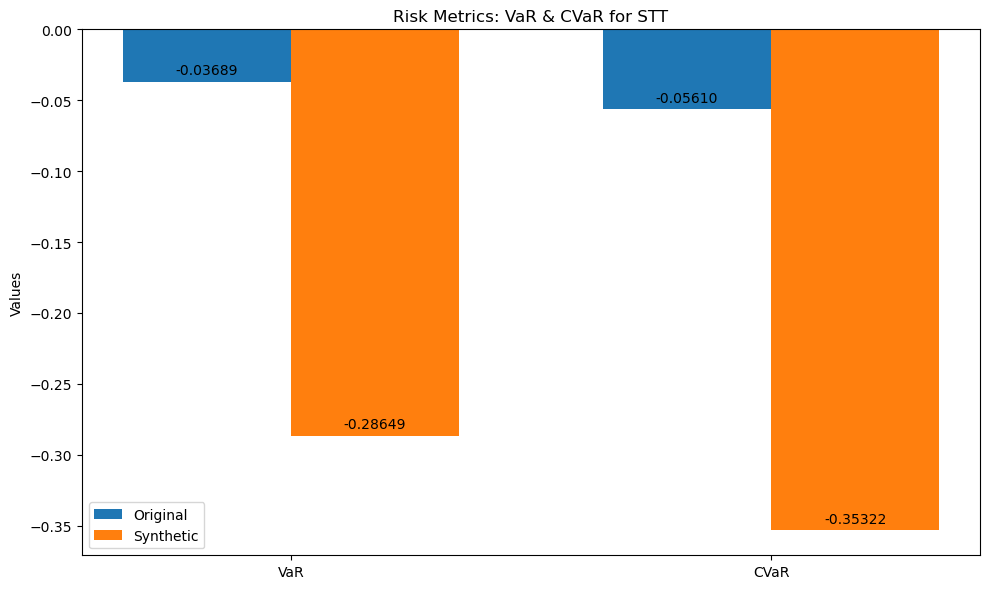


Risk Metrics for STT:
Original Data Metrics:
VaR: -0.03689
CVaR: -0.05610

Synthetic Data Metrics:
VaR: -0.28649
CVaR: -0.35322


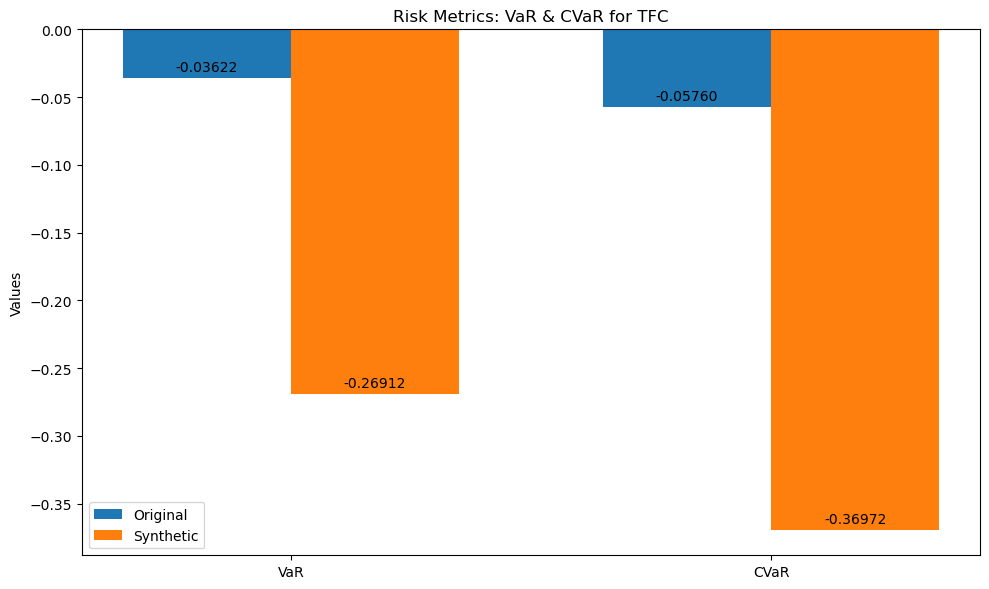


Risk Metrics for TFC:
Original Data Metrics:
VaR: -0.03622
CVaR: -0.05760

Synthetic Data Metrics:
VaR: -0.26912
CVaR: -0.36972


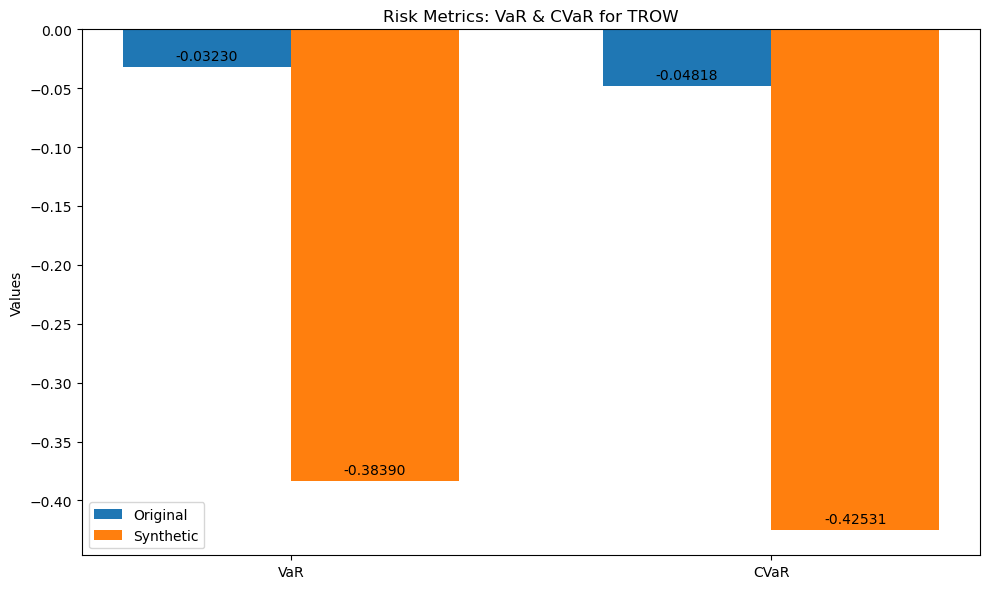


Risk Metrics for TROW:
Original Data Metrics:
VaR: -0.03230
CVaR: -0.04818

Synthetic Data Metrics:
VaR: -0.38390
CVaR: -0.42531


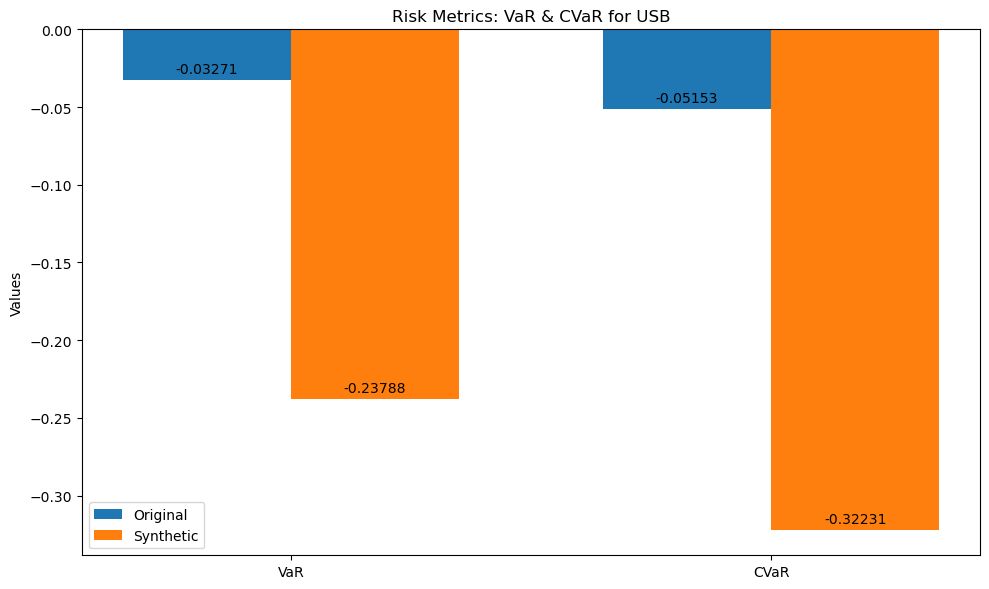


Risk Metrics for USB:
Original Data Metrics:
VaR: -0.03271
CVaR: -0.05153

Synthetic Data Metrics:
VaR: -0.23788
CVaR: -0.32231


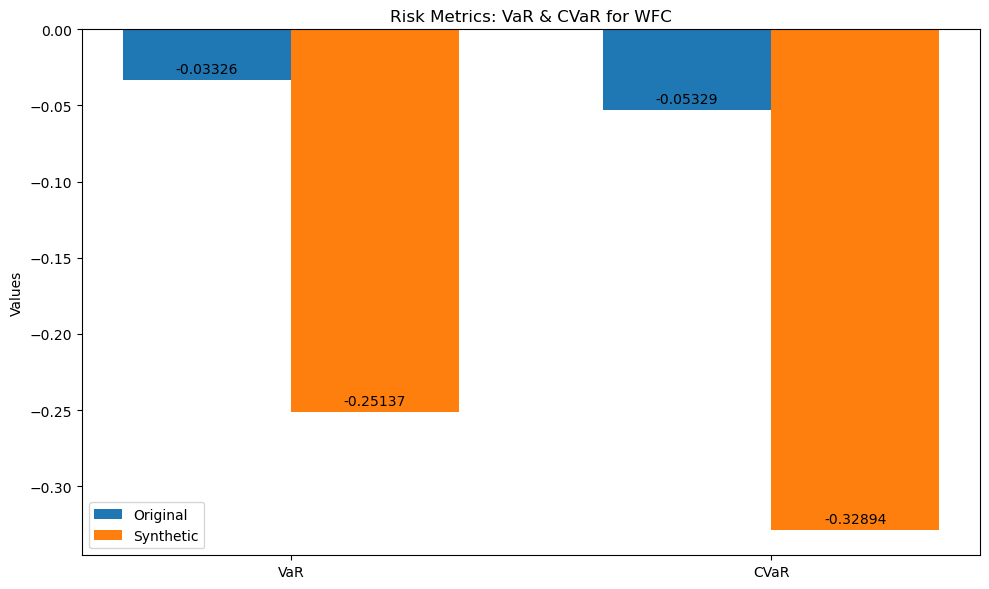


Risk Metrics for WFC:
Original Data Metrics:
VaR: -0.03326
CVaR: -0.05329

Synthetic Data Metrics:
VaR: -0.25137
CVaR: -0.32894


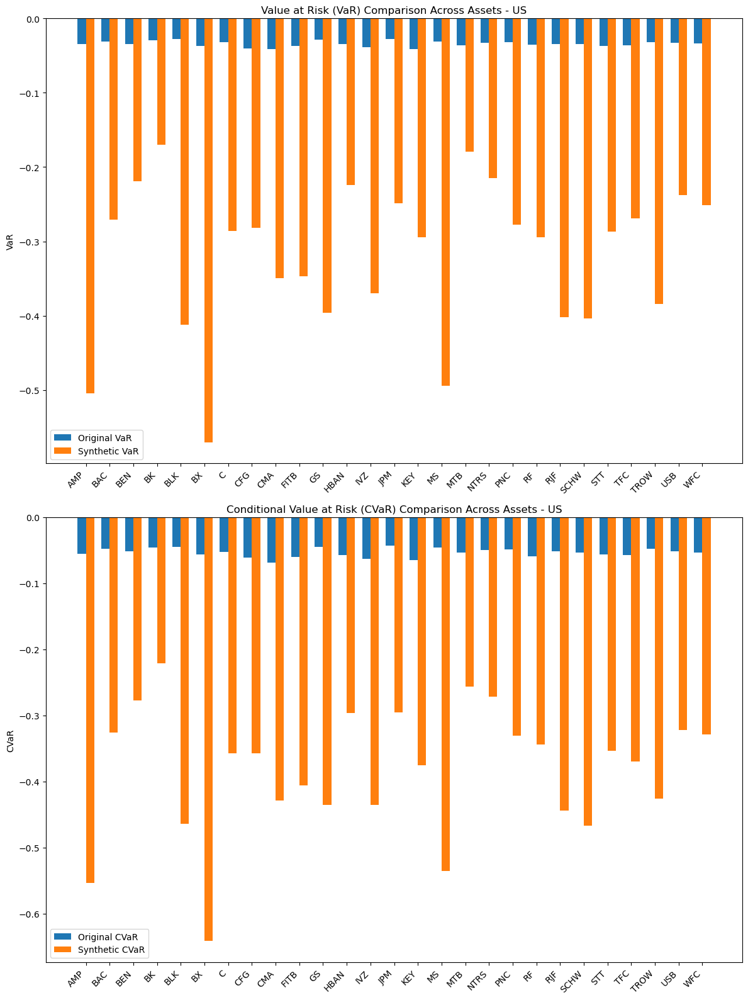


Original Portfolio:

Portfolio Risk Metrics:
VaR: -0.03071
CVaR: -0.04600

Synthetic Portfolio:

Portfolio Risk Metrics:
VaR: -0.23263
CVaR: -0.27800


In [15]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

def compute_var_cvar(returns, alpha=0.05):
    """
    Compute VaR and CVaR for given returns and alpha.
    """
    sorted_returns = returns.sort_values()
    index = int(alpha * len(sorted_returns))
    VaR = sorted_returns.iloc[index]
    CVaR = sorted_returns.iloc[:index].mean()
    return VaR, CVaR

def analyze_risk_metrics(original_data, synthetic_data):
    original_returns = original_data.pct_change().dropna()
    synthetic_returns = synthetic_data.pct_change().dropna()

    original_vars = []
    original_cvars = []
    synthetic_vars = []
    synthetic_cvars = []
    assets = []

    for column in original_returns.columns:
        original_var, original_cvar = compute_var_cvar(original_returns[column])
        synthetic_var, synthetic_cvar = compute_var_cvar(synthetic_returns[column])

        original_vars.append(original_var)
        original_cvars.append(original_cvar)
        synthetic_vars.append(synthetic_var)
        synthetic_cvars.append(synthetic_cvar)
        assets.append(column)

        # Individual asset visualization (unchanged)
        labels = ['VaR', 'CVaR']
        original_metrics = [original_var, original_cvar]
        synthetic_metrics = [synthetic_var, synthetic_cvar]

        x = np.arange(len(labels))
        width = 0.35

        fig, ax = plt.subplots(figsize=(10, 6))
        rects1 = ax.bar(x - width/2, original_metrics, width, label='Original')
        rects2 = ax.bar(x + width/2, synthetic_metrics, width, label='Synthetic')

        ax.set_ylabel('Values')
        ax.set_title(f'Risk Metrics: VaR & CVaR for {column}')
        ax.set_xticks(x)
        ax.set_xticklabels(labels)
        ax.legend()

        def autolabel(rects):
            for rect in rects:
                height = rect.get_height()
                ax.annotate(f'{height:.5f}',
                            xy=(rect.get_x() + rect.get_width() / 2, height),
                            xytext=(0, 3),
                            textcoords="offset points",
                            ha='center', va='bottom')

        autolabel(rects1)
        autolabel(rects2)

        plt.tight_layout()
        plt.show()

        # Display the VaR and CVaR for both datasets
        print(f"\nRisk Metrics for {column}:")
        print("Original Data Metrics:")
        print(f"VaR: {original_var:.5f}")
        print(f"CVaR: {original_cvar:.5f}")

        print("\nSynthetic Data Metrics:")
        print(f"VaR: {synthetic_var:.5f}")
        print(f"CVaR: {synthetic_cvar:.5f}")

    # Aggregate chart for all assets
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 16))
    x = np.arange(len(assets))
    width = 0.35

    # VaR comparison
    ax1.bar(x - width/2, original_vars, width, label='Original VaR')
    ax1.bar(x + width/2, synthetic_vars, width, label='Synthetic VaR')
    ax1.set_ylabel('VaR')
    ax1.set_title('Value at Risk (VaR) Comparison Across Assets - US')
    ax1.set_xticks(x)
    ax1.set_xticklabels(assets, rotation=45, ha='right')
    ax1.legend()

    # CVaR comparison
    ax2.bar(x - width/2, original_cvars, width, label='Original CVaR')
    ax2.bar(x + width/2, synthetic_cvars, width, label='Synthetic CVaR')
    ax2.set_ylabel('CVaR')
    ax2.set_title('Conditional Value at Risk (CVaR) Comparison Across Assets - US')
    ax2.set_xticks(x)
    ax2.set_xticklabels(assets, rotation=45, ha='right')
    ax2.legend()

    plt.tight_layout()
    plt.show()

def analyze_portfolio_risk(data, weights=None):
    if weights is None:
        weights = np.ones(len(data.columns)) / len(data.columns)  # Equal weights if not provided
    
    portfolio_returns = (data.pct_change().dropna() * weights).sum(axis=1)
    var, cvar = compute_var_cvar(portfolio_returns)
    
    print("\nPortfolio Risk Metrics:")
    print(f"VaR: {var:.5f}")
    print(f"CVaR: {cvar:.5f}")

# Assuming stock_data and rescaled_synthetic_data are available
# If they're not, you might need to load or recreate them here

# Perform the risk metric analysis
analyze_risk_metrics(stock_data, rescaled_synthetic_data)

print("\nOriginal Portfolio:")
analyze_portfolio_risk(stock_data)

print("\nSynthetic Portfolio:")
analyze_portfolio_risk(rescaled_synthetic_data)

# Distributional Analysis


Distributional Analysis for AMP:
K-S Statistic: 0.4270
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.1585		0.9964
Kurtosis:	18.5963		0.6993


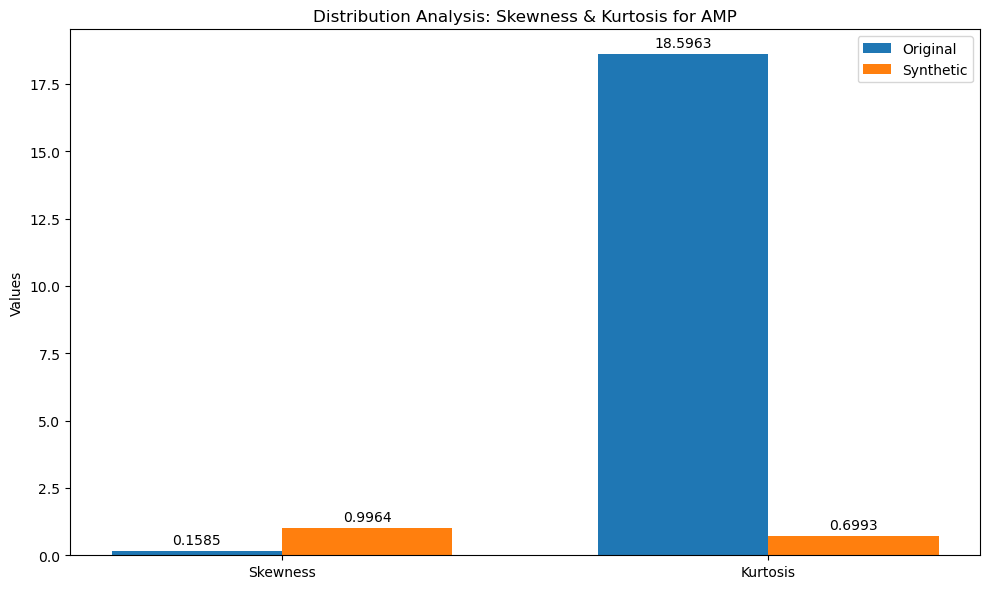

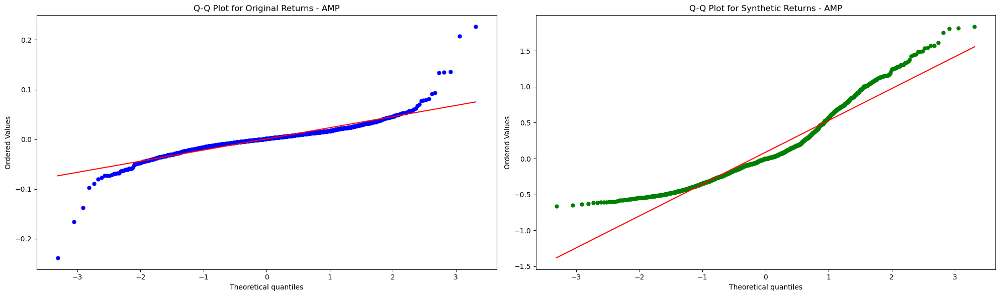


Distributional Analysis for BAC:
K-S Statistic: 0.3816
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.4021		0.7433
Kurtosis:	10.5100		1.2784


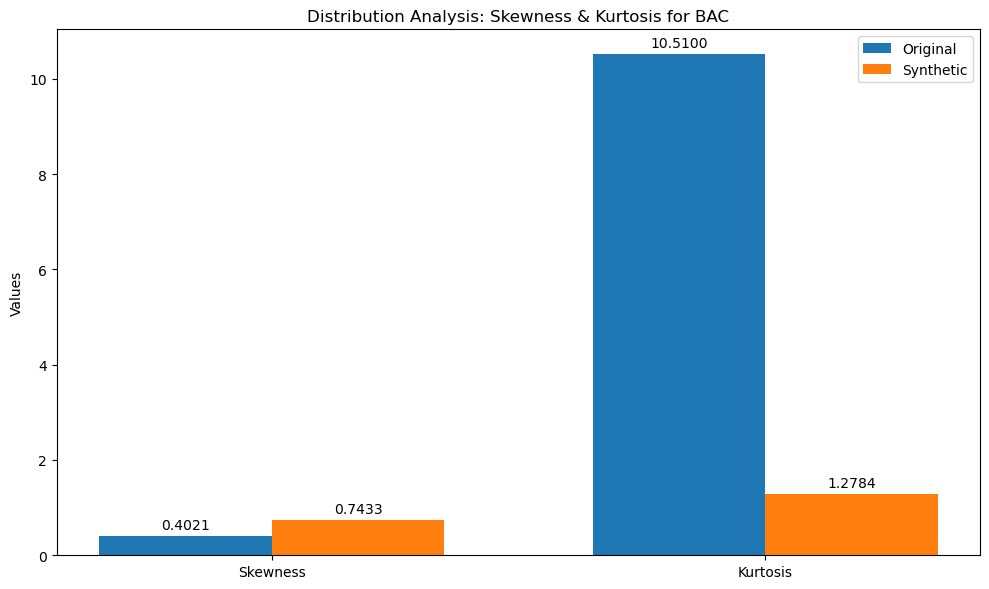

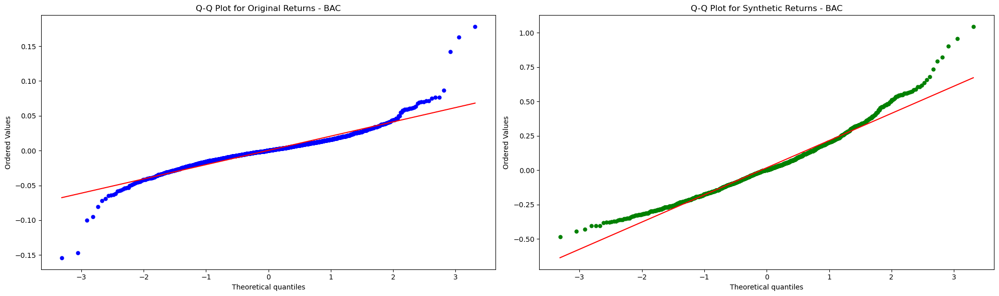


Distributional Analysis for BEN:
K-S Statistic: 0.3392
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.0296		0.4967
Kurtosis:	4.7268		0.9781


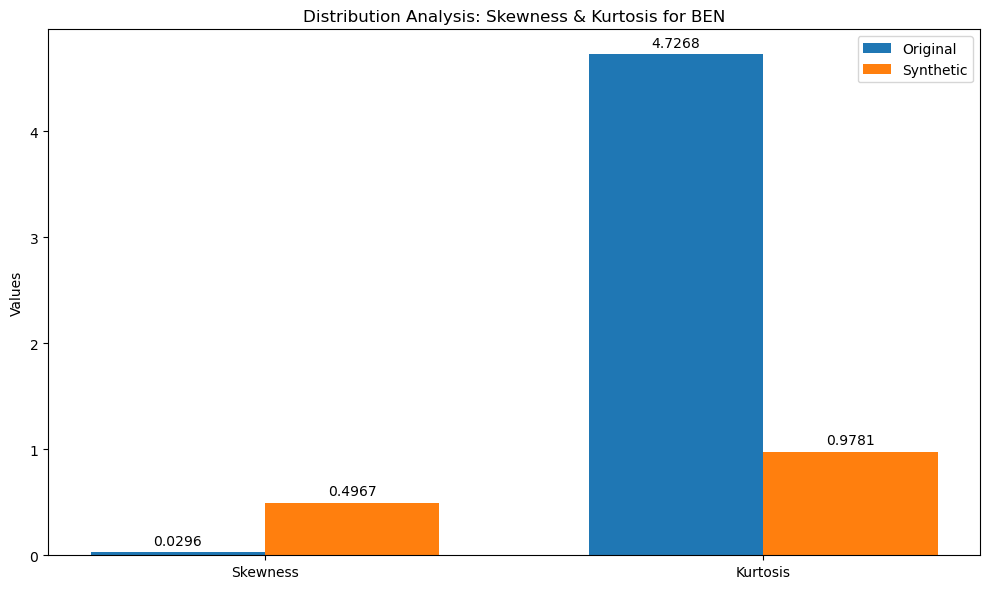

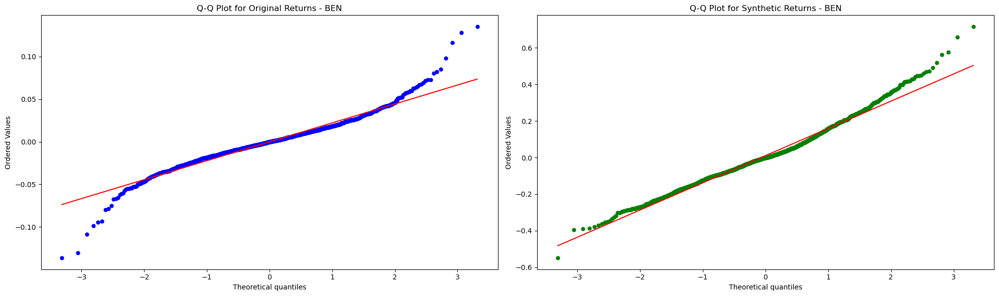


Distributional Analysis for BK:
K-S Statistic: 0.3479
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.1260		0.4891
Kurtosis:	9.5278		1.0249


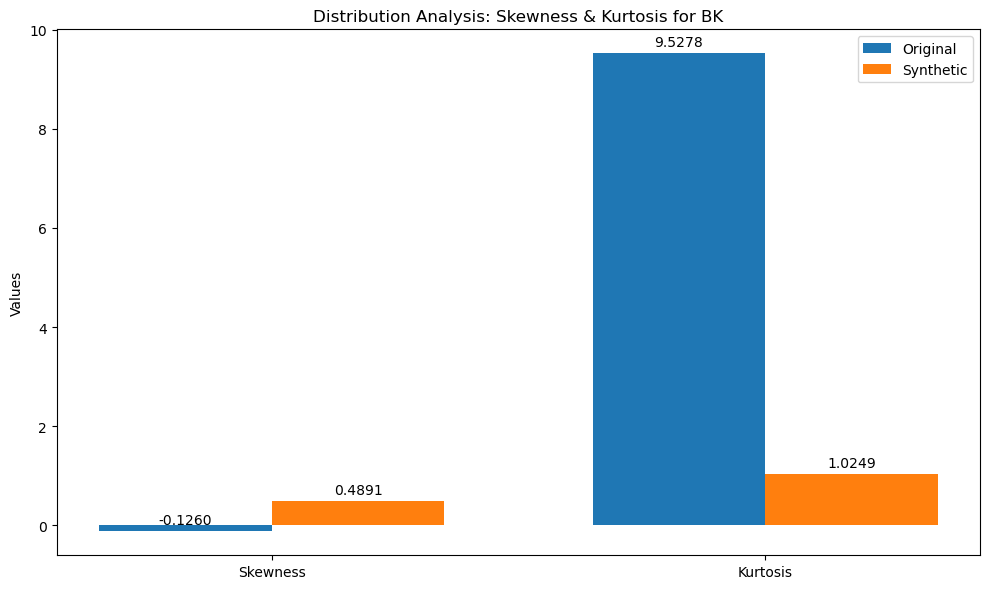

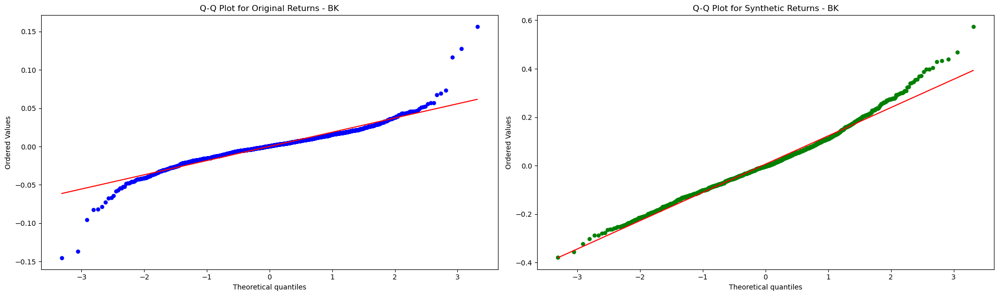


Distributional Analysis for BLK:
K-S Statistic: 0.4077
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.1587		0.7774
Kurtosis:	8.0076		0.3326


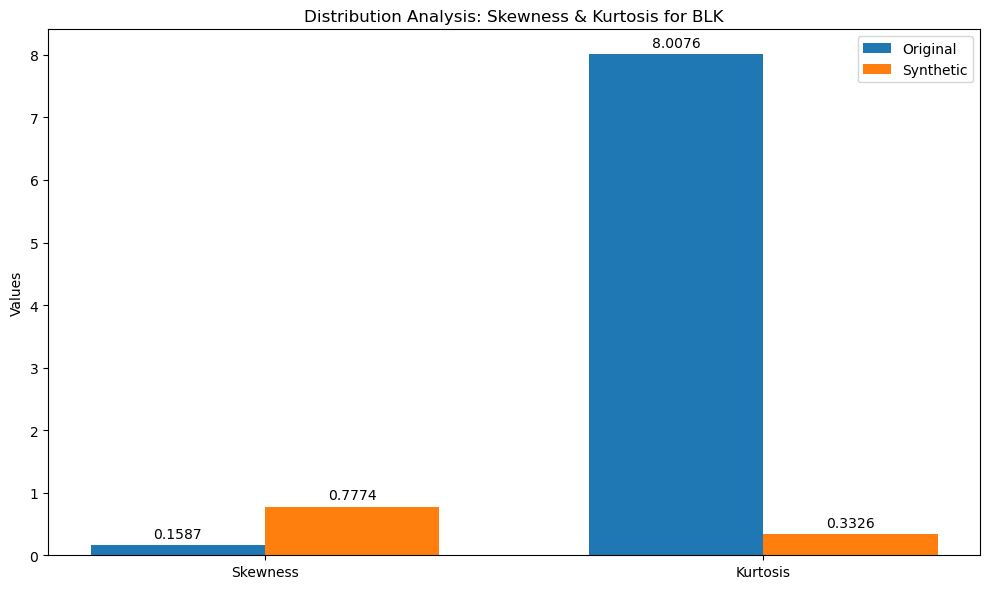

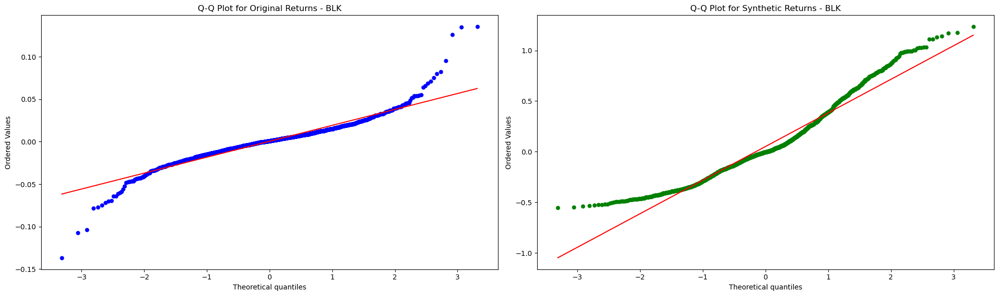


Distributional Analysis for BX:
K-S Statistic: 0.4336
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.0422		1.4250
Kurtosis:	6.0540		2.5489


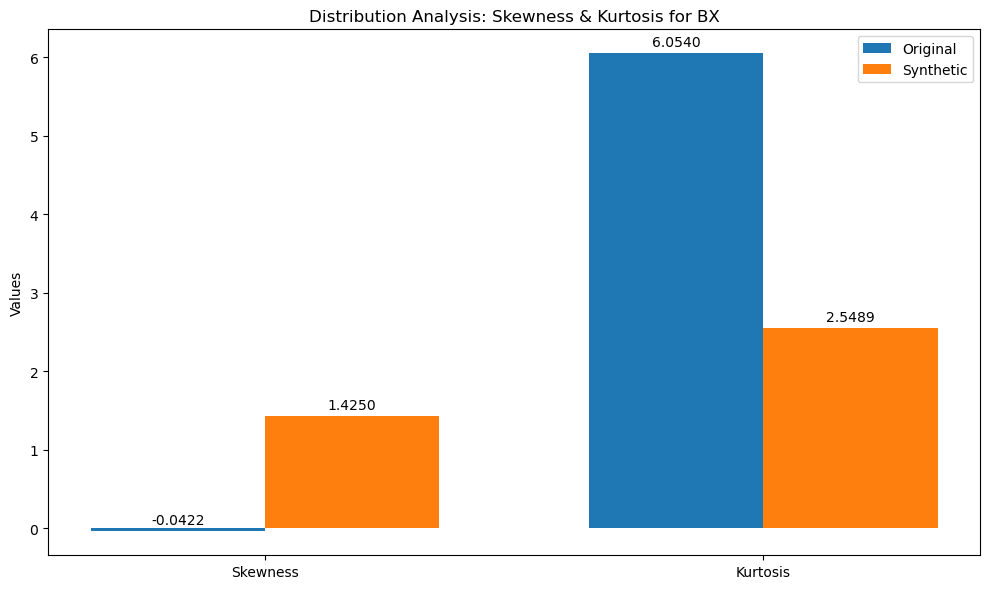

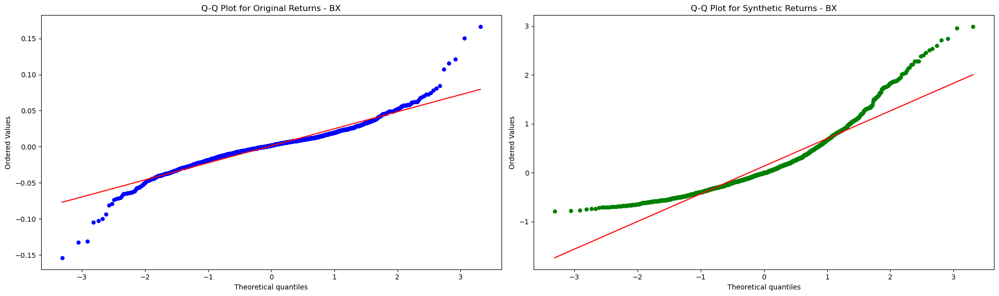


Distributional Analysis for C:
K-S Statistic: 0.3387
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.0580		0.8060
Kurtosis:	12.2385		1.9706


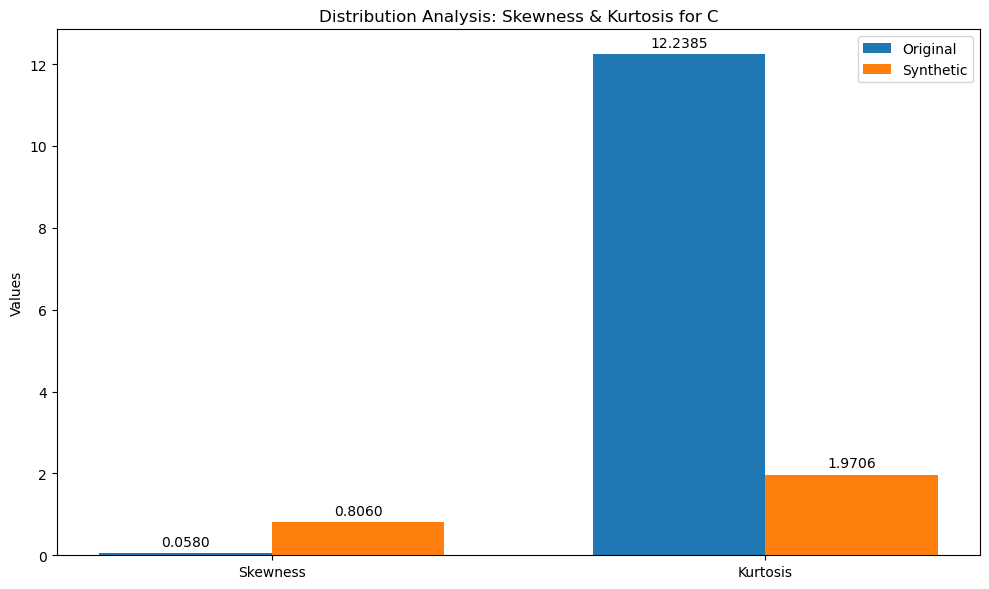

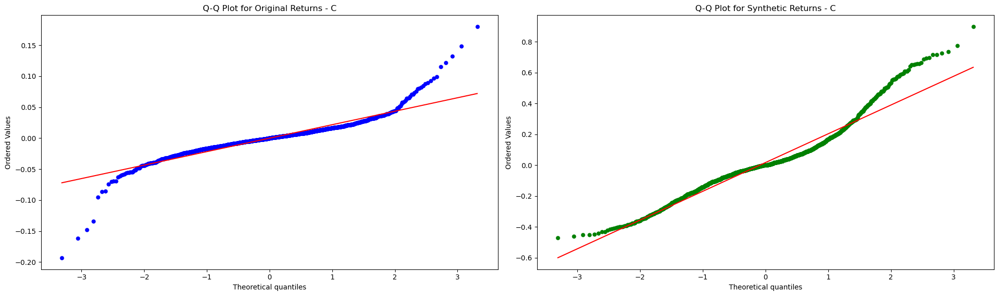


Distributional Analysis for CFG:
K-S Statistic: 0.3821
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.1647		0.9924
Kurtosis:	9.8721		2.8671


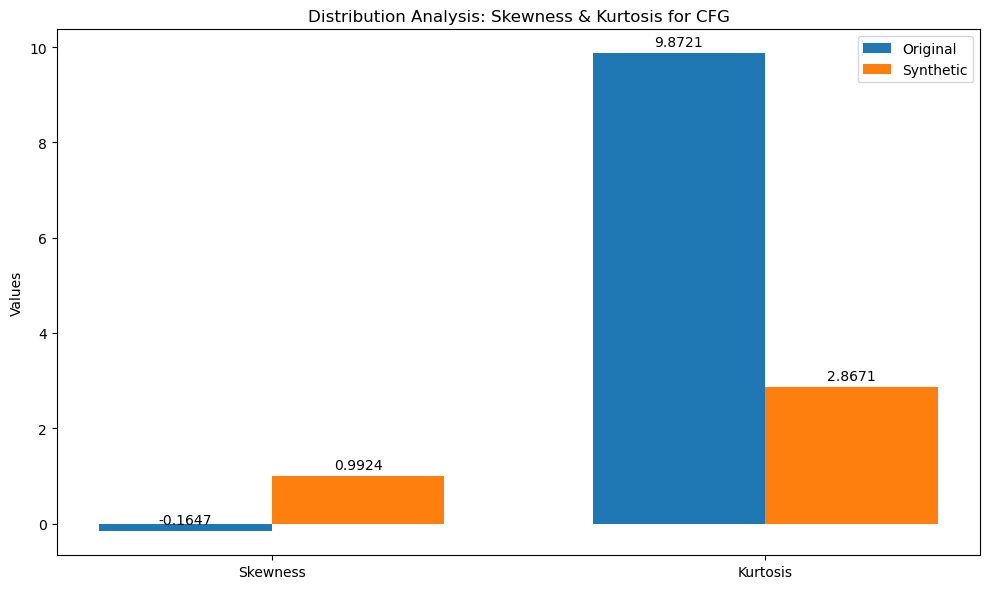

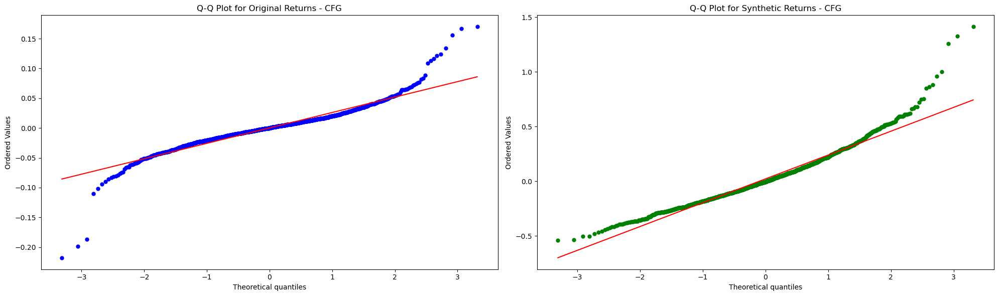


Distributional Analysis for CMA:
K-S Statistic: 0.3662
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.5807		1.3536
Kurtosis:	12.0830		4.5589


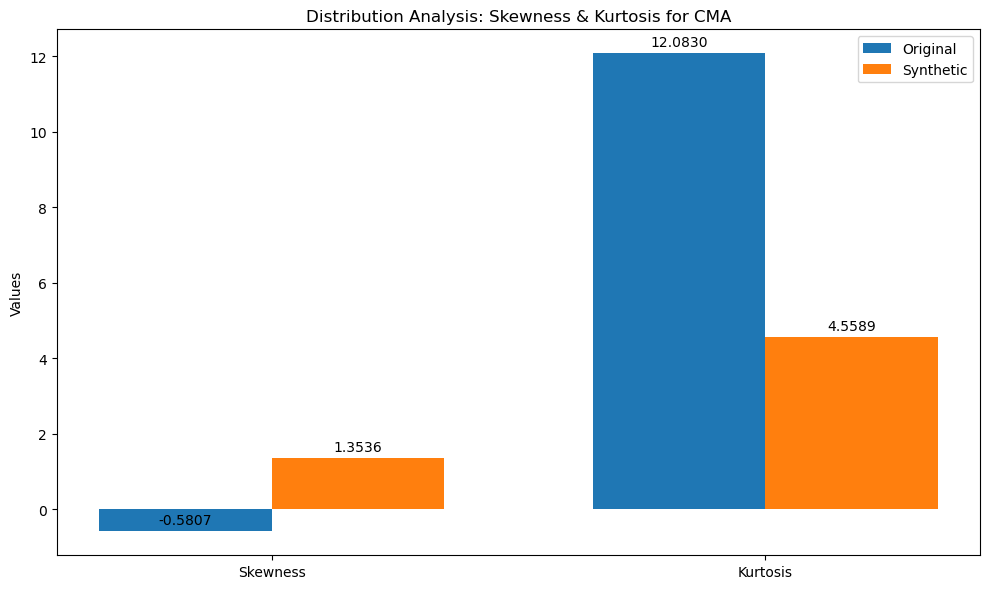

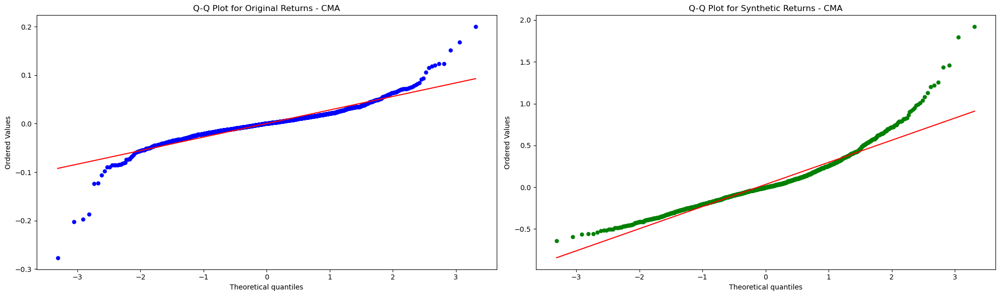


Distributional Analysis for FITB:
K-S Statistic: 0.3957
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.0844		1.0528
Kurtosis:	10.6969		2.7327


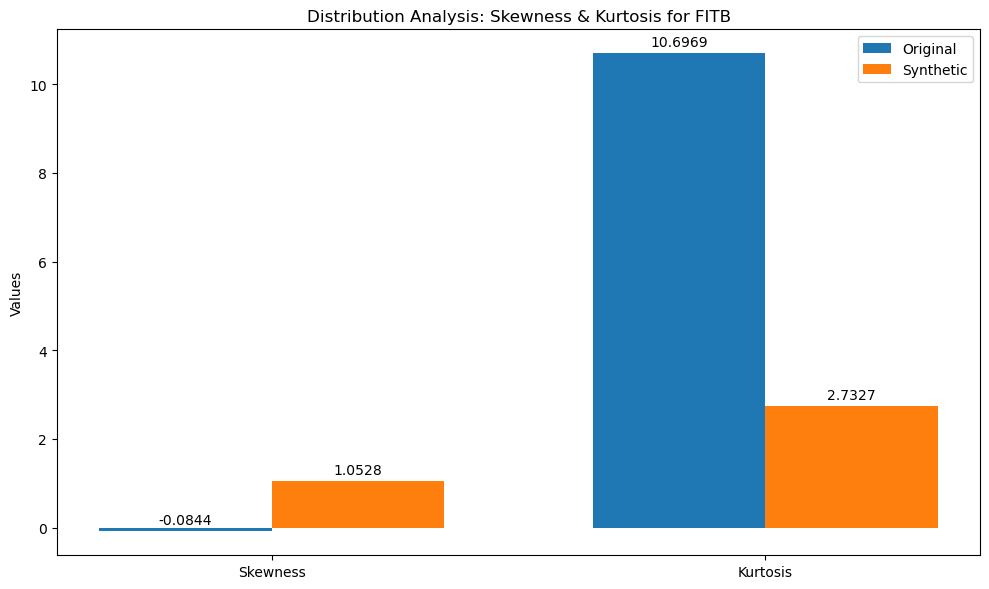

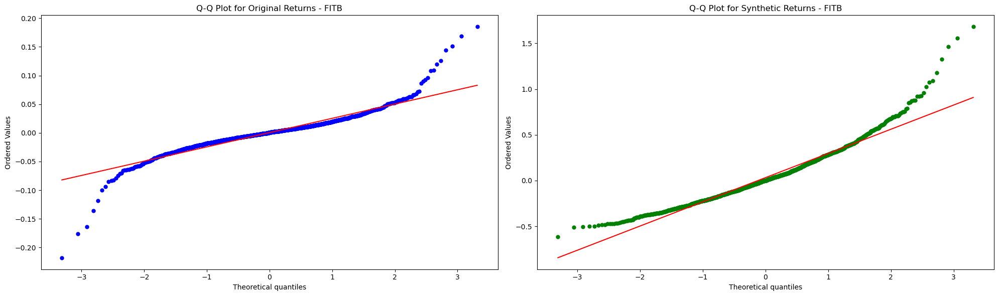


Distributional Analysis for GS:
K-S Statistic: 0.3947
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.2006		0.7303
Kurtosis:	9.7522		0.2442


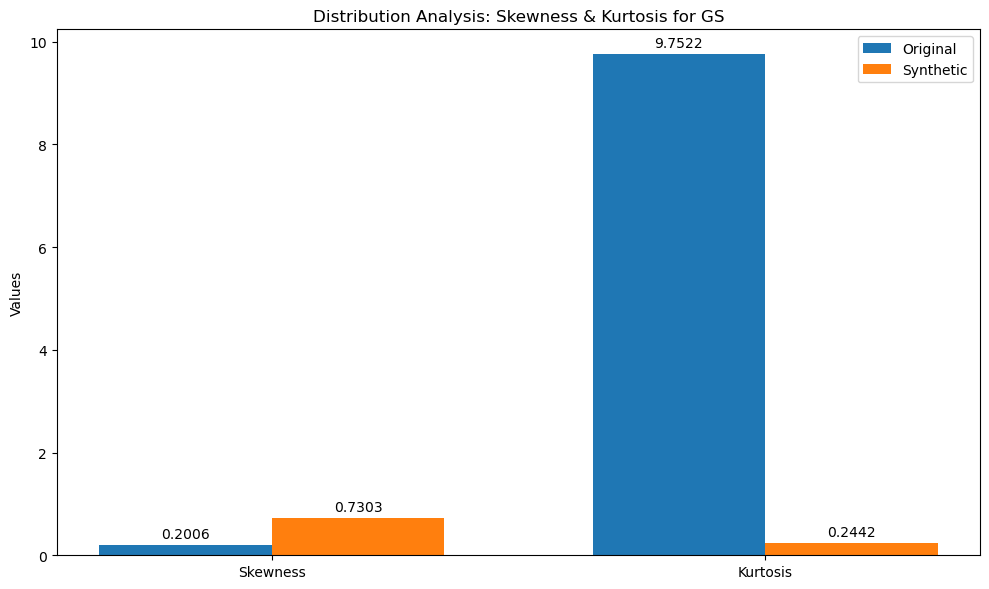

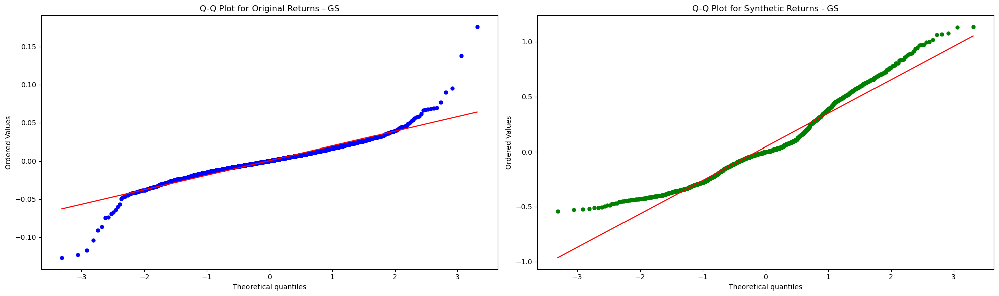


Distributional Analysis for HBAN:
K-S Statistic: 0.2995
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.0501		1.0020
Kurtosis:	7.6681		3.9668


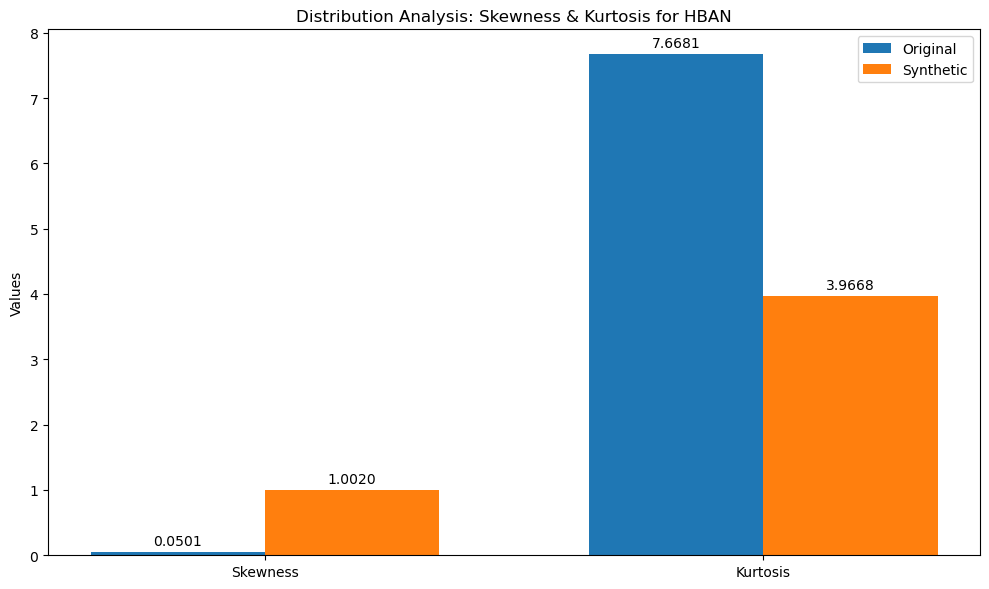

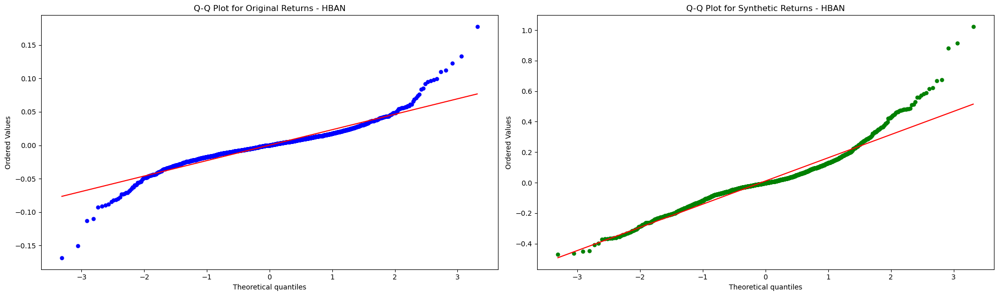


Distributional Analysis for IVZ:
K-S Statistic: 0.4037
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.1766		0.9757
Kurtosis:	8.4242		1.7309


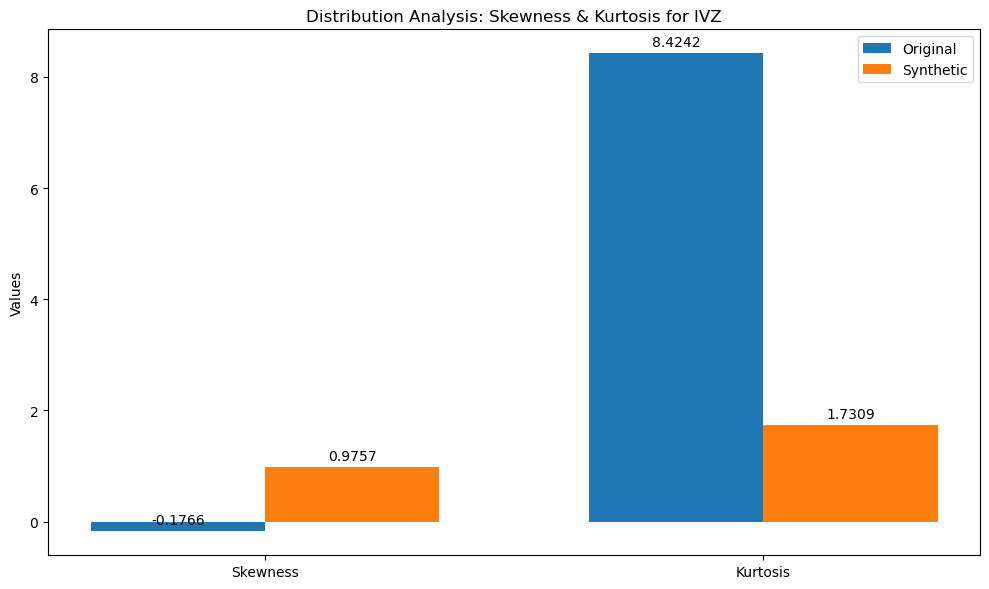

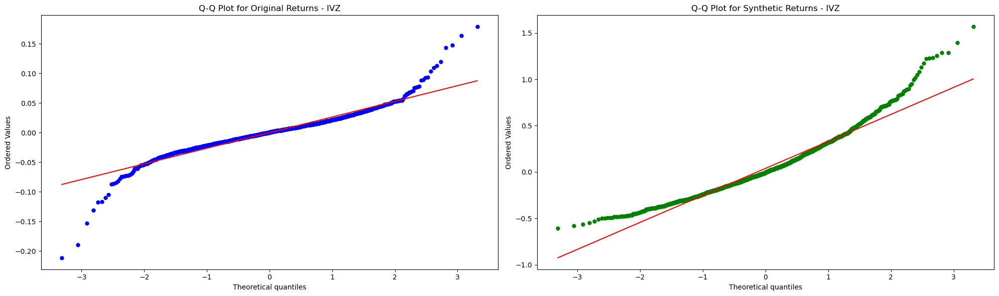


Distributional Analysis for JPM:
K-S Statistic: 0.3902
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.3786		0.4797
Kurtosis:	13.2937		0.1231


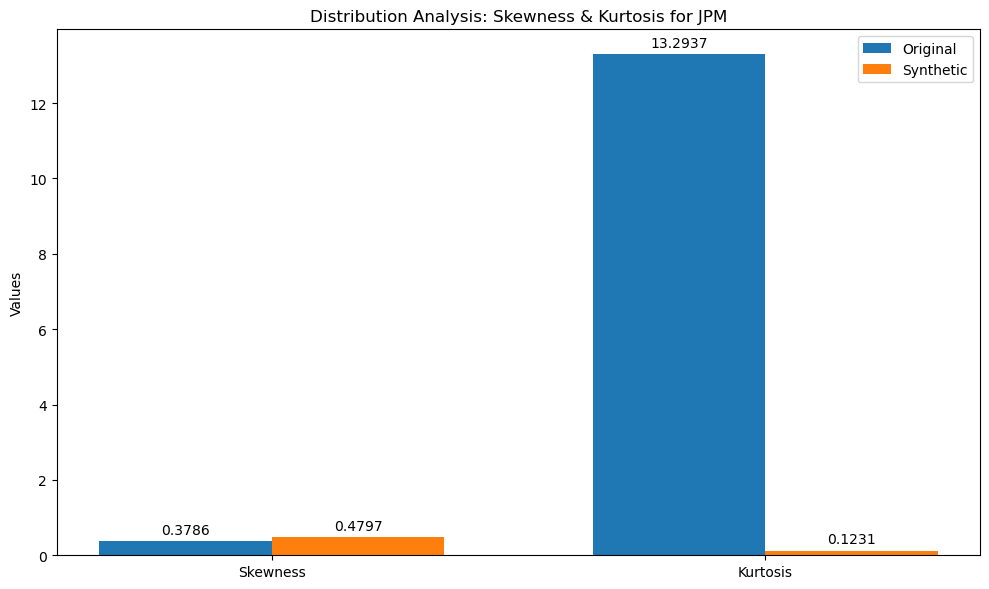

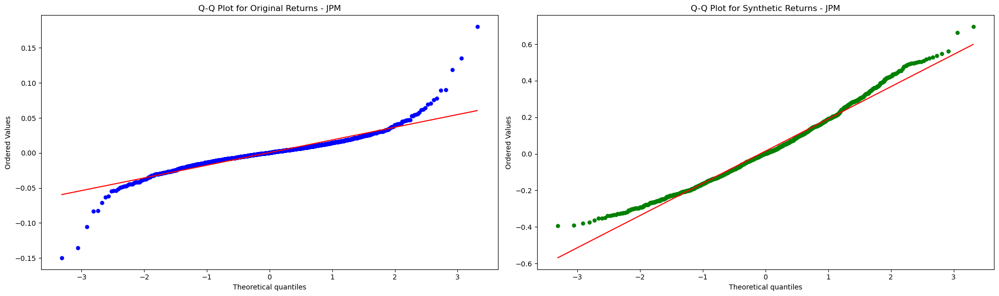


Distributional Analysis for KEY:
K-S Statistic: 0.3676
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.4863		1.2623
Kurtosis:	13.6511		4.2330


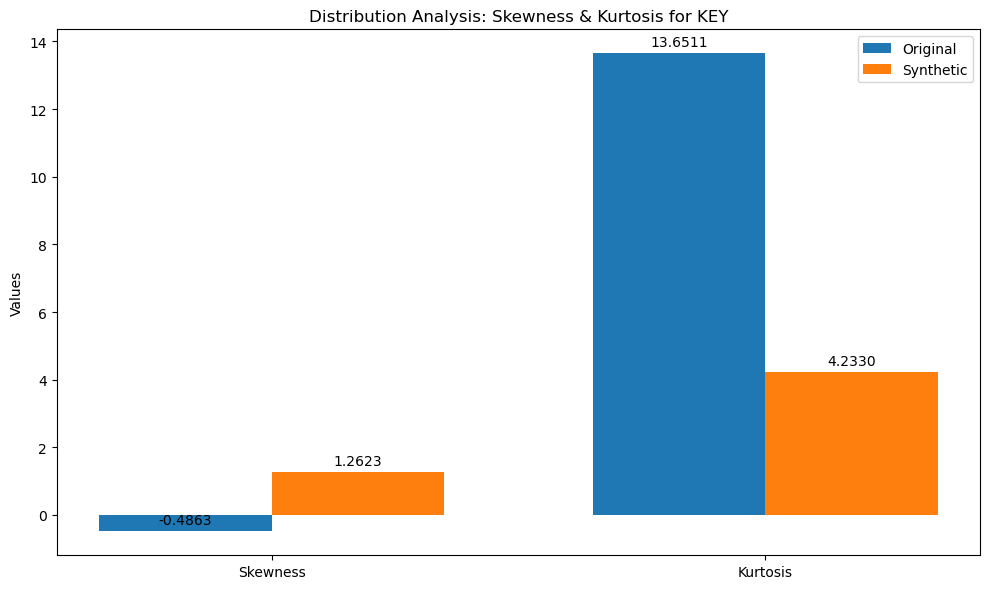

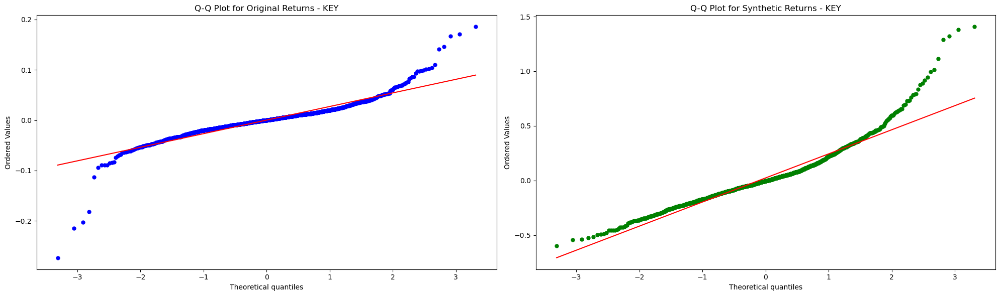


Distributional Analysis for MS:
K-S Statistic: 0.4183
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.5550		0.8880
Kurtosis:	13.4954		0.3677


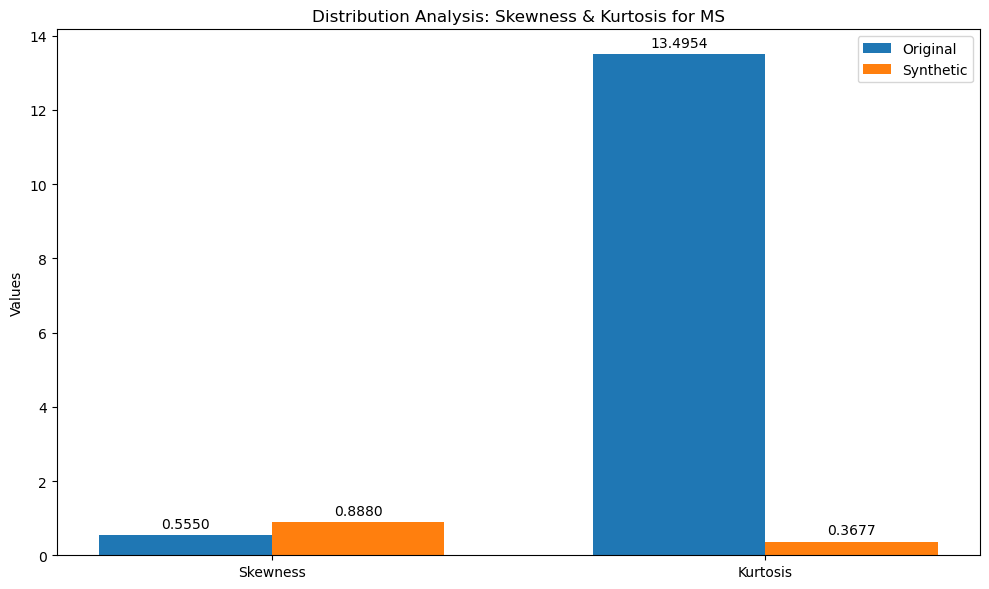

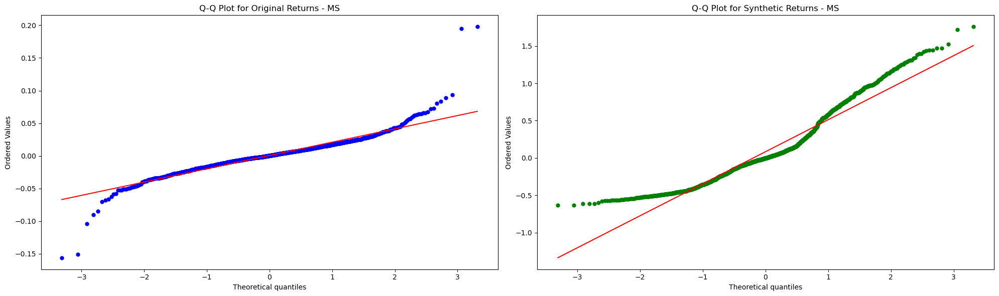


Distributional Analysis for MTB:
K-S Statistic: 0.2853
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.6908		0.7527
Kurtosis:	12.1108		3.6431


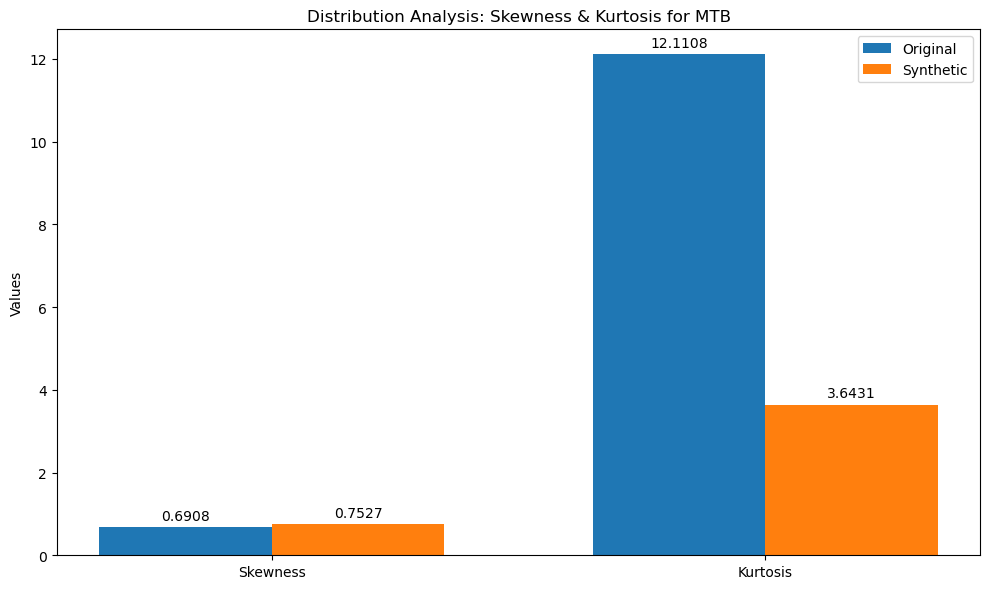

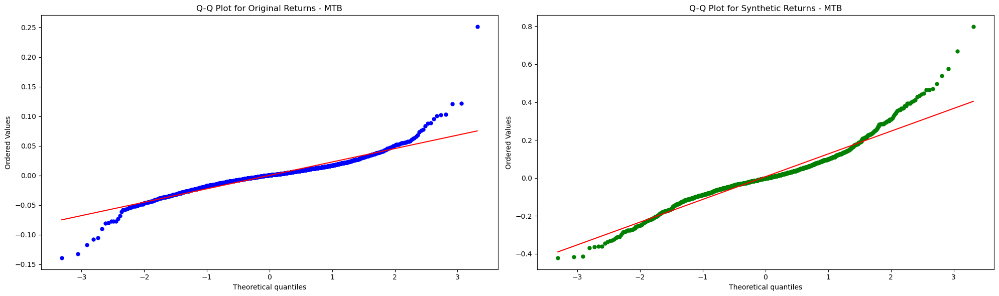


Distributional Analysis for NTRS:
K-S Statistic: 0.3687
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.1951		0.6043
Kurtosis:	12.5403		1.0600


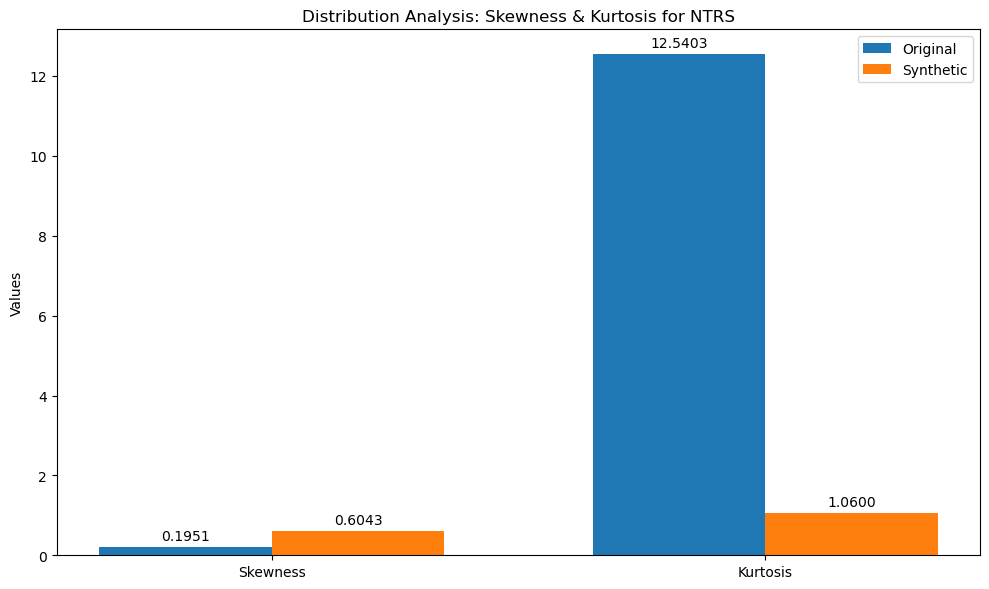

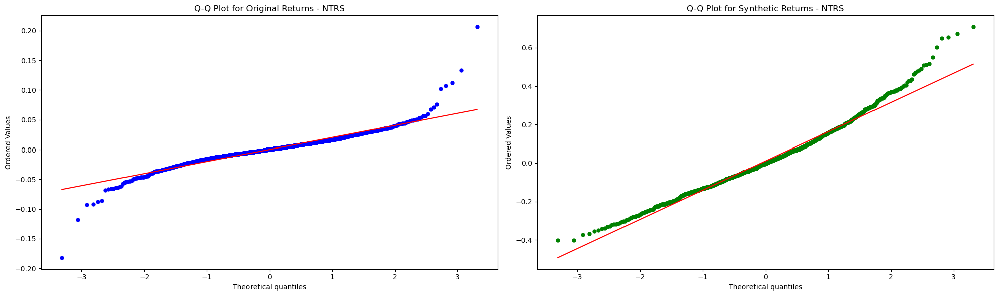


Distributional Analysis for PNC:
K-S Statistic: 0.3890
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.0110		0.6229
Kurtosis:	8.0107		0.6307


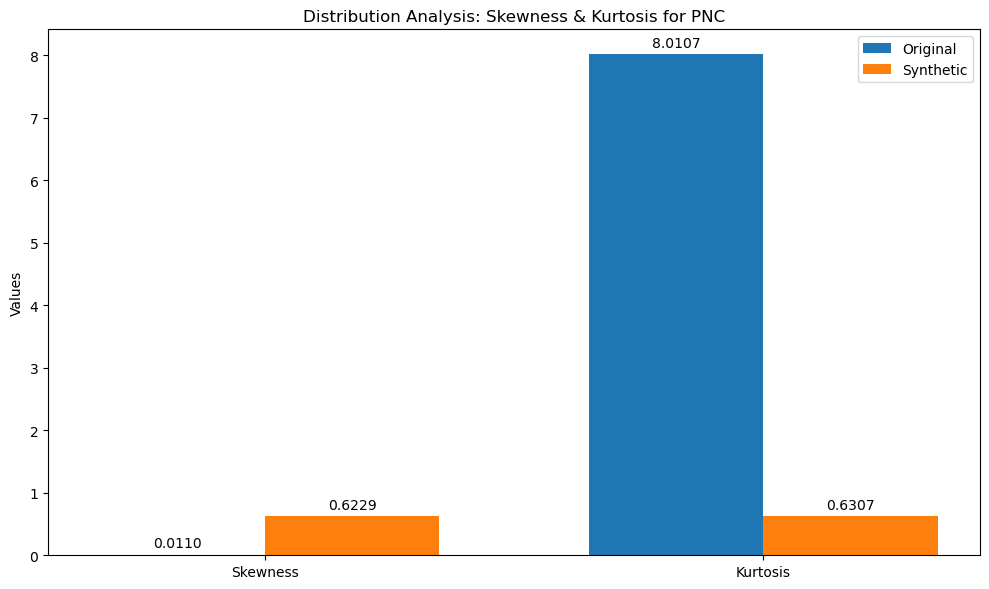

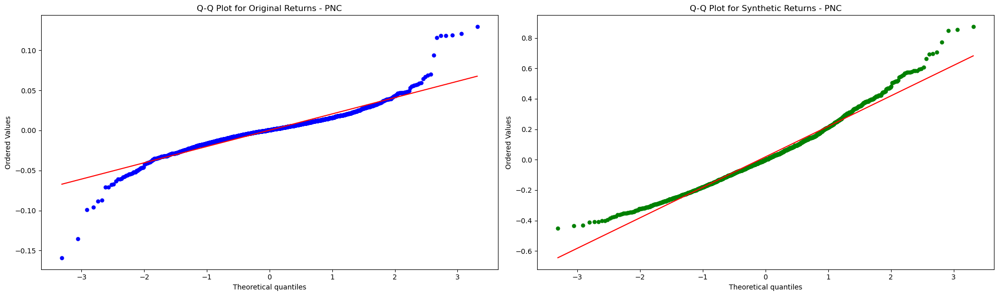


Distributional Analysis for RF:
K-S Statistic: 0.3682
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.2380		0.6279
Kurtosis:	8.1625		0.3538


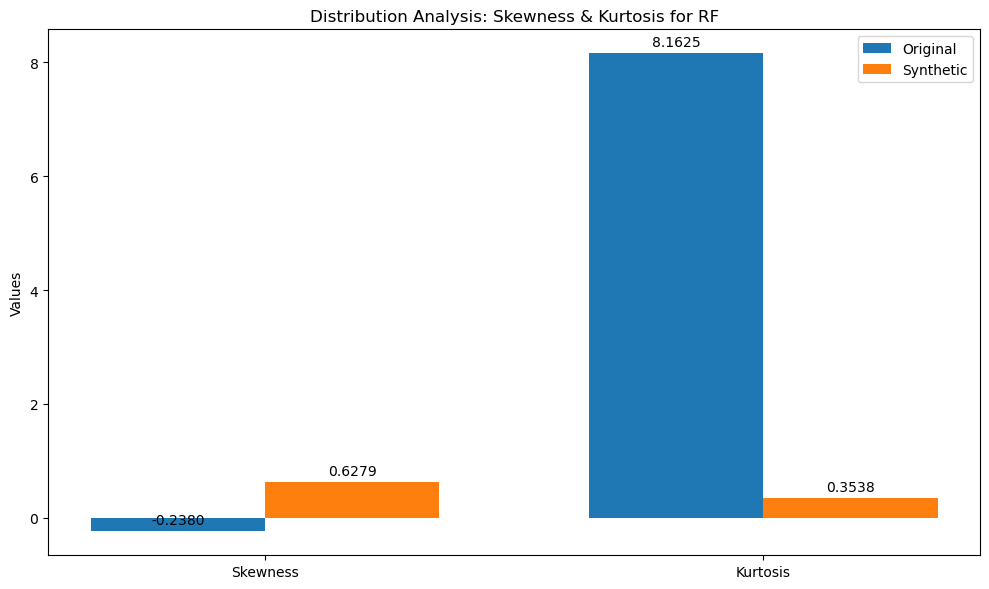

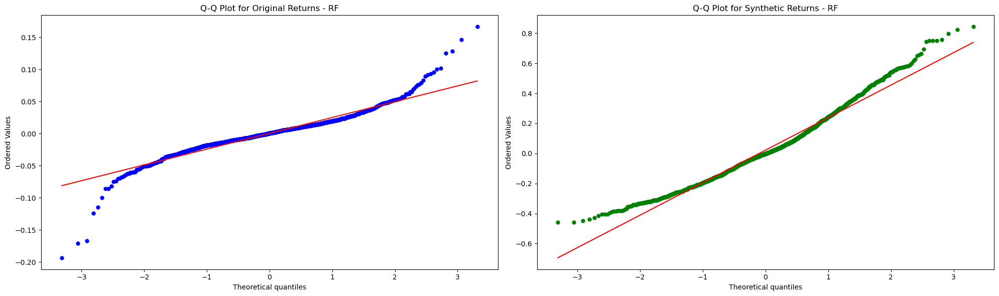


Distributional Analysis for RJF:
K-S Statistic: 0.4037
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.3512		0.7395
Kurtosis:	7.9712		0.1429


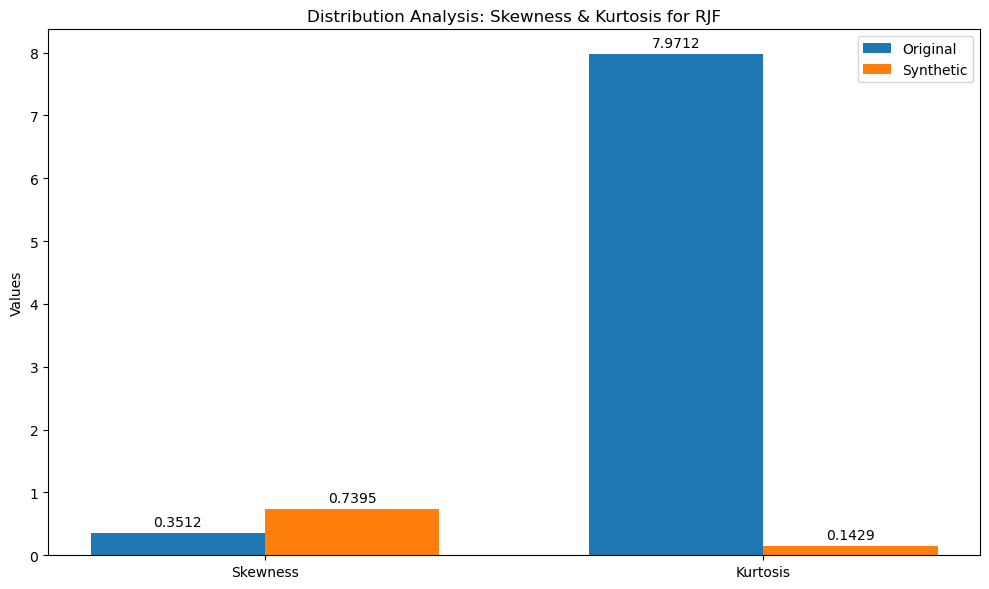

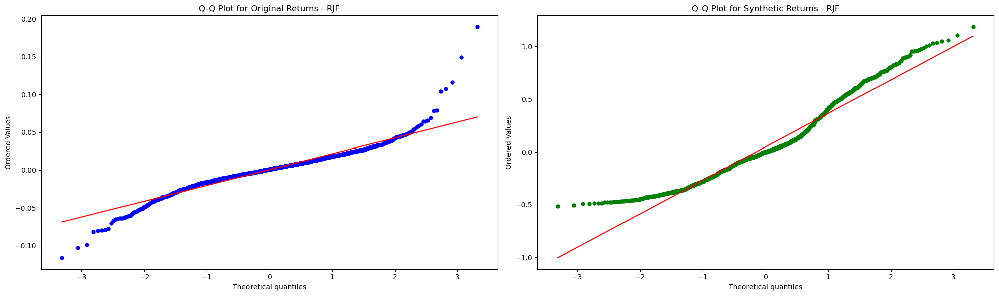


Distributional Analysis for SCHW:
K-S Statistic: 0.4135
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.1765		0.8921
Kurtosis:	6.6041		0.8135


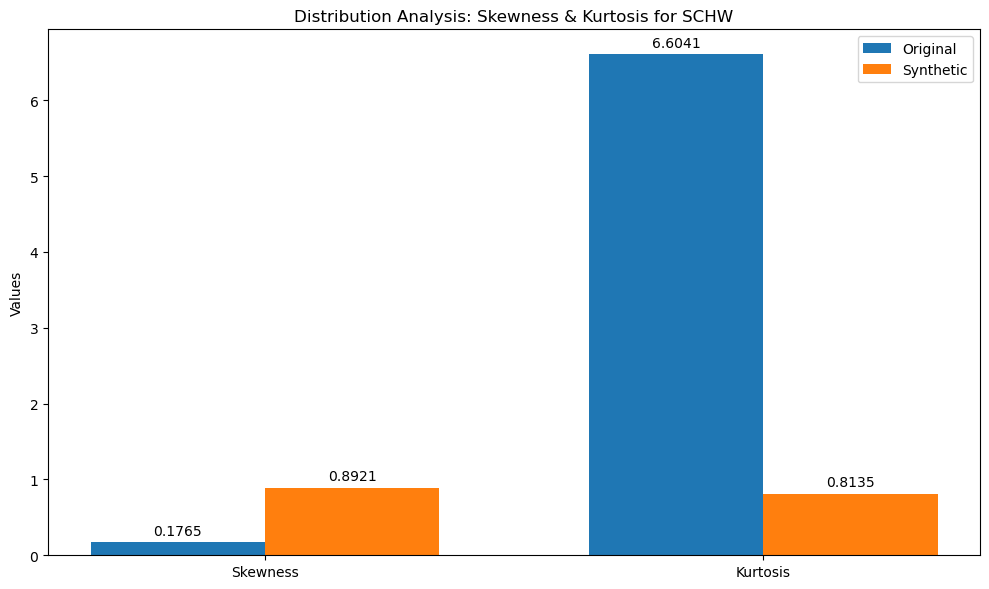

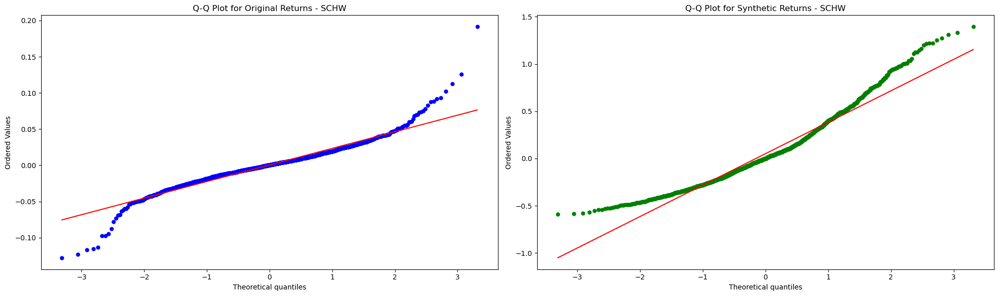


Distributional Analysis for STT:
K-S Statistic: 0.3622
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.0710		0.9165
Kurtosis:	10.5834		1.8283


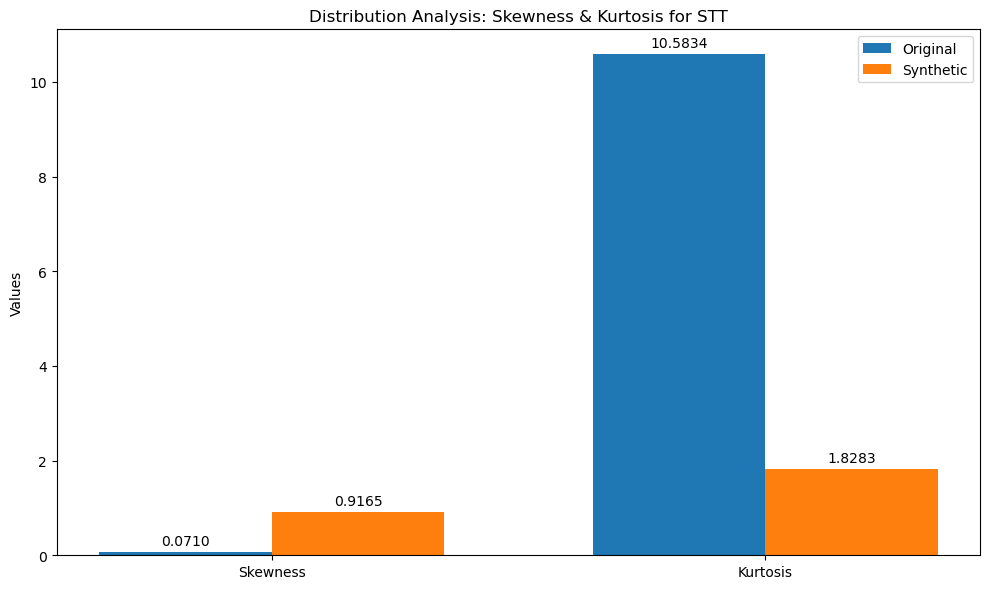

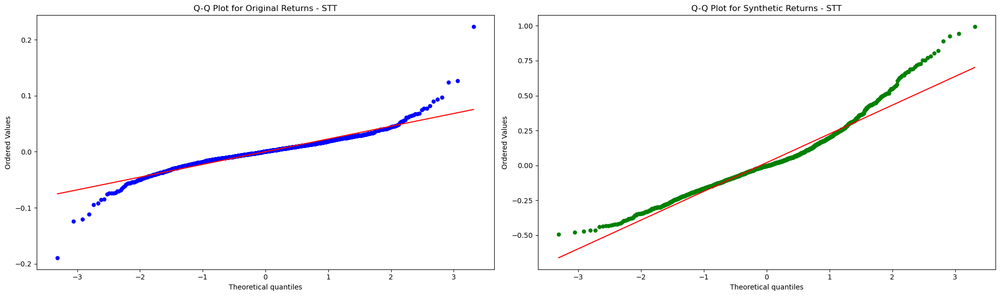


Distributional Analysis for TFC:
K-S Statistic: 0.3581
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.2529		1.1990
Kurtosis:	9.7909		3.7656


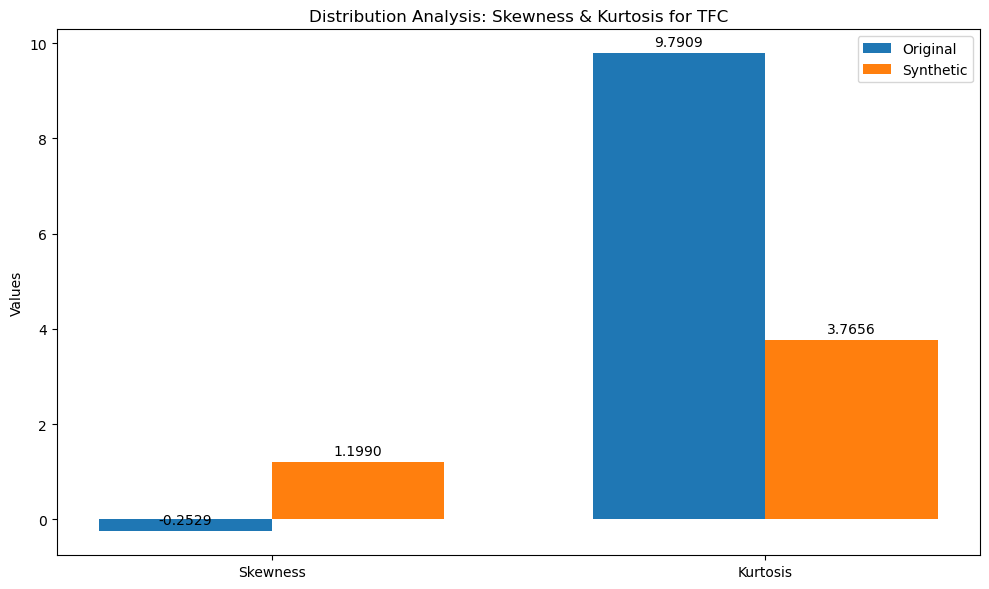

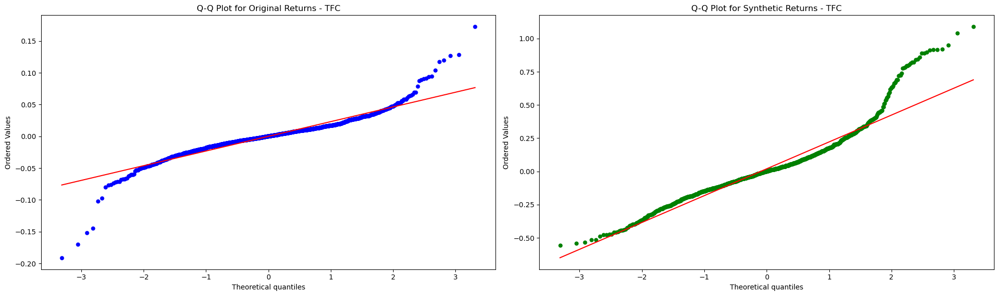


Distributional Analysis for TROW:
K-S Statistic: 0.4015
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.3326		0.7668
Kurtosis:	8.3729		0.6279


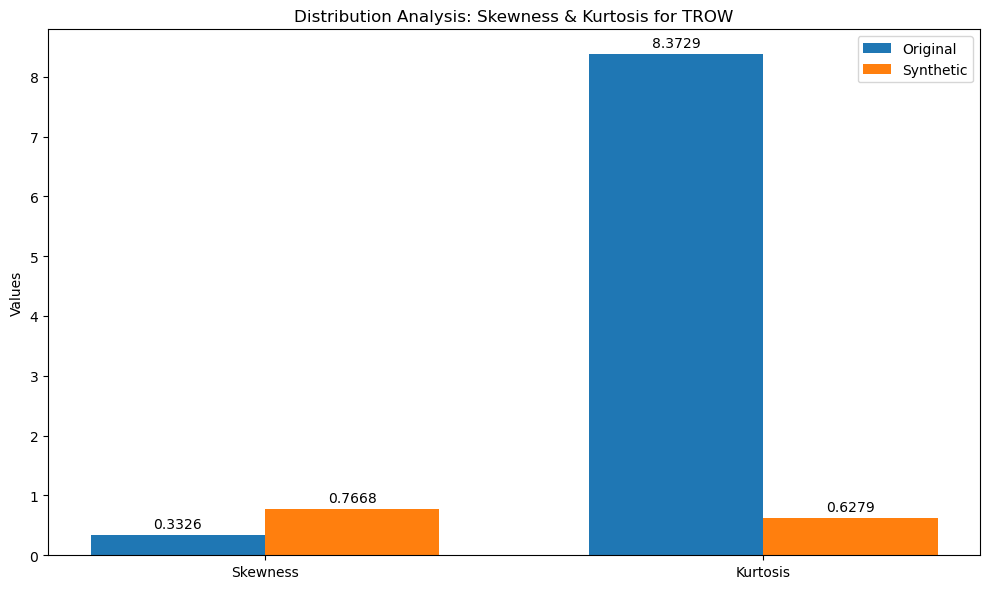

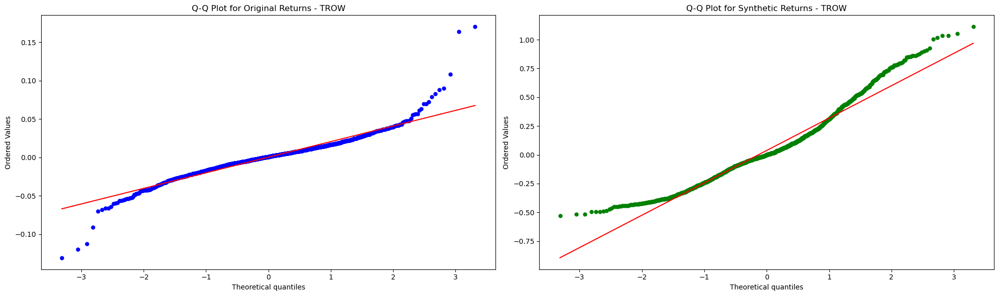


Distributional Analysis for USB:
K-S Statistic: 0.3268
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	0.1408		1.0167
Kurtosis:	8.9720		3.2524


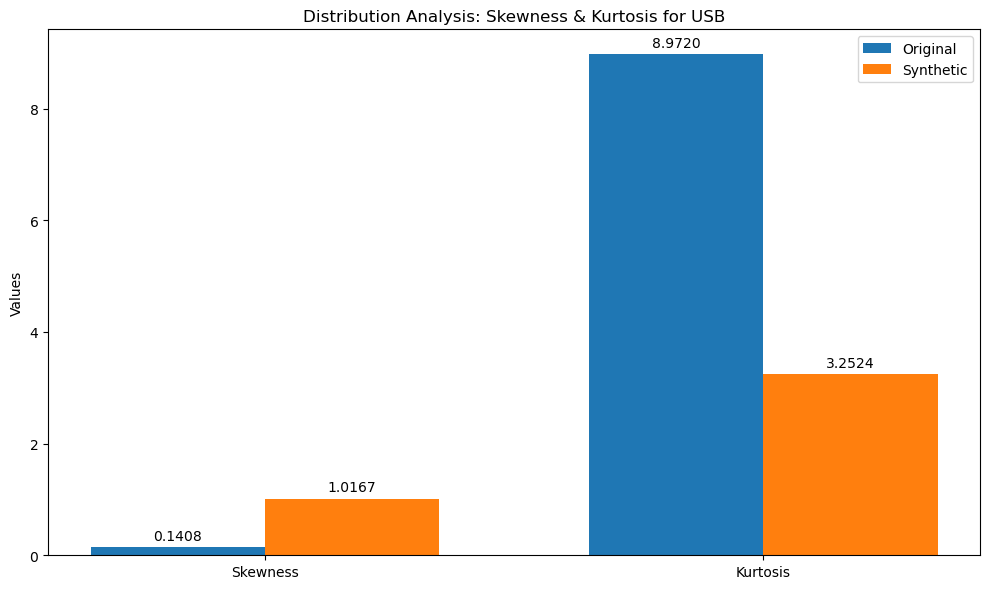

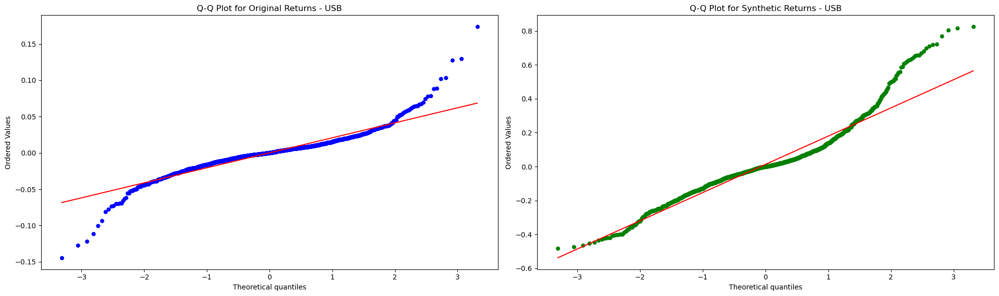


Distributional Analysis for WFC:
K-S Statistic: 0.3494
K-S P-value: 0.0000

Metrics		Original	Synthetic
Skewness:	-0.0159		0.7672
Kurtosis:	7.1286		2.6848


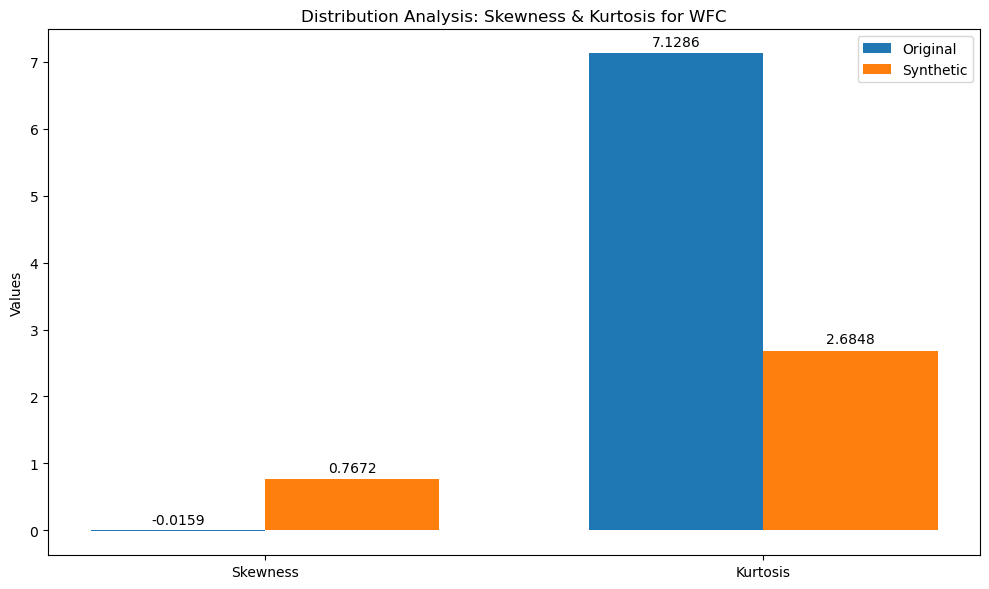

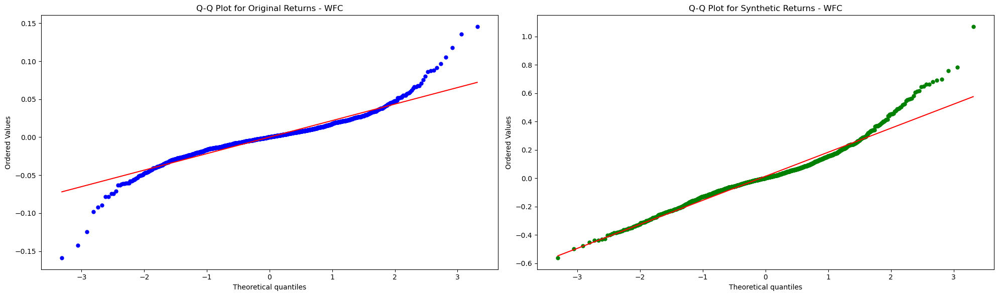

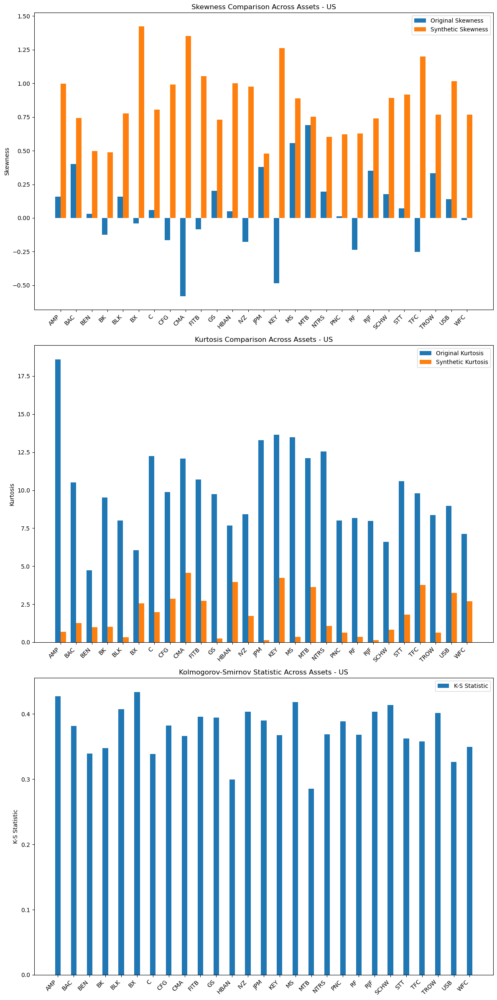


Original Portfolio:

Portfolio Distribution Metrics:
Skewness: -0.0004
Kurtosis: 9.0353


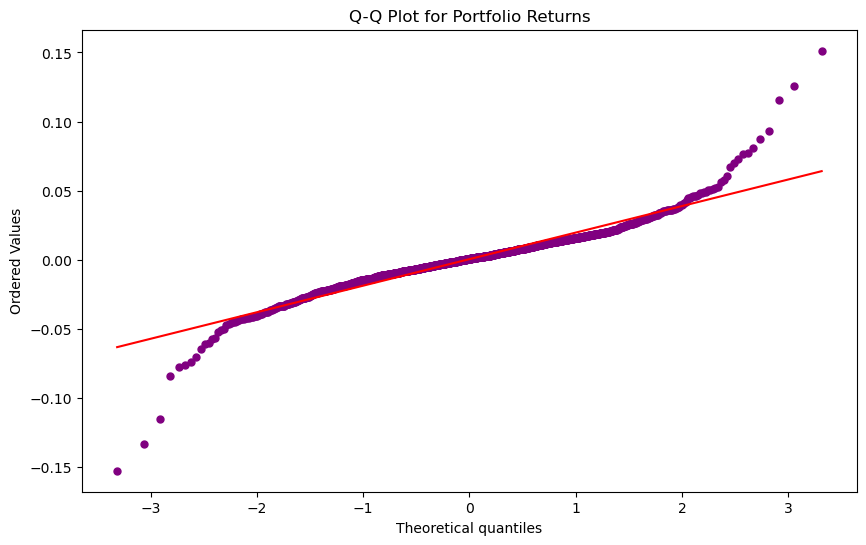


Synthetic Portfolio:

Portfolio Distribution Metrics:
Skewness: 0.6954
Kurtosis: 0.6835


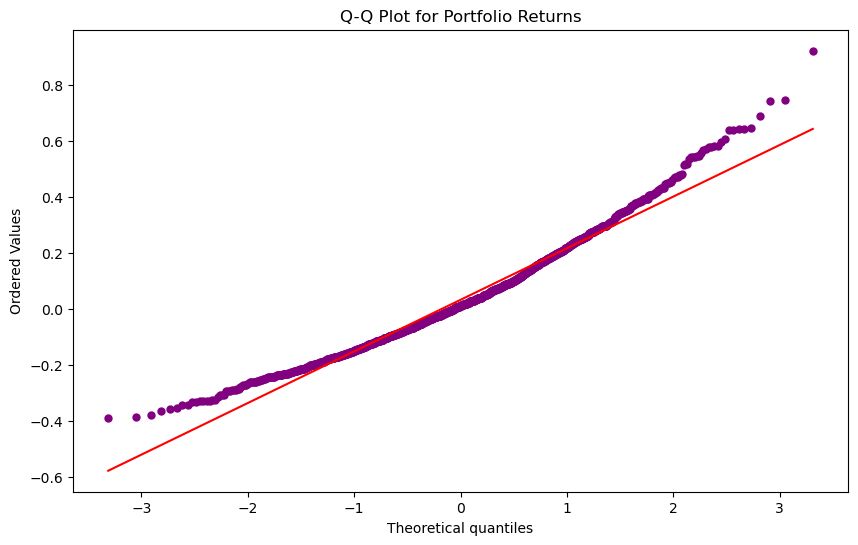

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats

def analyze_distribution(original_data, synthetic_data):
    original_returns = original_data.pct_change().dropna()
    synthetic_returns = synthetic_data.pct_change().dropna()

    # Lists to store metrics for aggregate chart
    assets = []
    original_skewness = []
    synthetic_skewness = []
    original_kurtosis = []
    synthetic_kurtosis = []
    ks_statistics = []

    for column in original_returns.columns:
        # K-S Test
        ks_statistic, ks_pvalue = stats.ks_2samp(original_returns[column], synthetic_returns[column])

        # Skewness and Kurtosis
        orig_skew = stats.skew(original_returns[column])
        synth_skew = stats.skew(synthetic_returns[column])
        orig_kurt = stats.kurtosis(original_returns[column])
        synth_kurt = stats.kurtosis(synthetic_returns[column])

        # Store metrics for aggregate chart
        assets.append(column)
        original_skewness.append(orig_skew)
        synthetic_skewness.append(synth_skew)
        original_kurtosis.append(orig_kurt)
        synthetic_kurtosis.append(synth_kurt)
        ks_statistics.append(ks_statistic)

        # Print Results
        print(f"\nDistributional Analysis for {column}:")
        print(f"K-S Statistic: {ks_statistic:.4f}")
        print(f"K-S P-value: {ks_pvalue:.4f}")
        print("\nMetrics\t\tOriginal\tSynthetic")
        print(f"Skewness:\t{orig_skew:.4f}\t\t{synth_skew:.4f}")
        print(f"Kurtosis:\t{orig_kurt:.4f}\t\t{synth_kurt:.4f}")

        # Individual asset visualization
        labels = ['Skewness', 'Kurtosis']
        original_metrics = [orig_skew, orig_kurt]
        synthetic_metrics = [synth_skew, synth_kurt]

        x = np.arange(len(labels))
        width = 0.35

        fig, ax = plt.subplots(figsize=(10, 6))
        rects1 = ax.bar(x - width/2, original_metrics, width, label='Original')
        rects2 = ax.bar(x + width/2, synthetic_metrics, width, label='Synthetic')

        ax.set_ylabel('Values')
        ax.set_title(f'Distribution Analysis: Skewness & Kurtosis for {column}')
        ax.set_xticks(x)
        ax.set_xticklabels(labels)
        ax.legend()

        def autolabel(rects):
            for rect in rects:
                height = rect.get_height()
                ax.annotate(f'{height:.4f}',
                            xy=(rect.get_x() + rect.get_width() / 2, height),
                            xytext=(0, 3),
                            textcoords="offset points",
                            ha='center', va='bottom')

        autolabel(rects1)
        autolabel(rects2)

        plt.tight_layout()
        plt.show()

        # Q-Q plots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
        
        stats.probplot(original_returns[column], dist="norm", plot=ax1, fit=True)
        ax1.get_lines()[0].set_markerfacecolor('blue')
        ax1.get_lines()[0].set_markeredgecolor('blue')
        ax1.get_lines()[0].set_markersize(5)
        ax1.get_lines()[1].set_color('red')
        ax1.set_title(f'Q-Q Plot for Original Returns - {column}')

        stats.probplot(synthetic_returns[column], dist="norm", plot=ax2, fit=True)
        ax2.get_lines()[0].set_markerfacecolor('green')
        ax2.get_lines()[0].set_markeredgecolor('green')
        ax2.get_lines()[0].set_markersize(5)
        ax2.get_lines()[1].set_color('red')
        ax2.set_title(f'Q-Q Plot for Synthetic Returns - {column}')

        plt.tight_layout()
        plt.show()

    # Aggregate charts
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 24))
    x = np.arange(len(assets))
    width = 0.35

    # Skewness comparison
    ax1.bar(x - width/2, original_skewness, width, label='Original Skewness')
    ax1.bar(x + width/2, synthetic_skewness, width, label='Synthetic Skewness')
    ax1.set_ylabel('Skewness')
    ax1.set_title('Skewness Comparison Across Assets - US')
    ax1.set_xticks(x)
    ax1.set_xticklabels(assets, rotation=45, ha='right')
    ax1.legend()

    # Kurtosis comparison
    ax2.bar(x - width/2, original_kurtosis, width, label='Original Kurtosis')
    ax2.bar(x + width/2, synthetic_kurtosis, width, label='Synthetic Kurtosis')
    ax2.set_ylabel('Kurtosis')
    ax2.set_title('Kurtosis Comparison Across Assets - US')
    ax2.set_xticks(x)
    ax2.set_xticklabels(assets, rotation=45, ha='right')
    ax2.legend()

    # K-S statistic comparison
    ax3.bar(x, ks_statistics, width, label='K-S Statistic')
    ax3.set_ylabel('K-S Statistic')
    ax3.set_title('Kolmogorov-Smirnov Statistic Across Assets - US')
    ax3.set_xticks(x)
    ax3.set_xticklabels(assets, rotation=45, ha='right')
    ax3.legend()

    plt.tight_layout()
    plt.show()

def analyze_portfolio_distribution(data, weights=None):
    if weights is None:
        weights = np.ones(len(data.columns)) / len(data.columns)  # Equal weights if not provided
    
    portfolio_returns = (data.pct_change().dropna() * weights).sum(axis=1)
    
    print("\nPortfolio Distribution Metrics:")
    print(f"Skewness: {stats.skew(portfolio_returns):.4f}")
    print(f"Kurtosis: {stats.kurtosis(portfolio_returns):.4f}")
    
    # Q-Q plot for portfolio
    fig, ax = plt.subplots(figsize=(10, 6))
    stats.probplot(portfolio_returns, dist="norm", plot=ax, fit=True)
    ax.get_lines()[0].set_markerfacecolor('purple')
    ax.get_lines()[0].set_markeredgecolor('purple')
    ax.get_lines()[0].set_markersize(5)
    ax.get_lines()[1].set_color('red')
    ax.set_title('Q-Q Plot for Portfolio Returns')
    plt.show()

# Assuming stock_data and rescaled_synthetic_data are available
# If they're not, you might need to load or recreate them here

# Perform the distributional analysis
analyze_distribution(stock_data, rescaled_synthetic_data)

print("\nOriginal Portfolio:")
analyze_portfolio_distribution(stock_data)

print("\nSynthetic Portfolio:")
analyze_portfolio_distribution(rescaled_synthetic_data)